In [1]:
# Importing dependencies
import glob
import pickle
import numpy as np
import numpy
from matplotlib import pyplot as plt
from music21 import converter, instrument, note, chord, stream
import pathlib
import os
# http://pytorch.org/
from os.path import exists, join
# from wheel.pep425tags import get_abbr_impl, get_impl_ver, get_abi_tag
# platform = '{}{}-{}'.format(get_abbr_impl(), get_impl_ver(), get_abi_tag())
# cuda_output = !ldconfig -p|grep cudart.so|sed -e 's/.*\.\([0-9]*\)\.\([0-9]*\)$/cu\1\2/'
# accelerator = cuda_output[0] if exists('/dev/nvidia0') else 'cpu'

# !pip install -q http://download.pytorch.org/whl/{accelerator}/torch-1.0.0-{platform}-linux_x86_64.whl torchvision
device = 'cuda'
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

In [2]:
HOME = "./Data"
MUSICIAN = 'midi_songs'

#file = join(HOME, "chopin/chpn_op25_e1_format0.mid")
#midi = converter.parse(file)
#notes_to_parse = midi.flat.notes
#for element in notes_to_parse[:10]:
 # print(element, element.offset)

In [3]:
notes = []

notes_file_path = os.path.join(HOME, MUSICIAN, 'notes.pickle')
#if os.path.exists(notes_file_path):
  #  with open(notes_file_path , 'rb') as f:
       # notes = pickle.load(f)
#else:
for i ,file in enumerate(glob.glob(os.path.join(HOME, MUSICIAN,"*.mid"))):
  midi_p = pathlib.Path(file)
  midi_file_name = midi_p.stem
#   if os.path.exists(os.path.join(HOME, MUSICIAN, '{}_notes.pickle'.format(midi_file_name))):
#       with open(os.path.join(HOME, MUSICIAN, '{}_notes.pickle'.format(midi_file_name)), 'rb') as filepath:
#         notes_ = pickle.load(filepath)
#       notes += (notes_)
#       continue
  midi = converter.parse(file)
  print('\r', 'Parsing file ', i, " ",file, end='')
  notes_to_parse = None
  #   try: # file has instrument parts
#   s2 = instrument.partitionByInstrument(midi)
#   notes_to_parse = s2.parts[0].recurse() 
  #   except: # file has notes in a flat structure
  notes_to_parse = midi.flat.notes
  #notes.append('start')
  for element in notes_to_parse:
    if isinstance(element, note.Note):
      notes.append(str(element.pitch))
    elif isinstance(element, chord.Chord):
      notes.append('.'.join(str(n) for n in element.normalOrder))
  #notes.append('end')
with open(join(HOME, MUSICIAN, 'notes.pickle'), 'wb') as filepath:
  pickle.dump(notes, filepath)     

 Parsing file  91   ./Data/midi_songs/tifap.mid

In [4]:
#We obtain the number of different notes in our dataset, because this will be the number of possible output classes of our model.
# Count different possible outputs
n_vocab = (len(set(notes)))

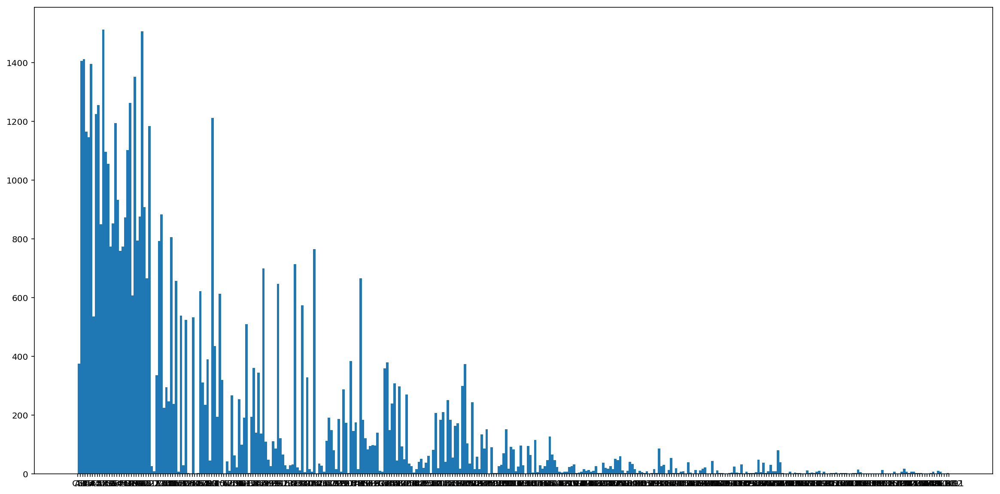

In [5]:
%matplotlib inline
plt.figure(figsize=(20,10))
plt.hist(notes, bins=n_vocab, )
plt.show()

In [6]:
def to_categorical(y, num_classes=None, dtype='float32'):
    """Converts a class vector (integers) to binary class matrix.
    E.g. for use with categorical_crossentropy.
    # Arguments
        y: class vector to be converted into a matrix
            (integers from 0 to num_classes).
        num_classes: total number of classes.
        dtype: The data type expected by the input, as a string
            (`float32`, `float64`, `int32`...)
    # Returns
        A binary matrix representation of the input. The classes axis
        is placed last.
    # Example
    ```python
    # Consider an array of 5 labels out of a set of 3 classes {0, 1, 2}:
    > labels
    array([0, 2, 1, 2, 0])
    # `to_categorical` converts this into a matrix with as many
    # columns as there are classes. The number of rows
    # stays the same.
    > to_categorical(labels)
    array([[ 1.,  0.,  0.],
           [ 0.,  0.,  1.],
           [ 0.,  1.,  0.],
           [ 0.,  0.,  1.],
           [ 1.,  0.,  0.]], dtype=float32)
    ```
    """

    y = np.array(y, dtype='int')
    input_shape = y.shape
    if input_shape and input_shape[-1] == 1 and len(input_shape) > 1:
        input_shape = tuple(input_shape[:-1])
    y = y.ravel()
    if not num_classes:
        num_classes = np.max(y) + 1
    n = y.shape[0]
    categorical = np.zeros((n, num_classes), dtype=dtype)
    categorical[np.arange(n), y] = 1
    output_shape = input_shape + (num_classes,)
    categorical = np.reshape(categorical, output_shape)
    return categorical

In [7]:
sequence_length = 100
# get all pitch names
pitchnames = sorted(set(item for item in notes))
# create a dictionary to map pitches to integers
note_to_int = dict((note, number) for number, note in enumerate(pitchnames))
network_input = []
network_output = []
for i in range(0, len(notes) - sequence_length, 1):
  sequence_in = notes[i:i + sequence_length] # Size sequence_length
  sequence_out = notes[i + sequence_length]  # Size 1
  is_end = False
  for j, n in enumerate(sequence_in):
    if n == 'end':
      i = j + 1
      is_end = True
      continue
    if is_end:
      sequence_in[j] = 'end'
  if is_end:
    sequence_out = 'end'
  # Map pitches of sequence_in to integers
  network_input.append([note_to_int[char] for char in sequence_in])
  # Map integer of sequence_out to an integer
  network_output.append(note_to_int[sequence_out]) 
n_patterns = len(network_input)
# reshape the input into a format compatible with LSTM layers
network_input = numpy.reshape(network_input, (n_patterns, sequence_length, 1))
# normalize input 
network_input = network_input / float(n_vocab)
network_output = np.array(network_output)

In [81]:
n_vocab

359

In [79]:
class LSTMGenerator(nn.Module):
  def __init__(self, input_dim, hidden_dim, vocab_size, batch_size=1):
    super(LSTMGenerator, self).__init__()
    self.batch_size = batch_size
    self.hidden_dim = hidden_dim
    self.lstm_layer = nn.LSTM(input_dim , hidden_dim)
    self.lstm_layer1 = nn.LSTM(hidden_dim , hidden_dim)
    self.lstm_layer2 = nn.LSTM(hidden_dim , hidden_dim)
    self.first_hidden_layer = self.init_hidden()
    self.second_hidden_layer = self.init_hidden()
    self.from_hidden_to_linear = nn.Linear(hidden_dim, 256)
    self.from_hidden_to_vocab = nn.Linear(256, n_vocab)
#     self.log_softmax = nn.LogSoftmax(dim =1)
      
      
      
  def init_hidden(self):
    # Before we've done anything, we dont have any hidden state.
    # Refer to the Pytorch documentation to see exactly
    # why they have this dimensionality.
    # The axes semantics are (num_layers, minibatch_size, hidden_dim)
#     if device == "cuda":
#         return (torch.zeros(1, self.batch_size, self.hidden_dim).cuda(),
#               torch.zeros(1, self.batch_size, self.hidden_dim).cuda())
#hidden and cell state init
    return (torch.zeros(1, self.batch_size, self.hidden_dim).to(device),
      torch.zeros(1, self.batch_size, self.hidden_dim).to(device))
  
  def forward(self, seq):
    lstm_out, self.first_hidden_layer = self.lstm_layer(seq, self.first_hidden_layer)
    lstm_out = F.dropout(lstm_out ,0.3)
    #lstm1 ,self.second_hidden_layer = self.lstm_layer1(lstm_out, self.second_hidden_layer)
    lstm1 ,self.second_hidden_layer = self.lstm_layer1(lstm_out, self.second_hidden_layer)
#     lstm1 = F.dropout(lstm1, 0.3)
#     lstm2, _ = self.lstm_layer2(lstm1 ,self.second_hidden_layer)
    linear_layer = self.from_hidden_to_linear(lstm1)
    linear_layer = F.dropout(linear_layer, 0.3)
    linear_layer1 = self.from_hidden_to_vocab(linear_layer)
#     scores = self.log_softmax(linear_layer1)
    return linear_layer1
    

  

In [67]:
network_input.shape

(60398, 100, 1)

In [68]:
network_output.shape

(60398,)

In [69]:
from random import sample, seed, shuffle

In [70]:

seed(0)
def split_train_val_test(input_, gt, train_f=1., val_f=0.0, test_f=0.0):
  assert len(gt) == len(input_)
  inds = list(range(input_.shape[0]))
  inds_train = sample(inds, int(input_.shape[0] * train_f))
  inds_val_test = list(set(inds) - set(inds_train))
  inds_val = sample(inds, int(len(inds_val_test) * val_f))
  inds_test = list(set(inds_val_test) - set(inds_val))
  
  datasets = {
              "train": [input_[inds_train, ...], gt[inds_train]],
              "val": [input_[inds_val, ...], gt[inds_val]],
              "test": [input_[inds_test, ...], gt[inds_test]]
              }
  return datasets

In [71]:
datasets1 = split_train_val_test(network_input, network_output)

In [72]:

print(len(datasets1["train"][0]))
print(len(datasets1["val"][0]))
print(len(datasets1["test"][0]))

60398
0
0


In [73]:

print(datasets1["train"][0][0])

[[0.79108635]
 [0.83008357]
 [0.88579387]
 [0.75766017]
 [0.86908078]
 [0.86350975]
 [0.86908078]
 [0.86350975]
 [0.86629526]
 [0.86629526]
 [0.98607242]
 [0.98607242]
 [0.86629526]
 [0.98607242]
 [0.86629526]
 [0.98607242]
 [0.95264624]
 [0.86908078]
 [0.95264624]
 [0.86908078]
 [0.86629526]
 [0.79108635]
 [0.86629526]
 [0.79108635]
 [0.79108635]
 [0.86629526]
 [0.86629526]
 [0.79108635]
 [0.86350975]
 [0.86908078]
 [0.86350975]
 [0.86908078]
 [0.86908078]
 [0.86908078]
 [0.88857939]
 [0.88857939]
 [0.92479109]
 [0.92479109]
 [0.59610028]
 [0.86350975]
 [0.59610028]
 [0.86350975]
 [0.86629526]
 [0.98607242]
 [0.86629526]
 [0.98607242]
 [0.59610028]
 [0.92479109]
 [0.92479109]
 [0.59610028]
 [0.83008357]
 [0.99164345]
 [0.86350975]
 [0.83008357]
 [0.99164345]
 [0.86350975]
 [0.98607242]
 [0.82729805]
 [0.82729805]
 [0.98607242]
 [0.61559889]
 [0.92479109]
 [0.61559889]
 [0.92479109]
 [0.72423398]
 [0.99164345]
 [0.99164345]
 [0.72423398]
 [0.63788301]
 [0.63788301]
 [0.63788301]
 [0.63

In [74]:
train_in, train_gt = datasets1["train"]
val_in, val_gt = datasets1["val"]
test_in, test_gt = datasets1["test"]


In [75]:

def seqs_t_batch(data, batch_size, is_shuffle=False):
  data_in = data[0]
  data_gt = data[1]
  if is_shuffle:
    shuffle_indxs = list(range(len(data_in)))
    shuffle(shuffle_indxs)
    data_in = [data_in[idx] for idx in shuffle_indxs]
    data_gt = [data_gt[idx] for idx in shuffle_indxs]
  
  for batch_ind in range(batch_size, len(data_in), batch_size):
    if device == "cuda":
        yield torch.tensor(data_in[batch_ind - batch_size:batch_ind]).cuda(), torch.tensor(data_gt[batch_ind - batch_size:batch_ind]).cuda()
    else:
        yield torch.tensor(data_in[batch_ind - batch_size:batch_ind]), torch.tensor(data_gt[batch_ind - batch_size:batch_ind])


In [76]:
from torch.nn import init
def init_weights(layer):
  if hasattr(layer, "weight"):
    init.xavier_normal(layer.weight)
    layer.bias.data.fill_(0.01)

In [77]:
# !export PATH=$PATH:/usr/local/cuda/bin
# !export CUDADIR=/usr/local/cuda
# !export LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/usr/local/cuda/lib64
# !export  DYLD_LIBRARY_PATH=/usr/local/cuda/lib:$DYLD_LIBRARY_PATH

/home/shirel/.local/share/virtualenvs/liat-YzECUMJM/lib/python3.6/site-packages/ipykernel_launcher.py:4: UserWarning: nn.init.xavier_normal is now deprecated in favor of nn.init.xavier_normal_.
  after removing the cwd from sys.path.


0
Epoch: 0, Iteration: 100, Loss: 4.748180866241455
Epoch: 0, Iteration: 200, Loss: 4.6197710037231445
Epoch: 0, Iteration: 300, Loss: 4.823572158813477
Epoch: 0, Iteration: 400, Loss: 4.6861114501953125
Epoch: 0, Iteration: 500, Loss: 4.7749433517456055
Epoch: 0, Iteration: 600, Loss: 4.495696544647217
Epoch: 0, Iteration: 700, Loss: 4.540526390075684
Epoch: 0, Iteration: 800, Loss: 4.640015125274658
Epoch: 0, Iteration: 900, Loss: 4.564931869506836


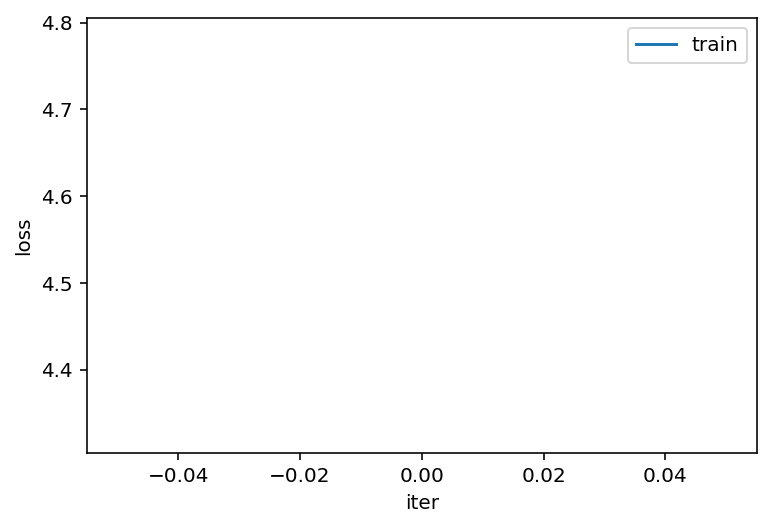

1
Epoch: 1, Iteration: 1000, Loss: 4.60088586807251
Epoch: 1, Iteration: 1100, Loss: 4.6636962890625
Epoch: 1, Iteration: 1200, Loss: 4.773015975952148
Epoch: 1, Iteration: 1300, Loss: 4.494071960449219
Epoch: 1, Iteration: 1400, Loss: 4.536006450653076
Epoch: 1, Iteration: 1500, Loss: 4.273948669433594
Epoch: 1, Iteration: 1600, Loss: 4.403293609619141
Epoch: 1, Iteration: 1700, Loss: 4.32750129699707
Epoch: 1, Iteration: 1800, Loss: 4.378478527069092


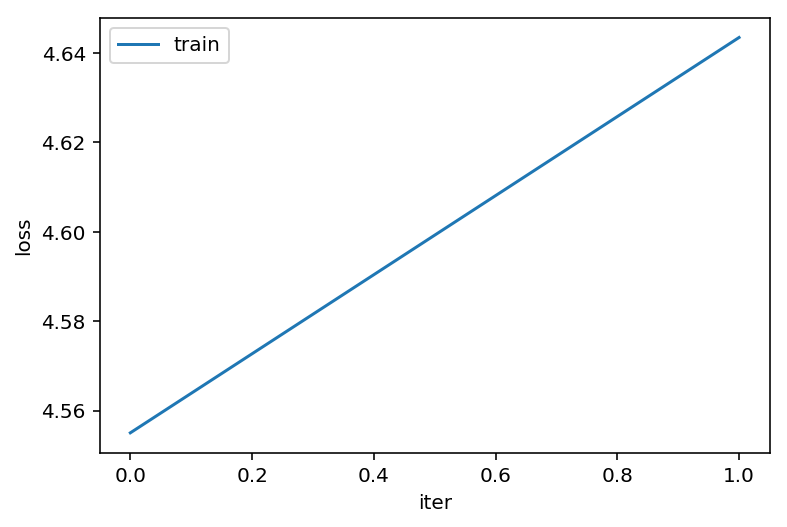

2
Epoch: 2, Iteration: 1900, Loss: 4.537065029144287
Epoch: 2, Iteration: 2000, Loss: 4.448002815246582
Epoch: 2, Iteration: 2100, Loss: 4.632283687591553
Epoch: 2, Iteration: 2200, Loss: 4.414867401123047
Epoch: 2, Iteration: 2300, Loss: 4.4604620933532715
Epoch: 2, Iteration: 2400, Loss: 4.339094161987305
Epoch: 2, Iteration: 2500, Loss: 4.278939247131348
Epoch: 2, Iteration: 2600, Loss: 4.3973870277404785
Epoch: 2, Iteration: 2700, Loss: 4.351161479949951
Epoch: 2, Iteration: 2800, Loss: 4.370260715484619


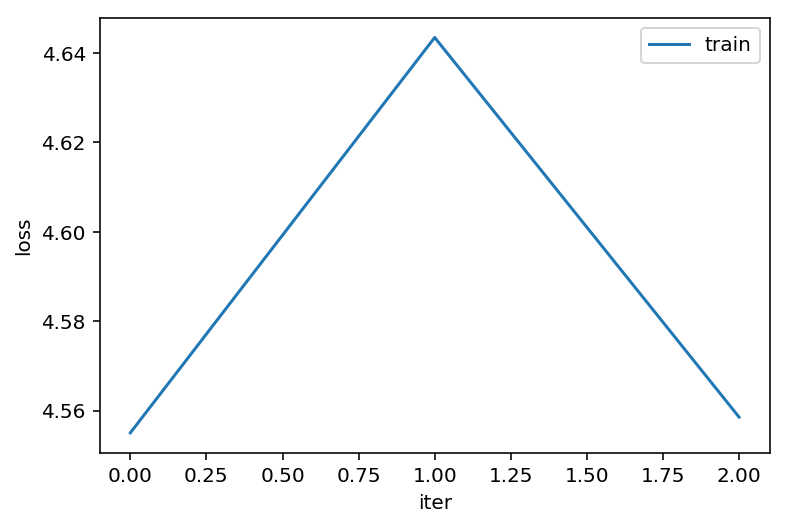

3
Epoch: 3, Iteration: 2900, Loss: 4.538937568664551
Epoch: 3, Iteration: 3000, Loss: 4.348130226135254
Epoch: 3, Iteration: 3100, Loss: 4.406259059906006
Epoch: 3, Iteration: 3200, Loss: 4.397459983825684
Epoch: 3, Iteration: 3300, Loss: 4.525528907775879
Epoch: 3, Iteration: 3400, Loss: 4.751328468322754
Epoch: 3, Iteration: 3500, Loss: 4.461209774017334
Epoch: 3, Iteration: 3600, Loss: 4.601824760437012
Epoch: 3, Iteration: 3700, Loss: 4.420403003692627


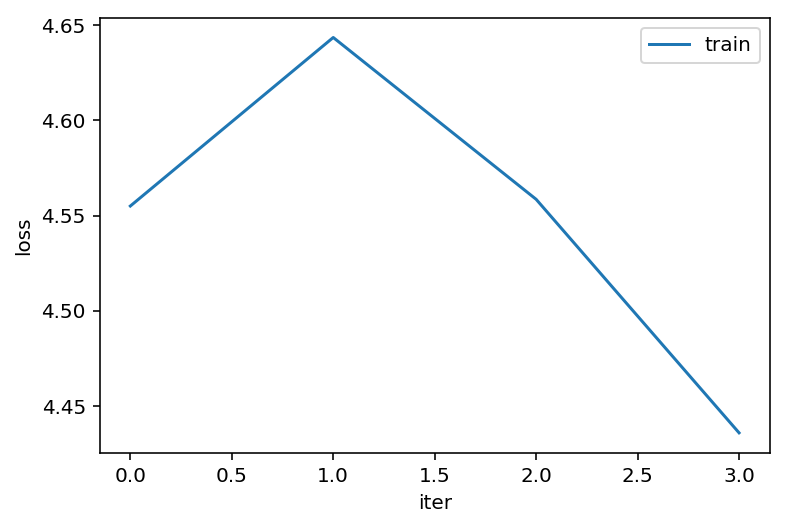

4
Epoch: 4, Iteration: 3800, Loss: 4.406871795654297
Epoch: 4, Iteration: 3900, Loss: 4.2728047370910645
Epoch: 4, Iteration: 4000, Loss: 4.4259562492370605
Epoch: 4, Iteration: 4100, Loss: 4.3736491203308105
Epoch: 4, Iteration: 4200, Loss: 4.421895980834961
Epoch: 4, Iteration: 4300, Loss: 4.479410171508789
Epoch: 4, Iteration: 4400, Loss: 4.662195205688477
Epoch: 4, Iteration: 4500, Loss: 4.281322002410889
Epoch: 4, Iteration: 4600, Loss: 4.541511058807373
Epoch: 4, Iteration: 4700, Loss: 4.326241970062256


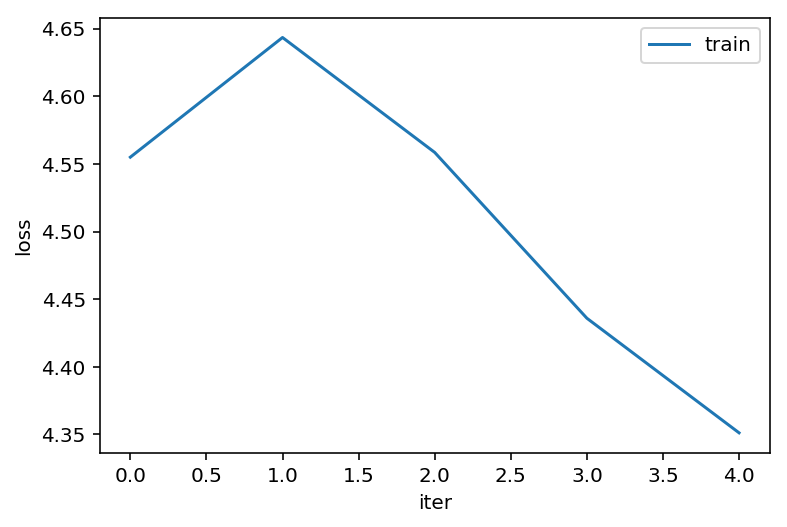

5
Epoch: 5, Iteration: 4800, Loss: 4.2598042488098145
Epoch: 5, Iteration: 4900, Loss: 4.383884429931641
Epoch: 5, Iteration: 5000, Loss: 4.344197750091553
Epoch: 5, Iteration: 5100, Loss: 4.453061103820801
Epoch: 5, Iteration: 5200, Loss: 4.522336959838867
Epoch: 5, Iteration: 5300, Loss: 4.608975410461426
Epoch: 5, Iteration: 5400, Loss: 4.458217144012451
Epoch: 5, Iteration: 5500, Loss: 4.227841854095459
Epoch: 5, Iteration: 5600, Loss: 4.50791597366333


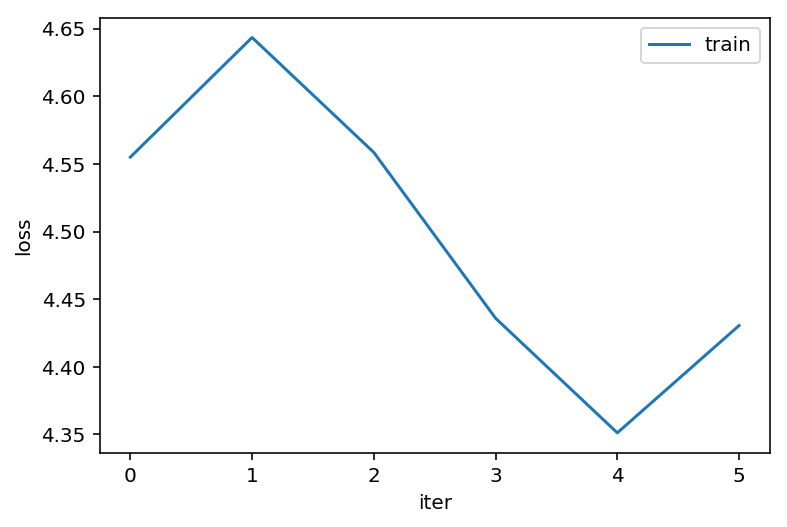

6
Epoch: 6, Iteration: 5700, Loss: 4.722200870513916
Epoch: 6, Iteration: 5800, Loss: 4.377613067626953
Epoch: 6, Iteration: 5900, Loss: 4.386771202087402
Epoch: 6, Iteration: 6000, Loss: 4.72730827331543
Epoch: 6, Iteration: 6100, Loss: 4.23514986038208
Epoch: 6, Iteration: 6200, Loss: 4.273530960083008
Epoch: 6, Iteration: 6300, Loss: 4.55814266204834
Epoch: 6, Iteration: 6400, Loss: 4.56344747543335
Epoch: 6, Iteration: 6500, Loss: 4.089502334594727
Epoch: 6, Iteration: 6600, Loss: 4.482938766479492


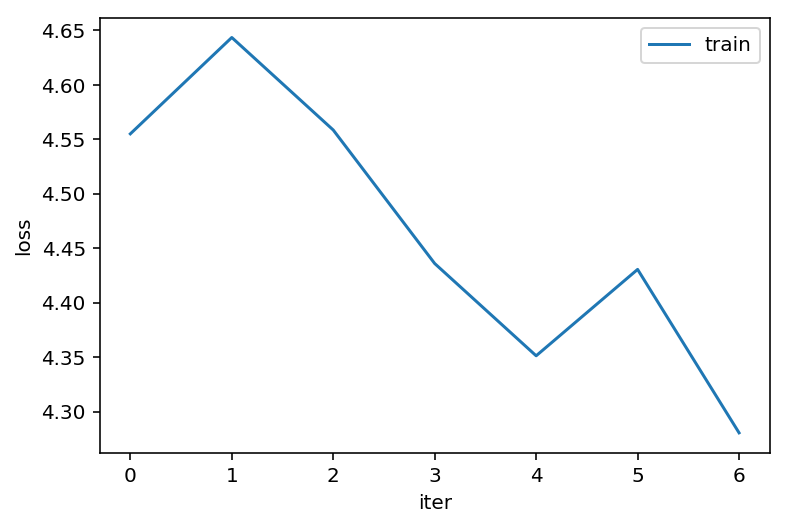

7
Epoch: 7, Iteration: 6700, Loss: 4.391127109527588
Epoch: 7, Iteration: 6800, Loss: 4.245832443237305
Epoch: 7, Iteration: 6900, Loss: 4.598690032958984
Epoch: 7, Iteration: 7000, Loss: 4.296144008636475
Epoch: 7, Iteration: 7100, Loss: 4.399769306182861
Epoch: 7, Iteration: 7200, Loss: 4.26601505279541
Epoch: 7, Iteration: 7300, Loss: 4.306873798370361
Epoch: 7, Iteration: 7400, Loss: 4.486548900604248
Epoch: 7, Iteration: 7500, Loss: 4.630794048309326


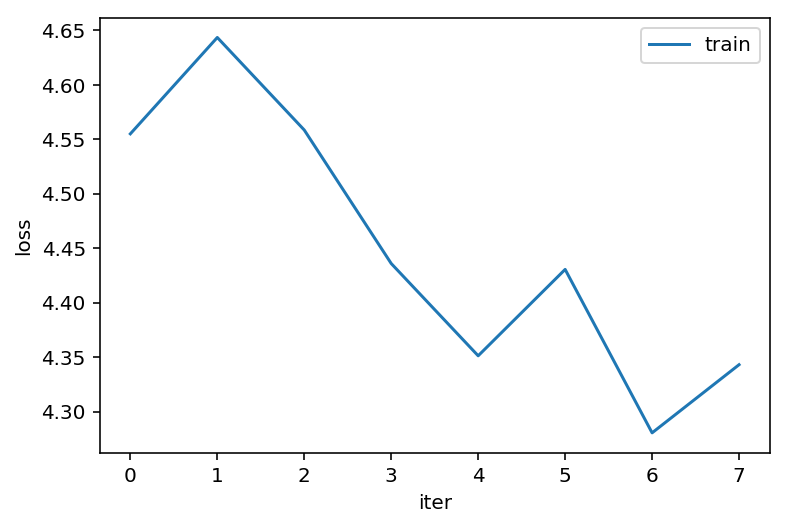

8
Epoch: 8, Iteration: 7600, Loss: 4.575605392456055
Epoch: 8, Iteration: 7700, Loss: 4.410080432891846
Epoch: 8, Iteration: 7800, Loss: 4.243837356567383
Epoch: 8, Iteration: 7900, Loss: 4.4123616218566895
Epoch: 8, Iteration: 8000, Loss: 4.457740783691406
Epoch: 8, Iteration: 8100, Loss: 4.31650447845459
Epoch: 8, Iteration: 8200, Loss: 4.386222839355469
Epoch: 8, Iteration: 8300, Loss: 4.55851411819458
Epoch: 8, Iteration: 8400, Loss: 4.234060287475586


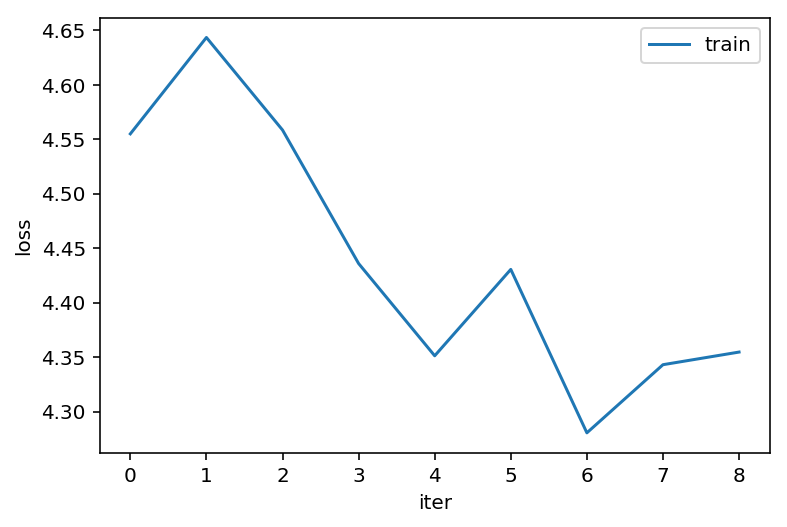

9
Epoch: 9, Iteration: 8500, Loss: 4.5268096923828125
Epoch: 9, Iteration: 8600, Loss: 4.238039493560791
Epoch: 9, Iteration: 8700, Loss: 4.572894096374512
Epoch: 9, Iteration: 8800, Loss: 4.539905548095703
Epoch: 9, Iteration: 8900, Loss: 4.345411777496338
Epoch: 9, Iteration: 9000, Loss: 4.438436985015869
Epoch: 9, Iteration: 9100, Loss: 4.375777721405029
Epoch: 9, Iteration: 9200, Loss: 4.293014049530029
Epoch: 9, Iteration: 9300, Loss: 4.527049541473389
Epoch: 9, Iteration: 9400, Loss: 4.385768890380859


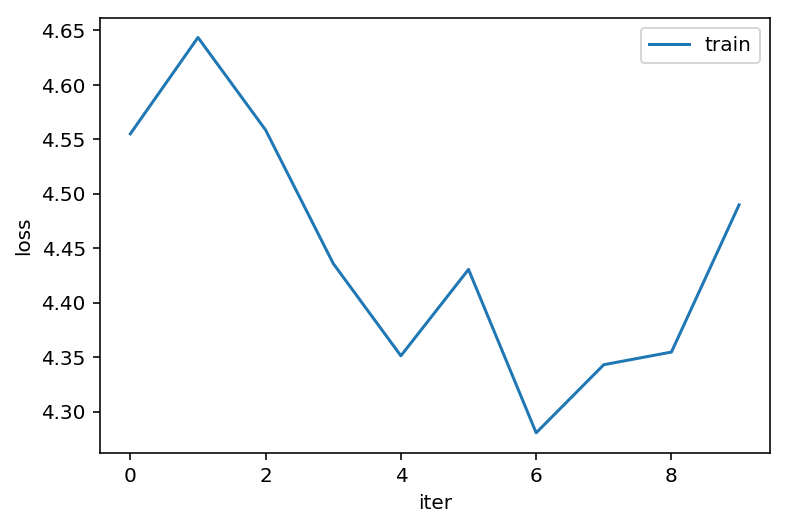

10
Epoch: 10, Iteration: 9500, Loss: 4.371668815612793
Epoch: 10, Iteration: 9600, Loss: 4.171868801116943
Epoch: 10, Iteration: 9700, Loss: 4.138115882873535
Epoch: 10, Iteration: 9800, Loss: 4.344885349273682
Epoch: 10, Iteration: 9900, Loss: 4.2167534828186035
Epoch: 10, Iteration: 10000, Loss: 4.455679416656494
Epoch: 10, Iteration: 10100, Loss: 4.333835124969482
Epoch: 10, Iteration: 10200, Loss: 4.176844596862793
Epoch: 10, Iteration: 10300, Loss: 4.388132572174072


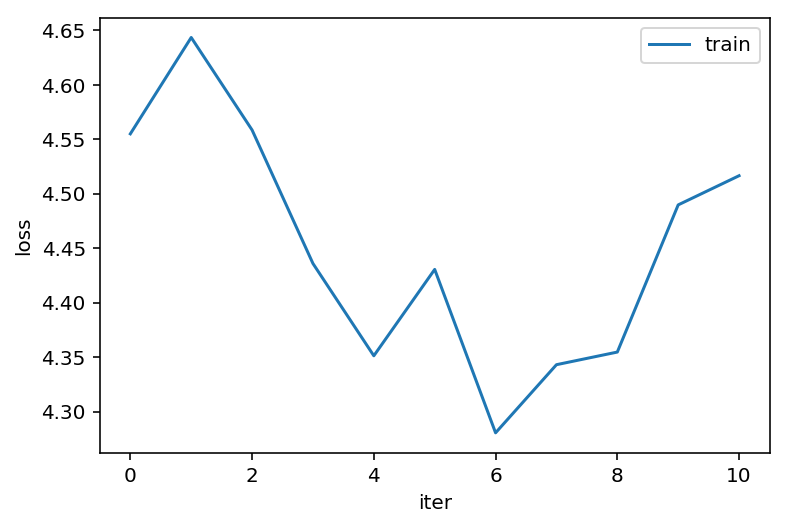

11
Epoch: 11, Iteration: 10400, Loss: 4.493964195251465
Epoch: 11, Iteration: 10500, Loss: 4.278014183044434
Epoch: 11, Iteration: 10600, Loss: 4.4441328048706055
Epoch: 11, Iteration: 10700, Loss: 4.470647811889648
Epoch: 11, Iteration: 10800, Loss: 4.3675150871276855
Epoch: 11, Iteration: 10900, Loss: 4.302448272705078
Epoch: 11, Iteration: 11000, Loss: 4.461010932922363
Epoch: 11, Iteration: 11100, Loss: 4.19481086730957
Epoch: 11, Iteration: 11200, Loss: 4.400723457336426
Epoch: 11, Iteration: 11300, Loss: 4.203155994415283


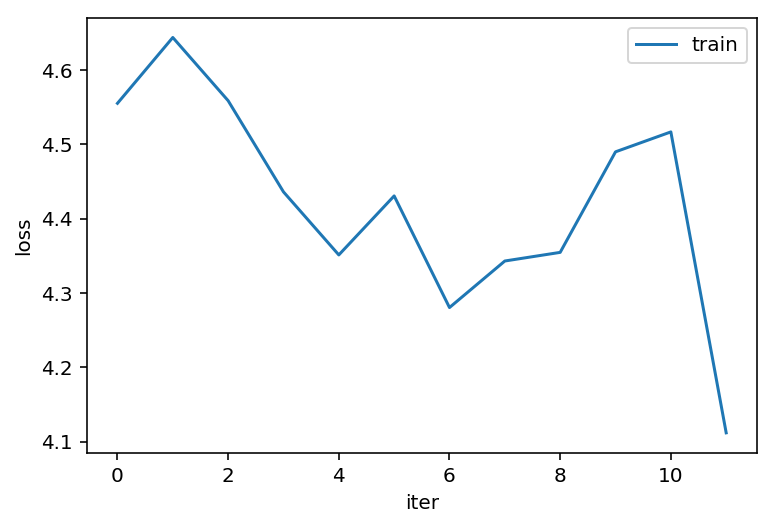

12
Epoch: 12, Iteration: 11400, Loss: 4.346245765686035
Epoch: 12, Iteration: 11500, Loss: 4.123302459716797
Epoch: 12, Iteration: 11600, Loss: 4.520717144012451
Epoch: 12, Iteration: 11700, Loss: 4.243338108062744
Epoch: 12, Iteration: 11800, Loss: 3.9602997303009033
Epoch: 12, Iteration: 11900, Loss: 4.273083209991455
Epoch: 12, Iteration: 12000, Loss: 4.254624366760254
Epoch: 12, Iteration: 12100, Loss: 4.240200519561768
Epoch: 12, Iteration: 12200, Loss: 4.179349899291992


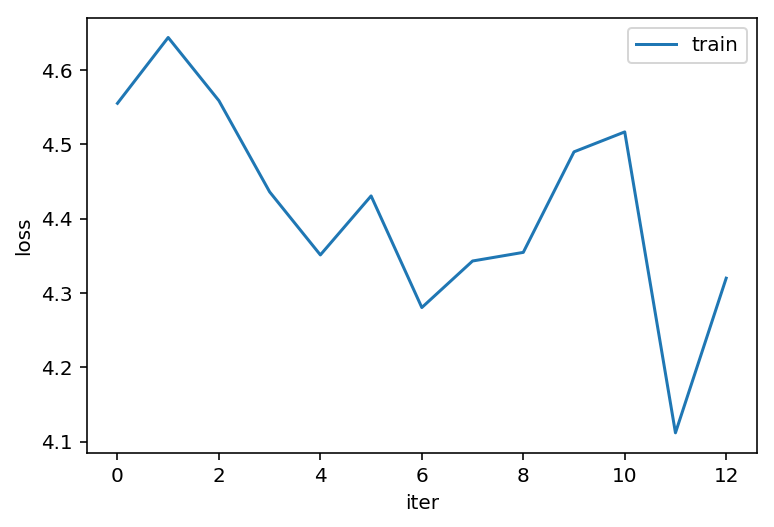

13
Epoch: 13, Iteration: 12300, Loss: 4.423938274383545
Epoch: 13, Iteration: 12400, Loss: 4.203995704650879
Epoch: 13, Iteration: 12500, Loss: 4.144033432006836
Epoch: 13, Iteration: 12600, Loss: 4.260368347167969
Epoch: 13, Iteration: 12700, Loss: 4.248486042022705
Epoch: 13, Iteration: 12800, Loss: 3.989628791809082
Epoch: 13, Iteration: 12900, Loss: 4.113894939422607
Epoch: 13, Iteration: 13000, Loss: 4.27553653717041
Epoch: 13, Iteration: 13100, Loss: 4.212680339813232
Epoch: 13, Iteration: 13200, Loss: 4.217864513397217


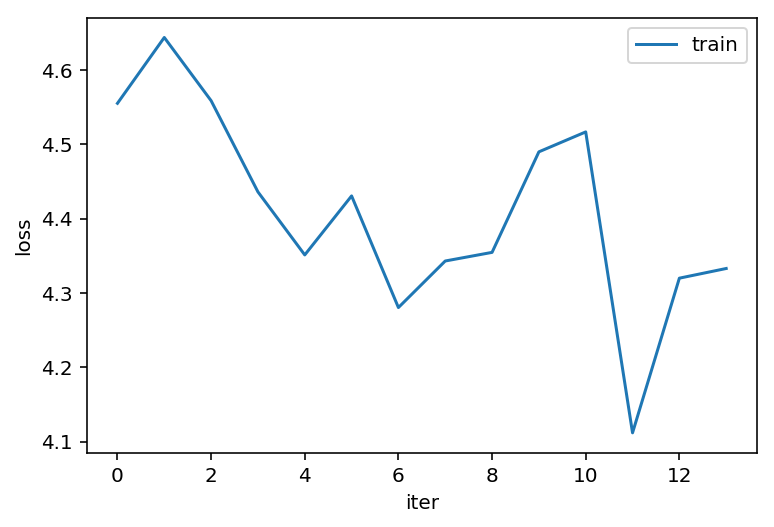

14
Epoch: 14, Iteration: 13300, Loss: 4.054165840148926
Epoch: 14, Iteration: 13400, Loss: 4.3387274742126465
Epoch: 14, Iteration: 13500, Loss: 4.299178600311279
Epoch: 14, Iteration: 13600, Loss: 4.076199531555176
Epoch: 14, Iteration: 13700, Loss: 4.336757659912109
Epoch: 14, Iteration: 13800, Loss: 4.413052082061768
Epoch: 14, Iteration: 13900, Loss: 4.253576278686523
Epoch: 14, Iteration: 14000, Loss: 4.175447463989258
Epoch: 14, Iteration: 14100, Loss: 4.455005168914795


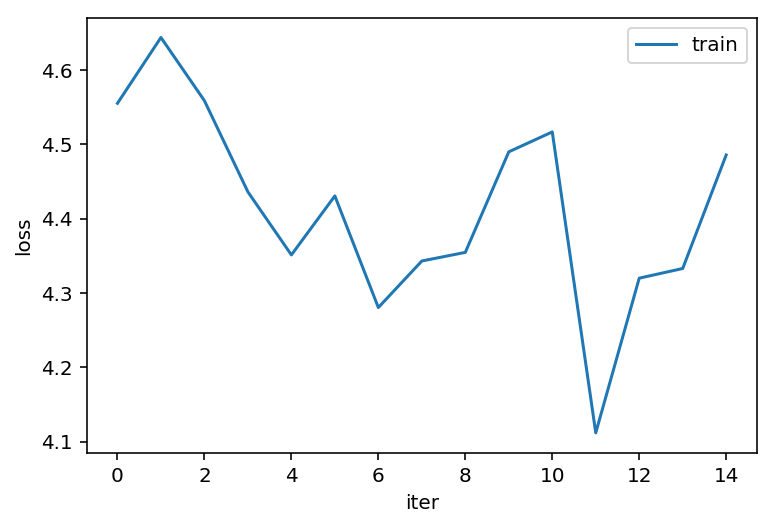

15
Epoch: 15, Iteration: 14200, Loss: 4.386735916137695
Epoch: 15, Iteration: 14300, Loss: 4.139716148376465
Epoch: 15, Iteration: 14400, Loss: 4.423079013824463
Epoch: 15, Iteration: 14500, Loss: 4.289212226867676
Epoch: 15, Iteration: 14600, Loss: 4.146383285522461
Epoch: 15, Iteration: 14700, Loss: 4.397921562194824
Epoch: 15, Iteration: 14800, Loss: 3.980617046356201
Epoch: 15, Iteration: 14900, Loss: 4.586434364318848
Epoch: 15, Iteration: 15000, Loss: 4.265396595001221


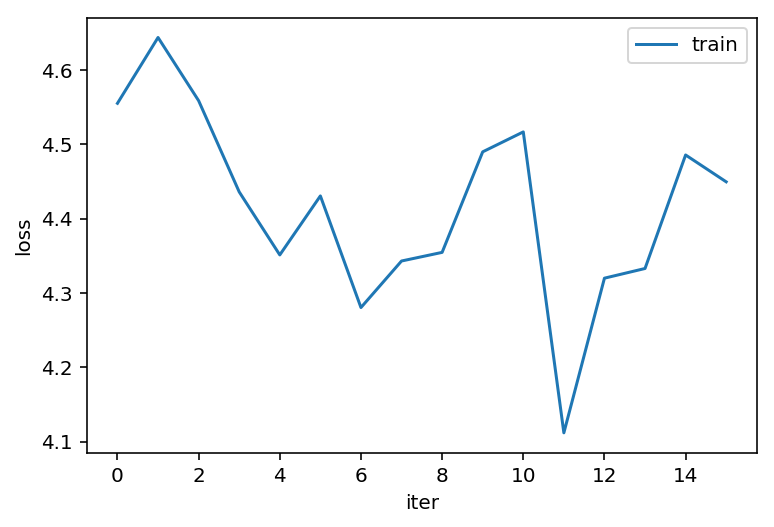

16
Epoch: 16, Iteration: 15100, Loss: 4.279630184173584
Epoch: 16, Iteration: 15200, Loss: 4.069823741912842
Epoch: 16, Iteration: 15300, Loss: 4.101617813110352
Epoch: 16, Iteration: 15400, Loss: 4.292167663574219
Epoch: 16, Iteration: 15500, Loss: 4.2175140380859375
Epoch: 16, Iteration: 15600, Loss: 3.9593372344970703
Epoch: 16, Iteration: 15700, Loss: 4.2657012939453125
Epoch: 16, Iteration: 15800, Loss: 4.538304328918457
Epoch: 16, Iteration: 15900, Loss: 4.266182899475098
Epoch: 16, Iteration: 16000, Loss: 4.275023937225342


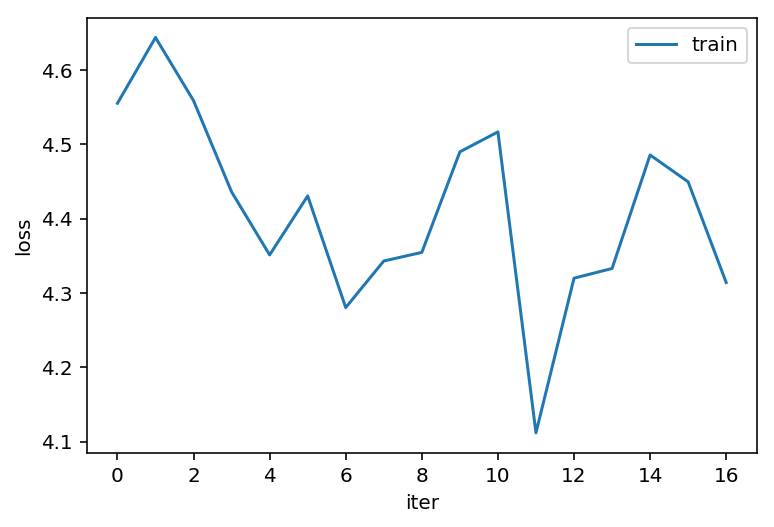

17
Epoch: 17, Iteration: 16100, Loss: 4.390742301940918
Epoch: 17, Iteration: 16200, Loss: 4.0208892822265625
Epoch: 17, Iteration: 16300, Loss: 4.350586414337158
Epoch: 17, Iteration: 16400, Loss: 4.101470470428467
Epoch: 17, Iteration: 16500, Loss: 4.243257999420166
Epoch: 17, Iteration: 16600, Loss: 4.270658493041992
Epoch: 17, Iteration: 16700, Loss: 3.9988884925842285
Epoch: 17, Iteration: 16800, Loss: 4.421611785888672
Epoch: 17, Iteration: 16900, Loss: 4.3597564697265625


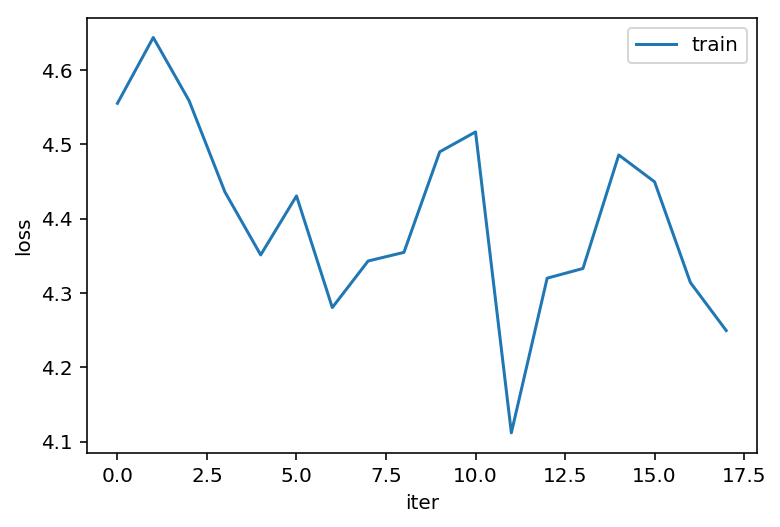

18
Epoch: 18, Iteration: 17000, Loss: 4.081427097320557
Epoch: 18, Iteration: 17100, Loss: 4.327808380126953
Epoch: 18, Iteration: 17200, Loss: 4.588067531585693
Epoch: 18, Iteration: 17300, Loss: 4.030986309051514
Epoch: 18, Iteration: 17400, Loss: 4.390232086181641
Epoch: 18, Iteration: 17500, Loss: 3.9375624656677246
Epoch: 18, Iteration: 17600, Loss: 4.462218761444092
Epoch: 18, Iteration: 17700, Loss: 4.258439064025879
Epoch: 18, Iteration: 17800, Loss: 4.105545997619629
Epoch: 18, Iteration: 17900, Loss: 4.356845855712891


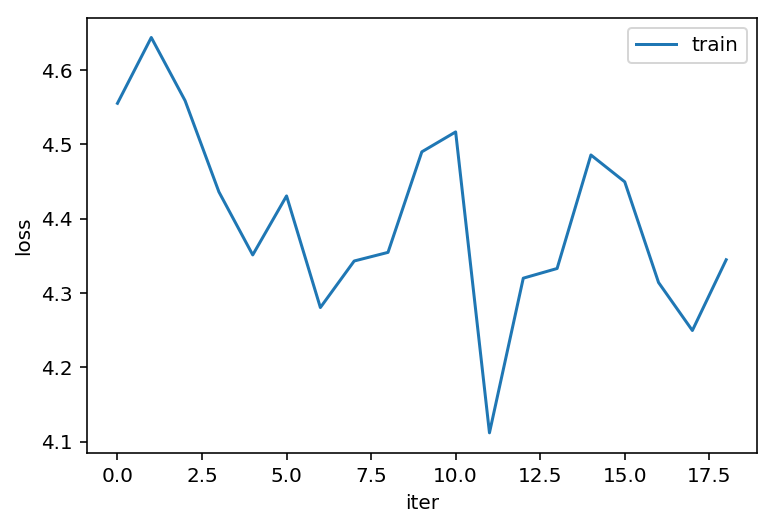

19
Epoch: 19, Iteration: 18000, Loss: 4.155649662017822
Epoch: 19, Iteration: 18100, Loss: 4.097367763519287
Epoch: 19, Iteration: 18200, Loss: 4.427130699157715
Epoch: 19, Iteration: 18300, Loss: 4.0928473472595215
Epoch: 19, Iteration: 18400, Loss: 4.091289043426514
Epoch: 19, Iteration: 18500, Loss: 4.154595375061035
Epoch: 19, Iteration: 18600, Loss: 4.0767903327941895
Epoch: 19, Iteration: 18700, Loss: 4.28803825378418
Epoch: 19, Iteration: 18800, Loss: 4.1720757484436035


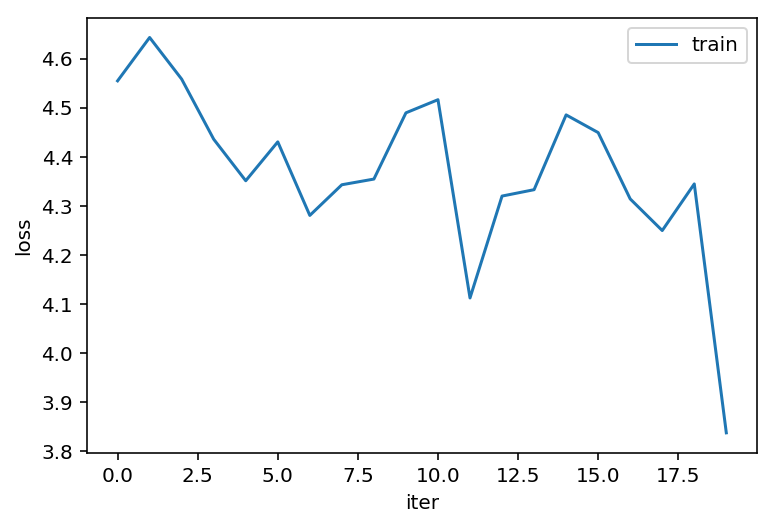

20
Epoch: 20, Iteration: 18900, Loss: 4.096553325653076
Epoch: 20, Iteration: 19000, Loss: 4.213625907897949
Epoch: 20, Iteration: 19100, Loss: 4.071788311004639
Epoch: 20, Iteration: 19200, Loss: 4.058953762054443
Epoch: 20, Iteration: 19300, Loss: 4.241614818572998
Epoch: 20, Iteration: 19400, Loss: 3.934086322784424
Epoch: 20, Iteration: 19500, Loss: 4.141968727111816
Epoch: 20, Iteration: 19600, Loss: 3.877575397491455
Epoch: 20, Iteration: 19700, Loss: 4.161834716796875
Epoch: 20, Iteration: 19800, Loss: 4.193201065063477


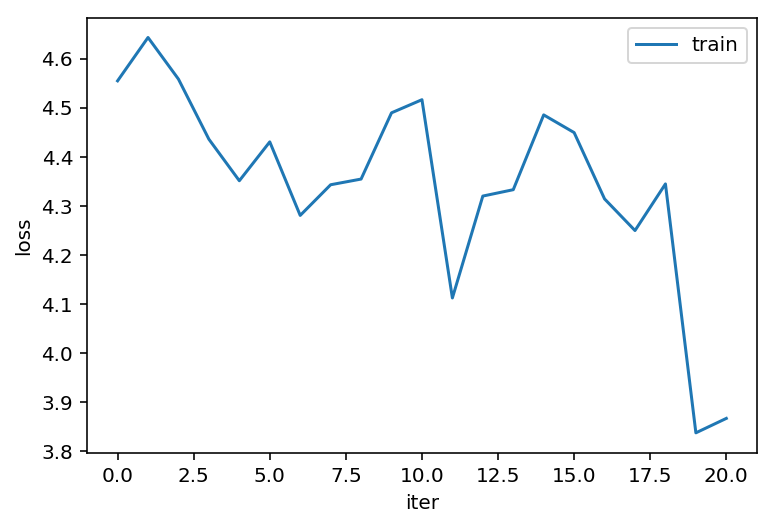

21
Epoch: 21, Iteration: 19900, Loss: 4.163043022155762
Epoch: 21, Iteration: 20000, Loss: 4.129497528076172
Epoch: 21, Iteration: 20100, Loss: 3.915663957595825
Epoch: 21, Iteration: 20200, Loss: 4.066057205200195
Epoch: 21, Iteration: 20300, Loss: 4.15332555770874
Epoch: 21, Iteration: 20400, Loss: 4.041701793670654
Epoch: 21, Iteration: 20500, Loss: 4.295828342437744
Epoch: 21, Iteration: 20600, Loss: 3.9138567447662354
Epoch: 21, Iteration: 20700, Loss: 4.089799404144287


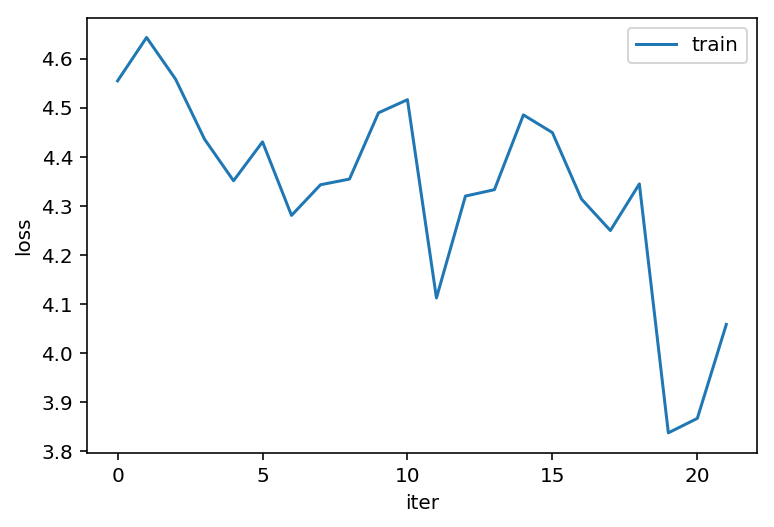

22
Epoch: 22, Iteration: 20800, Loss: 4.029839992523193
Epoch: 22, Iteration: 20900, Loss: 3.8147504329681396
Epoch: 22, Iteration: 21000, Loss: 3.886467456817627
Epoch: 22, Iteration: 21100, Loss: 4.197283744812012
Epoch: 22, Iteration: 21200, Loss: 4.235517501831055
Epoch: 22, Iteration: 21300, Loss: 4.489598274230957
Epoch: 22, Iteration: 21400, Loss: 4.131104469299316
Epoch: 22, Iteration: 21500, Loss: 4.170961380004883
Epoch: 22, Iteration: 21600, Loss: 3.9761452674865723


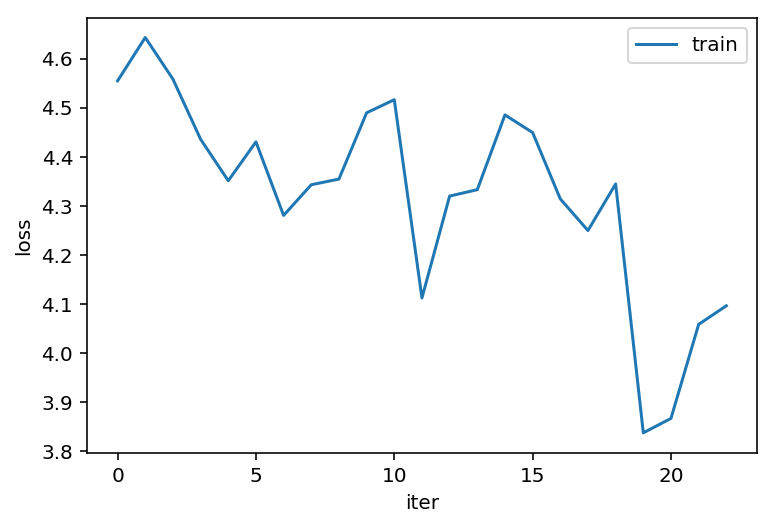

23
Epoch: 23, Iteration: 21700, Loss: 3.914407253265381
Epoch: 23, Iteration: 21800, Loss: 3.639860153198242
Epoch: 23, Iteration: 21900, Loss: 4.006383895874023
Epoch: 23, Iteration: 22000, Loss: 4.225688457489014
Epoch: 23, Iteration: 22100, Loss: 4.14979887008667
Epoch: 23, Iteration: 22200, Loss: 3.928931713104248
Epoch: 23, Iteration: 22300, Loss: 4.099884033203125
Epoch: 23, Iteration: 22400, Loss: 3.818859577178955
Epoch: 23, Iteration: 22500, Loss: 4.064628601074219
Epoch: 23, Iteration: 22600, Loss: 4.407022476196289


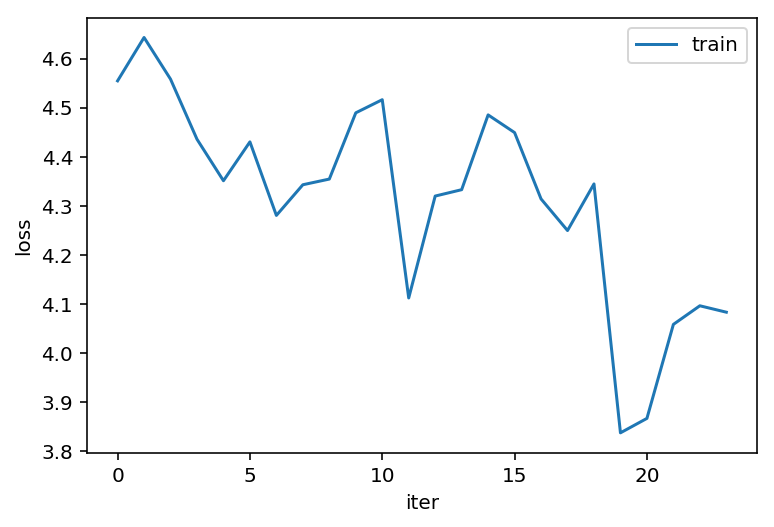

24
Epoch: 24, Iteration: 22700, Loss: 3.8957786560058594
Epoch: 24, Iteration: 22800, Loss: 3.8625259399414062
Epoch: 24, Iteration: 22900, Loss: 3.7667884826660156
Epoch: 24, Iteration: 23000, Loss: 4.3951287269592285
Epoch: 24, Iteration: 23100, Loss: 3.9793972969055176
Epoch: 24, Iteration: 23200, Loss: 4.081334590911865
Epoch: 24, Iteration: 23300, Loss: 3.7371826171875
Epoch: 24, Iteration: 23400, Loss: 4.119717121124268
Epoch: 24, Iteration: 23500, Loss: 4.0017547607421875


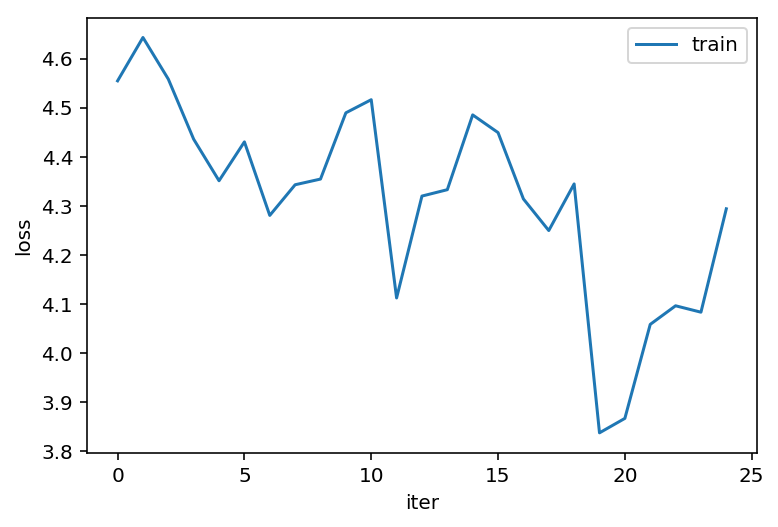

25
Epoch: 25, Iteration: 23600, Loss: 3.9084107875823975
Epoch: 25, Iteration: 23700, Loss: 4.137940883636475
Epoch: 25, Iteration: 23800, Loss: 4.305203437805176
Epoch: 25, Iteration: 23900, Loss: 3.9435057640075684
Epoch: 25, Iteration: 24000, Loss: 4.005292892456055
Epoch: 25, Iteration: 24100, Loss: 4.111577033996582
Epoch: 25, Iteration: 24200, Loss: 3.795201063156128
Epoch: 25, Iteration: 24300, Loss: 4.0830488204956055
Epoch: 25, Iteration: 24400, Loss: 3.9675817489624023
Epoch: 25, Iteration: 24500, Loss: 4.204755783081055


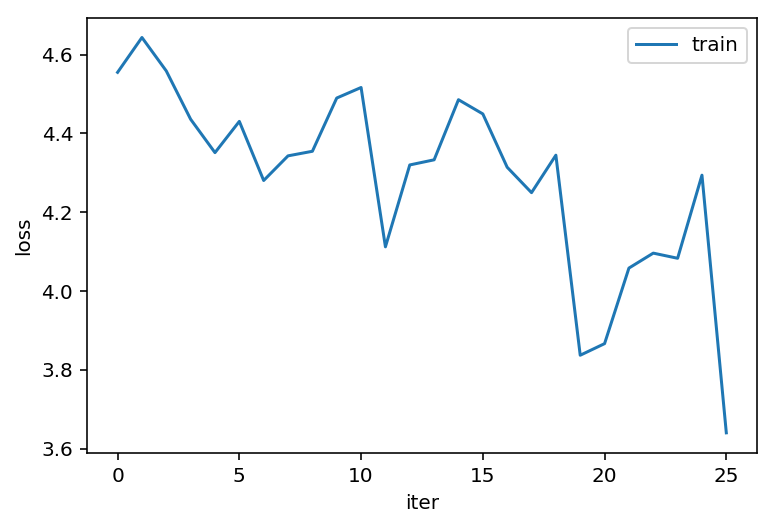

26
Epoch: 26, Iteration: 24600, Loss: 4.225615501403809
Epoch: 26, Iteration: 24700, Loss: 4.112361907958984
Epoch: 26, Iteration: 24800, Loss: 3.910249948501587
Epoch: 26, Iteration: 24900, Loss: 4.330729007720947
Epoch: 26, Iteration: 25000, Loss: 4.163527011871338
Epoch: 26, Iteration: 25100, Loss: 3.380859851837158
Epoch: 26, Iteration: 25200, Loss: 3.8037025928497314
Epoch: 26, Iteration: 25300, Loss: 4.004513263702393
Epoch: 26, Iteration: 25400, Loss: 3.769293785095215


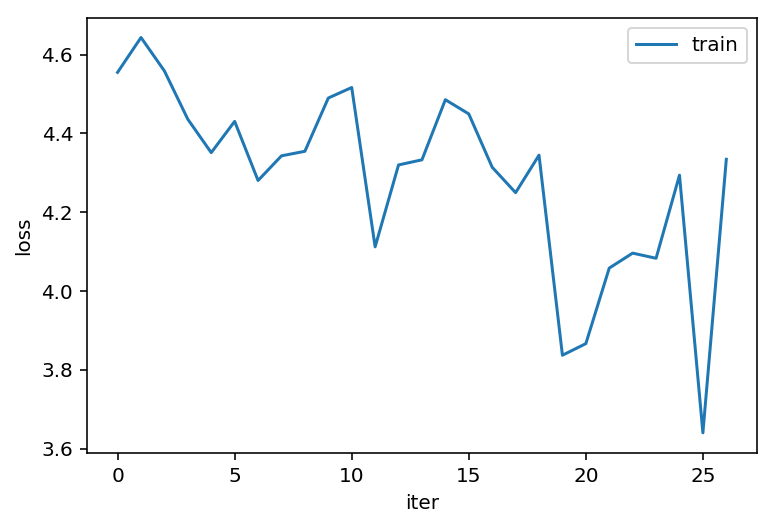

27
Epoch: 27, Iteration: 25500, Loss: 3.861168622970581
Epoch: 27, Iteration: 25600, Loss: 3.8765974044799805
Epoch: 27, Iteration: 25700, Loss: 4.123566150665283
Epoch: 27, Iteration: 25800, Loss: 3.808027982711792
Epoch: 27, Iteration: 25900, Loss: 3.9717941284179688
Epoch: 27, Iteration: 26000, Loss: 3.758486270904541
Epoch: 27, Iteration: 26100, Loss: 3.9814562797546387
Epoch: 27, Iteration: 26200, Loss: 3.9817709922790527
Epoch: 27, Iteration: 26300, Loss: 3.8256773948669434
Epoch: 27, Iteration: 26400, Loss: 3.8144164085388184


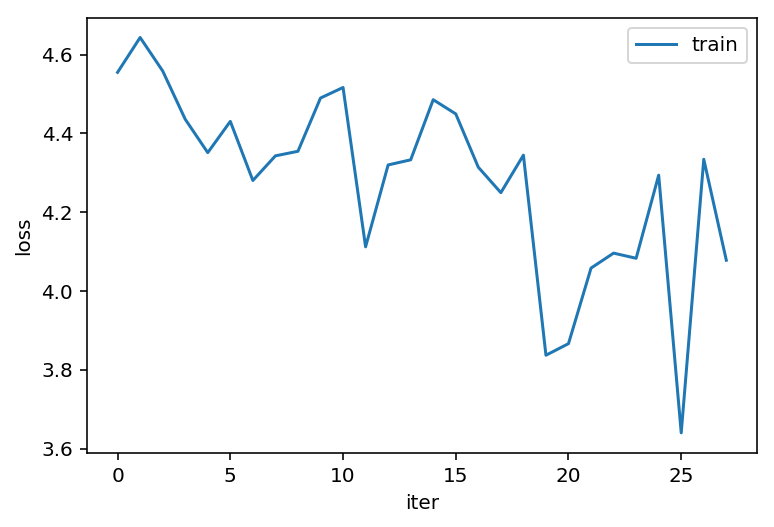

28
Epoch: 28, Iteration: 26500, Loss: 3.6146206855773926
Epoch: 28, Iteration: 26600, Loss: 3.928478240966797
Epoch: 28, Iteration: 26700, Loss: 3.7696309089660645
Epoch: 28, Iteration: 26800, Loss: 4.0060601234436035
Epoch: 28, Iteration: 26900, Loss: 3.9744629859924316
Epoch: 28, Iteration: 27000, Loss: 3.904402256011963
Epoch: 28, Iteration: 27100, Loss: 3.8155710697174072
Epoch: 28, Iteration: 27200, Loss: 4.17879581451416
Epoch: 28, Iteration: 27300, Loss: 3.8741729259490967


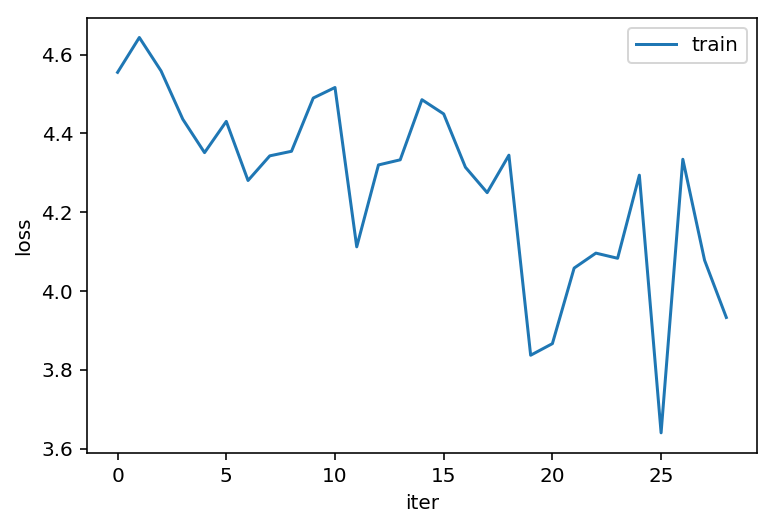

29
Epoch: 29, Iteration: 27400, Loss: 4.0472636222839355
Epoch: 29, Iteration: 27500, Loss: 3.7058258056640625
Epoch: 29, Iteration: 27600, Loss: 3.7800657749176025
Epoch: 29, Iteration: 27700, Loss: 4.373759746551514
Epoch: 29, Iteration: 27800, Loss: 3.7955219745635986
Epoch: 29, Iteration: 27900, Loss: 3.811429500579834
Epoch: 29, Iteration: 28000, Loss: 3.836855888366699
Epoch: 29, Iteration: 28100, Loss: 3.959724187850952
Epoch: 29, Iteration: 28200, Loss: 3.8270206451416016


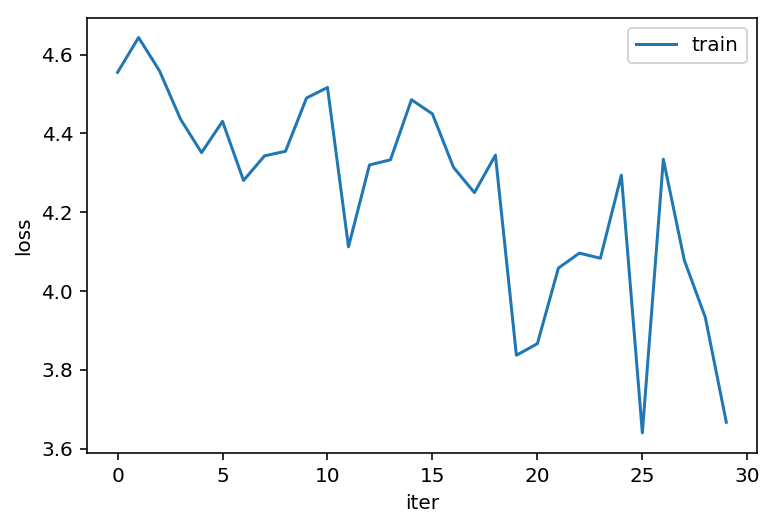

30
Epoch: 30, Iteration: 28300, Loss: 3.847134590148926
Epoch: 30, Iteration: 28400, Loss: 3.854490041732788
Epoch: 30, Iteration: 28500, Loss: 3.6838157176971436
Epoch: 30, Iteration: 28600, Loss: 4.100391387939453
Epoch: 30, Iteration: 28700, Loss: 3.607149362564087
Epoch: 30, Iteration: 28800, Loss: 3.8986332416534424
Epoch: 30, Iteration: 28900, Loss: 3.4710958003997803
Epoch: 30, Iteration: 29000, Loss: 3.8042683601379395
Epoch: 30, Iteration: 29100, Loss: 4.242769241333008
Epoch: 30, Iteration: 29200, Loss: 3.518268346786499


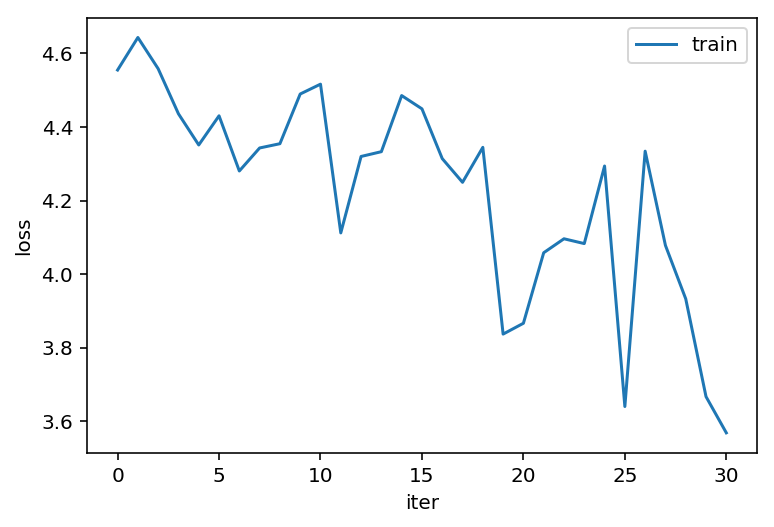

31
Epoch: 31, Iteration: 29300, Loss: 4.125748157501221
Epoch: 31, Iteration: 29400, Loss: 3.9854366779327393
Epoch: 31, Iteration: 29500, Loss: 3.546581506729126
Epoch: 31, Iteration: 29600, Loss: 3.7803213596343994
Epoch: 31, Iteration: 29700, Loss: 3.912503480911255
Epoch: 31, Iteration: 29800, Loss: 3.5305638313293457
Epoch: 31, Iteration: 29900, Loss: 4.157402038574219
Epoch: 31, Iteration: 30000, Loss: 3.5913915634155273
Epoch: 31, Iteration: 30100, Loss: 3.4782001972198486


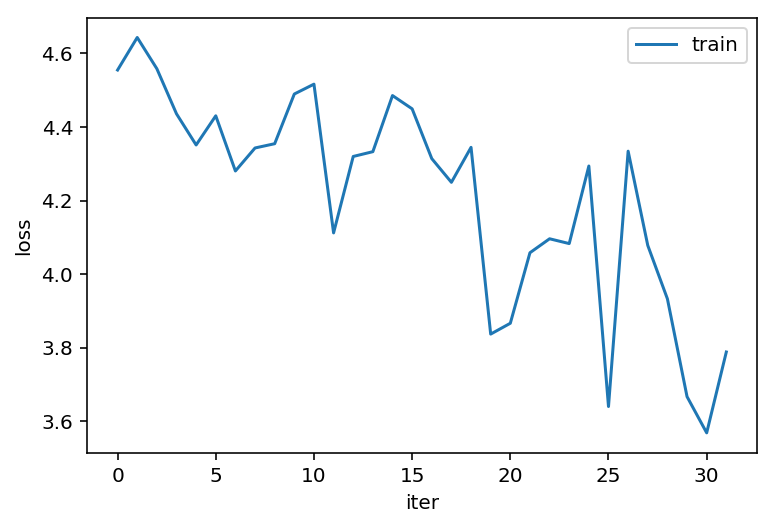

32
Epoch: 32, Iteration: 30200, Loss: 3.8810861110687256
Epoch: 32, Iteration: 30300, Loss: 3.4319725036621094
Epoch: 32, Iteration: 30400, Loss: 3.638425827026367
Epoch: 32, Iteration: 30500, Loss: 3.585205078125
Epoch: 32, Iteration: 30600, Loss: 3.9058632850646973
Epoch: 32, Iteration: 30700, Loss: 3.7069032192230225
Epoch: 32, Iteration: 30800, Loss: 3.7876832485198975
Epoch: 32, Iteration: 30900, Loss: 3.6891825199127197
Epoch: 32, Iteration: 31000, Loss: 3.6732289791107178
Epoch: 32, Iteration: 31100, Loss: 3.885849714279175


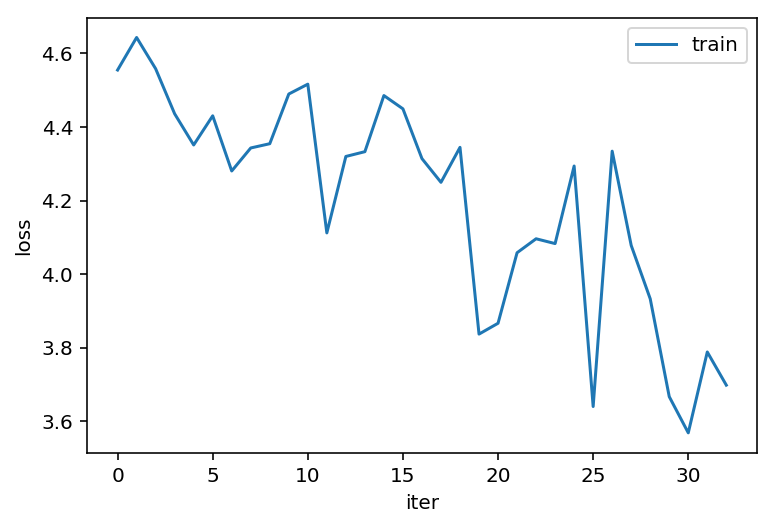

33
Epoch: 33, Iteration: 31200, Loss: 3.6886045932769775
Epoch: 33, Iteration: 31300, Loss: 3.7984907627105713
Epoch: 33, Iteration: 31400, Loss: 3.736891508102417
Epoch: 33, Iteration: 31500, Loss: 3.580430030822754
Epoch: 33, Iteration: 31600, Loss: 3.7393336296081543
Epoch: 33, Iteration: 31700, Loss: 3.854757785797119
Epoch: 33, Iteration: 31800, Loss: 4.128743648529053
Epoch: 33, Iteration: 31900, Loss: 3.776714324951172
Epoch: 33, Iteration: 32000, Loss: 3.6169321537017822


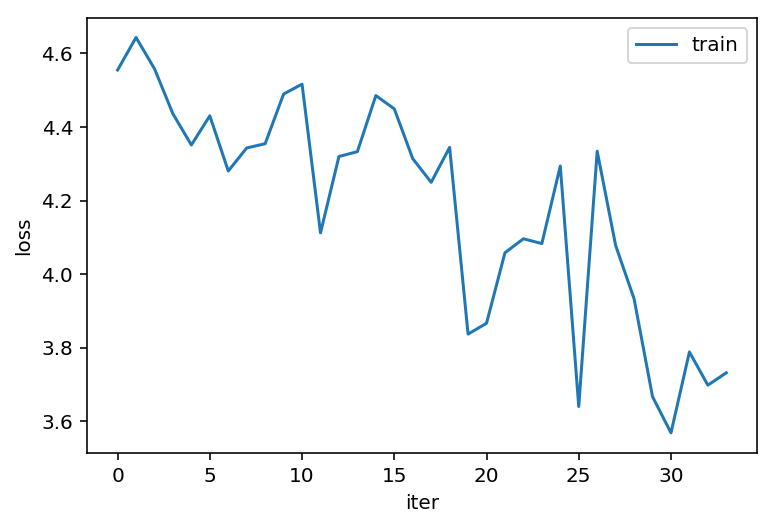

34
Epoch: 34, Iteration: 32100, Loss: 3.646439790725708
Epoch: 34, Iteration: 32200, Loss: 3.6296794414520264
Epoch: 34, Iteration: 32300, Loss: 3.7471940517425537
Epoch: 34, Iteration: 32400, Loss: 3.9379043579101562
Epoch: 34, Iteration: 32500, Loss: 3.4328253269195557
Epoch: 34, Iteration: 32600, Loss: 3.9907877445220947
Epoch: 34, Iteration: 32700, Loss: 3.713239908218384
Epoch: 34, Iteration: 32800, Loss: 3.7208664417266846
Epoch: 34, Iteration: 32900, Loss: 3.857924699783325
Epoch: 34, Iteration: 33000, Loss: 3.836568593978882


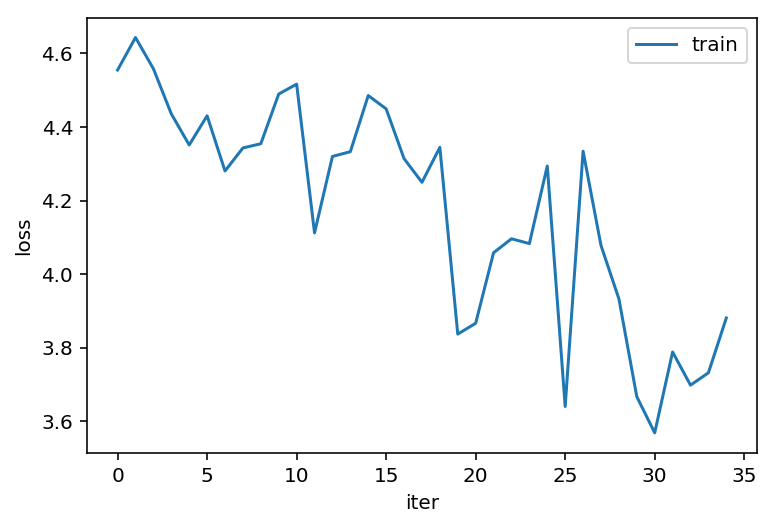

35
Epoch: 35, Iteration: 33100, Loss: 3.6578798294067383
Epoch: 35, Iteration: 33200, Loss: 3.571316957473755
Epoch: 35, Iteration: 33300, Loss: 3.5581300258636475
Epoch: 35, Iteration: 33400, Loss: 3.6271493434906006
Epoch: 35, Iteration: 33500, Loss: 3.4398648738861084
Epoch: 35, Iteration: 33600, Loss: 3.7304606437683105
Epoch: 35, Iteration: 33700, Loss: 3.9396986961364746
Epoch: 35, Iteration: 33800, Loss: 3.516500473022461
Epoch: 35, Iteration: 33900, Loss: 3.9779398441314697


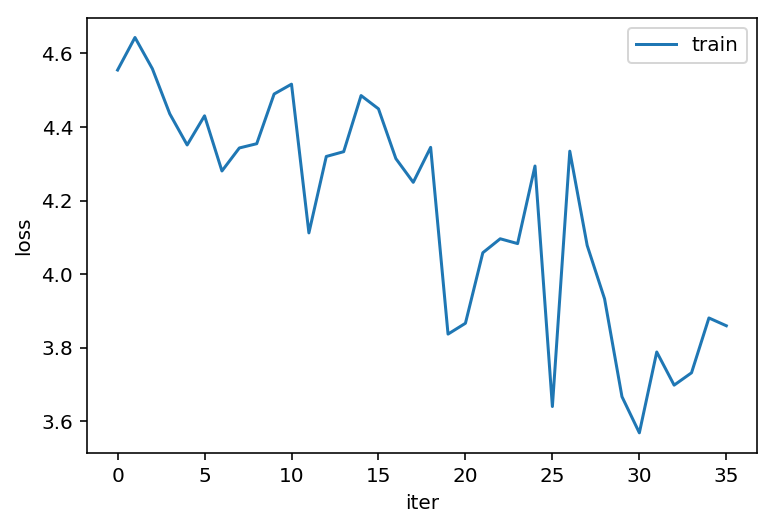

36
Epoch: 36, Iteration: 34000, Loss: 3.737964630126953
Epoch: 36, Iteration: 34100, Loss: 3.707721710205078
Epoch: 36, Iteration: 34200, Loss: 3.6494741439819336
Epoch: 36, Iteration: 34300, Loss: 3.365217924118042
Epoch: 36, Iteration: 34400, Loss: 3.6615474224090576
Epoch: 36, Iteration: 34500, Loss: 3.7425410747528076
Epoch: 36, Iteration: 34600, Loss: 3.5429232120513916
Epoch: 36, Iteration: 34700, Loss: 3.606769561767578
Epoch: 36, Iteration: 34800, Loss: 3.953998565673828


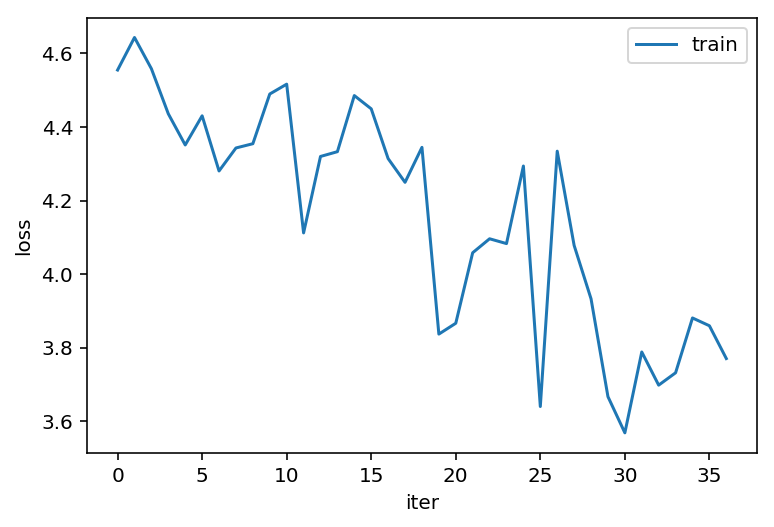

37
Epoch: 37, Iteration: 34900, Loss: 3.630002975463867
Epoch: 37, Iteration: 35000, Loss: 3.630451202392578
Epoch: 37, Iteration: 35100, Loss: 3.412191390991211
Epoch: 37, Iteration: 35200, Loss: 3.9126641750335693
Epoch: 37, Iteration: 35300, Loss: 3.7847890853881836
Epoch: 37, Iteration: 35400, Loss: 3.581371545791626
Epoch: 37, Iteration: 35500, Loss: 3.7971460819244385
Epoch: 37, Iteration: 35600, Loss: 3.395357608795166
Epoch: 37, Iteration: 35700, Loss: 3.9967424869537354
Epoch: 37, Iteration: 35800, Loss: 3.547455310821533


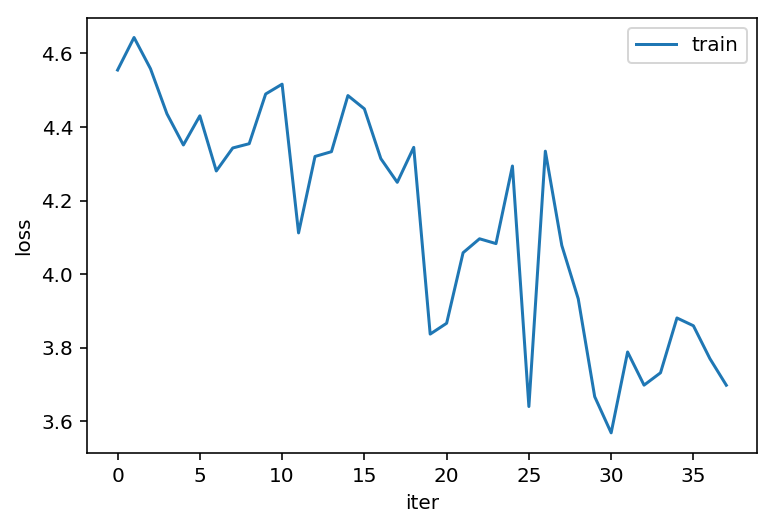

38
Epoch: 38, Iteration: 35900, Loss: 3.3347954750061035
Epoch: 38, Iteration: 36000, Loss: 3.304410696029663
Epoch: 38, Iteration: 36100, Loss: 3.7579150199890137
Epoch: 38, Iteration: 36200, Loss: 3.412374496459961
Epoch: 38, Iteration: 36300, Loss: 3.5665431022644043
Epoch: 38, Iteration: 36400, Loss: 3.9587414264678955
Epoch: 38, Iteration: 36500, Loss: 3.8407394886016846
Epoch: 38, Iteration: 36600, Loss: 3.7120888233184814
Epoch: 38, Iteration: 36700, Loss: 3.7395176887512207


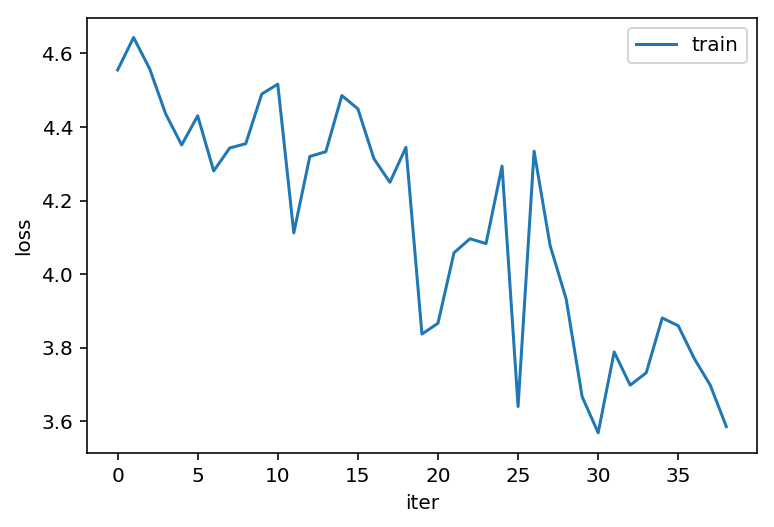

39
Epoch: 39, Iteration: 36800, Loss: 3.6353554725646973
Epoch: 39, Iteration: 36900, Loss: 3.7210114002227783
Epoch: 39, Iteration: 37000, Loss: 3.3896491527557373
Epoch: 39, Iteration: 37100, Loss: 3.4961652755737305
Epoch: 39, Iteration: 37200, Loss: 3.3669064044952393
Epoch: 39, Iteration: 37300, Loss: 3.8140058517456055
Epoch: 39, Iteration: 37400, Loss: 3.329831123352051
Epoch: 39, Iteration: 37500, Loss: 3.6622345447540283
Epoch: 39, Iteration: 37600, Loss: 3.3641135692596436
Epoch: 39, Iteration: 37700, Loss: 3.7413387298583984


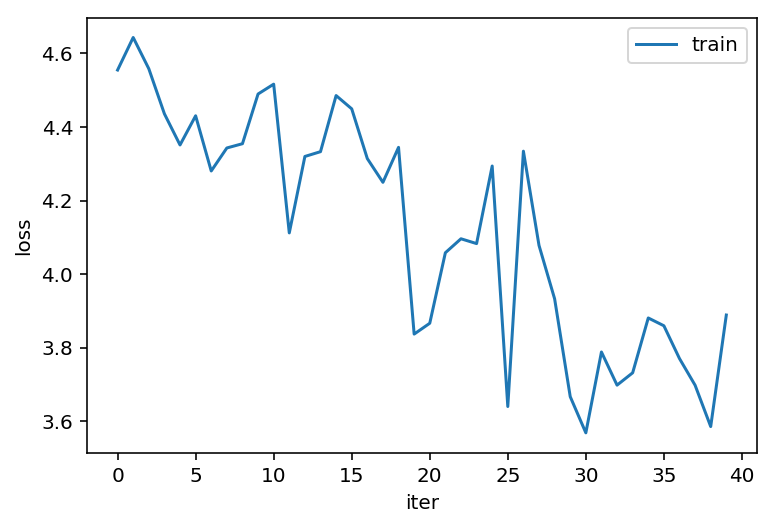

40
Epoch: 40, Iteration: 37800, Loss: 3.6656973361968994
Epoch: 40, Iteration: 37900, Loss: 3.5998013019561768
Epoch: 40, Iteration: 38000, Loss: 3.728776216506958
Epoch: 40, Iteration: 38100, Loss: 3.6669883728027344
Epoch: 40, Iteration: 38200, Loss: 3.3336257934570312
Epoch: 40, Iteration: 38300, Loss: 3.543376922607422
Epoch: 40, Iteration: 38400, Loss: 3.8268983364105225
Epoch: 40, Iteration: 38500, Loss: 3.2212376594543457
Epoch: 40, Iteration: 38600, Loss: 3.576939821243286


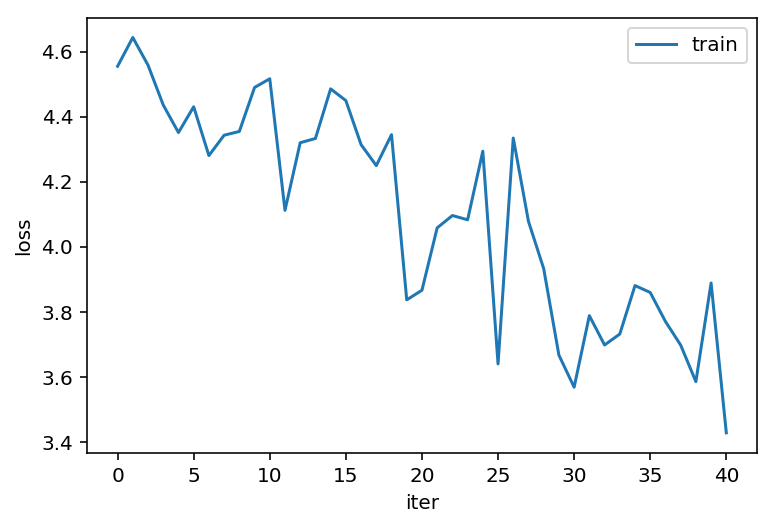

41
Epoch: 41, Iteration: 38700, Loss: 3.2819626331329346
Epoch: 41, Iteration: 38800, Loss: 2.8781087398529053
Epoch: 41, Iteration: 38900, Loss: 3.3737027645111084
Epoch: 41, Iteration: 39000, Loss: 3.6435935497283936
Epoch: 41, Iteration: 39100, Loss: 3.8586580753326416
Epoch: 41, Iteration: 39200, Loss: 3.6112427711486816
Epoch: 41, Iteration: 39300, Loss: 3.88997483253479
Epoch: 41, Iteration: 39400, Loss: 3.987732172012329
Epoch: 41, Iteration: 39500, Loss: 3.6182069778442383
Epoch: 41, Iteration: 39600, Loss: 3.952754259109497


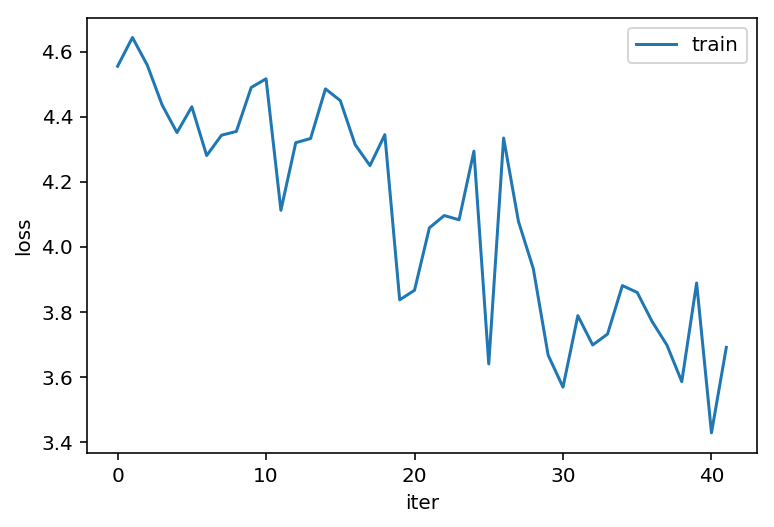

42
Epoch: 42, Iteration: 39700, Loss: 3.3277671337127686
Epoch: 42, Iteration: 39800, Loss: 3.4549520015716553
Epoch: 42, Iteration: 39900, Loss: 3.440744161605835
Epoch: 42, Iteration: 40000, Loss: 3.362307548522949
Epoch: 42, Iteration: 40100, Loss: 3.397453784942627
Epoch: 42, Iteration: 40200, Loss: 3.525705337524414
Epoch: 42, Iteration: 40300, Loss: 3.681790590286255
Epoch: 42, Iteration: 40400, Loss: 3.264080286026001
Epoch: 42, Iteration: 40500, Loss: 3.4025063514709473


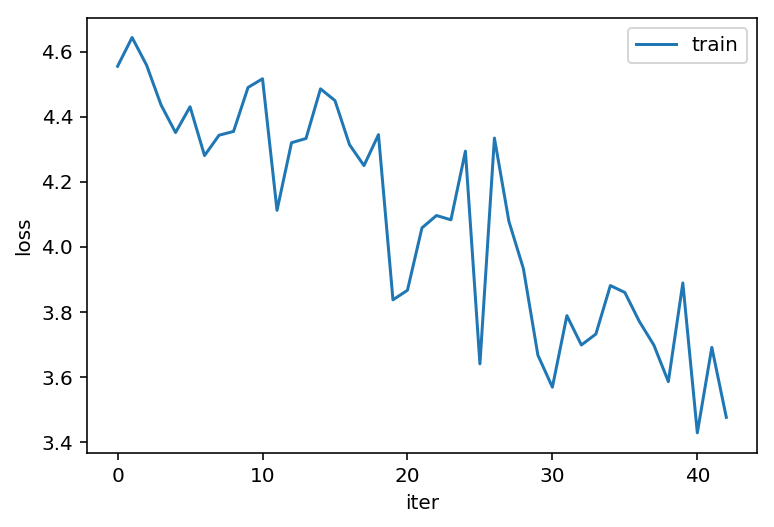

43
Epoch: 43, Iteration: 40600, Loss: 3.3621468544006348
Epoch: 43, Iteration: 40700, Loss: 3.226586103439331
Epoch: 43, Iteration: 40800, Loss: 3.4597411155700684
Epoch: 43, Iteration: 40900, Loss: 3.597806453704834
Epoch: 43, Iteration: 41000, Loss: 3.145618200302124
Epoch: 43, Iteration: 41100, Loss: 3.588306427001953
Epoch: 43, Iteration: 41200, Loss: 3.3983466625213623
Epoch: 43, Iteration: 41300, Loss: 3.6873233318328857
Epoch: 43, Iteration: 41400, Loss: 3.8470444679260254


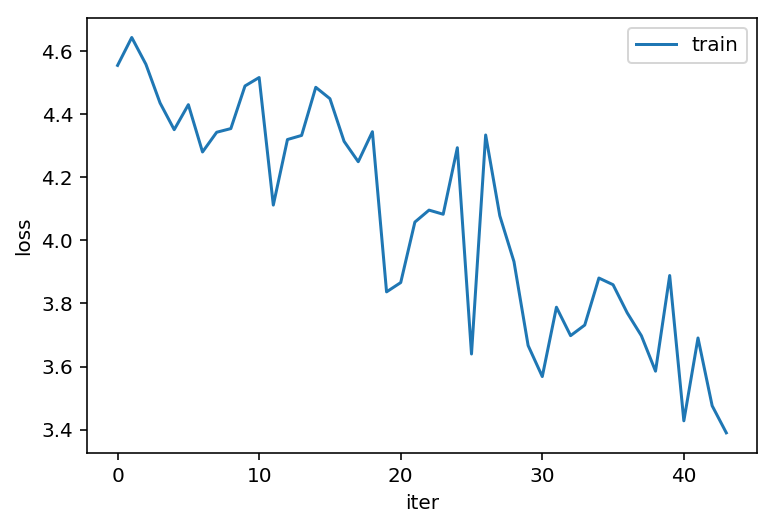

44
Epoch: 44, Iteration: 41500, Loss: 3.5983715057373047
Epoch: 44, Iteration: 41600, Loss: 3.352111577987671
Epoch: 44, Iteration: 41700, Loss: 3.19728422164917
Epoch: 44, Iteration: 41800, Loss: 3.564560890197754
Epoch: 44, Iteration: 41900, Loss: 3.2076077461242676
Epoch: 44, Iteration: 42000, Loss: 3.4834775924682617
Epoch: 44, Iteration: 42100, Loss: 3.1028223037719727
Epoch: 44, Iteration: 42200, Loss: 3.3781986236572266
Epoch: 44, Iteration: 42300, Loss: 3.3906314373016357
Epoch: 44, Iteration: 42400, Loss: 3.4928805828094482


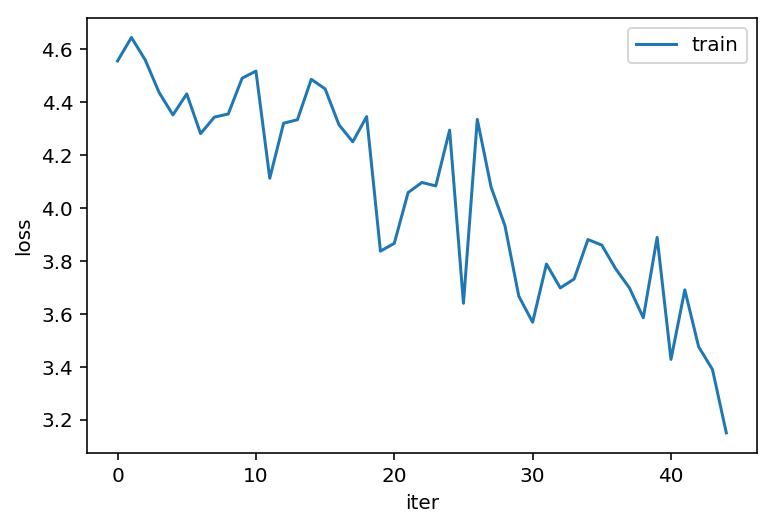

45
Epoch: 45, Iteration: 42500, Loss: 3.3277103900909424
Epoch: 45, Iteration: 42600, Loss: 3.3371362686157227
Epoch: 45, Iteration: 42700, Loss: 3.4327545166015625
Epoch: 45, Iteration: 42800, Loss: 3.2117884159088135
Epoch: 45, Iteration: 42900, Loss: 3.422994375228882
Epoch: 45, Iteration: 43000, Loss: 3.690927505493164
Epoch: 45, Iteration: 43100, Loss: 3.207596778869629
Epoch: 45, Iteration: 43200, Loss: 3.516754388809204
Epoch: 45, Iteration: 43300, Loss: 3.262216091156006


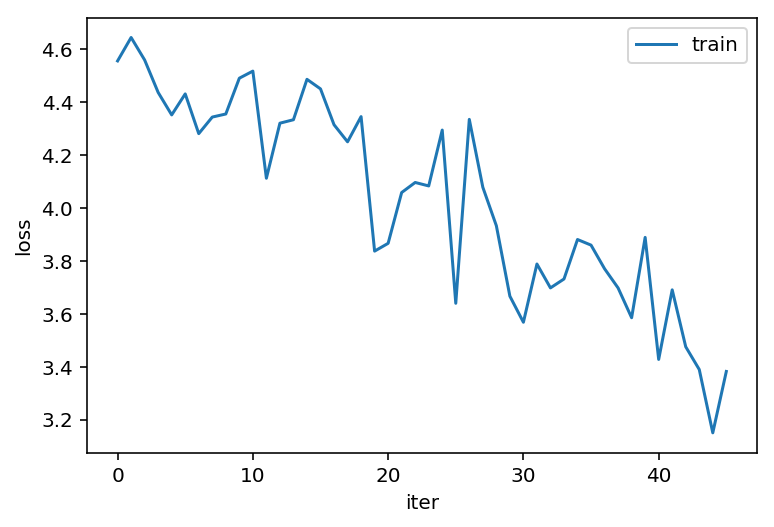

46
Epoch: 46, Iteration: 43400, Loss: 3.310476779937744
Epoch: 46, Iteration: 43500, Loss: 3.4753050804138184
Epoch: 46, Iteration: 43600, Loss: 3.3999974727630615
Epoch: 46, Iteration: 43700, Loss: 3.4277234077453613
Epoch: 46, Iteration: 43800, Loss: 3.1927309036254883
Epoch: 46, Iteration: 43900, Loss: 3.195185661315918
Epoch: 46, Iteration: 44000, Loss: 3.391899585723877
Epoch: 46, Iteration: 44100, Loss: 3.9273548126220703
Epoch: 46, Iteration: 44200, Loss: 3.001889228820801
Epoch: 46, Iteration: 44300, Loss: 3.4379079341888428


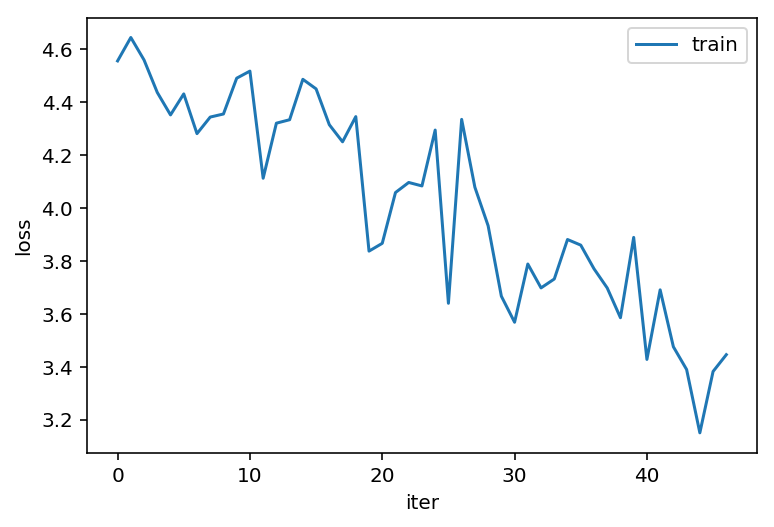

47
Epoch: 47, Iteration: 44400, Loss: 3.436828136444092
Epoch: 47, Iteration: 44500, Loss: 3.445847749710083
Epoch: 47, Iteration: 44600, Loss: 3.226705312728882
Epoch: 47, Iteration: 44700, Loss: 3.2207887172698975
Epoch: 47, Iteration: 44800, Loss: 3.0709781646728516
Epoch: 47, Iteration: 44900, Loss: 2.773332357406616
Epoch: 47, Iteration: 45000, Loss: 3.3329999446868896
Epoch: 47, Iteration: 45100, Loss: 3.2227556705474854
Epoch: 47, Iteration: 45200, Loss: 3.4459221363067627


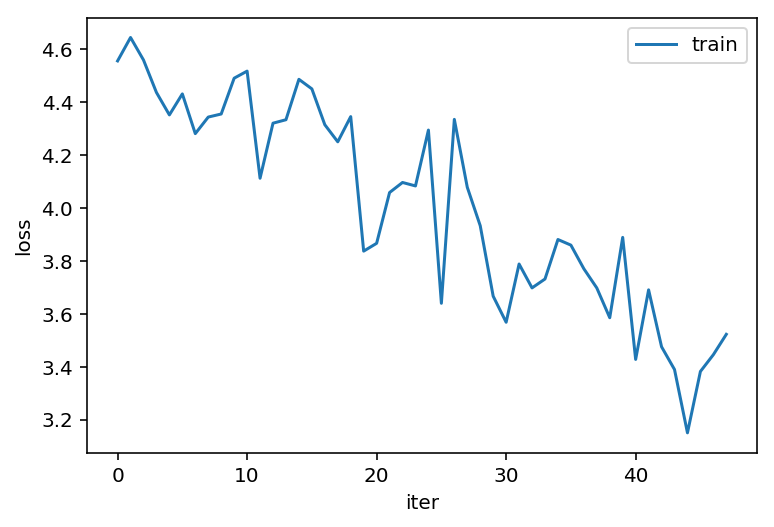

48
Epoch: 48, Iteration: 45300, Loss: 3.0377016067504883
Epoch: 48, Iteration: 45400, Loss: 3.1306591033935547
Epoch: 48, Iteration: 45500, Loss: 3.4383392333984375
Epoch: 48, Iteration: 45600, Loss: 3.101083755493164
Epoch: 48, Iteration: 45700, Loss: 3.382286548614502
Epoch: 48, Iteration: 45800, Loss: 3.300342321395874
Epoch: 48, Iteration: 45900, Loss: 3.2733652591705322
Epoch: 48, Iteration: 46000, Loss: 3.365800142288208
Epoch: 48, Iteration: 46100, Loss: 2.8591175079345703
Epoch: 48, Iteration: 46200, Loss: 3.6636128425598145


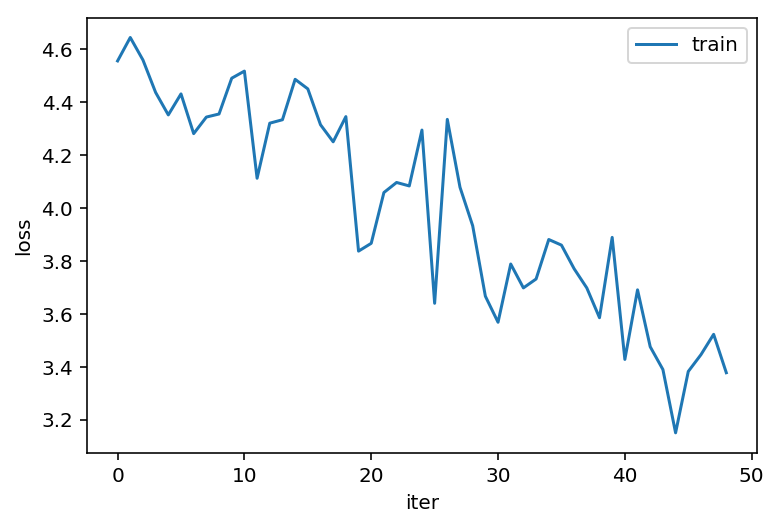

49
Epoch: 49, Iteration: 46300, Loss: 3.1615231037139893
Epoch: 49, Iteration: 46400, Loss: 3.7904012203216553
Epoch: 49, Iteration: 46500, Loss: 3.379556894302368
Epoch: 49, Iteration: 46600, Loss: 3.256493330001831
Epoch: 49, Iteration: 46700, Loss: 3.4086952209472656
Epoch: 49, Iteration: 46800, Loss: 3.452263832092285
Epoch: 49, Iteration: 46900, Loss: 3.2959725856781006
Epoch: 49, Iteration: 47000, Loss: 3.3010640144348145
Epoch: 49, Iteration: 47100, Loss: 3.1827335357666016


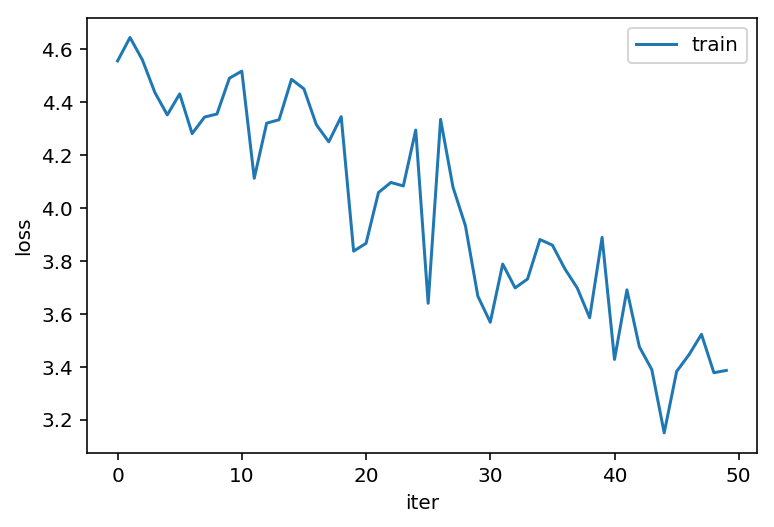

50
Epoch: 50, Iteration: 47200, Loss: 2.9789304733276367
Epoch: 50, Iteration: 47300, Loss: 3.045116424560547
Epoch: 50, Iteration: 47400, Loss: 3.2926623821258545
Epoch: 50, Iteration: 47500, Loss: 3.0729572772979736
Epoch: 50, Iteration: 47600, Loss: 3.3946197032928467
Epoch: 50, Iteration: 47700, Loss: 3.081430435180664
Epoch: 50, Iteration: 47800, Loss: 3.160247564315796
Epoch: 50, Iteration: 47900, Loss: 3.4488792419433594
Epoch: 50, Iteration: 48000, Loss: 2.9205429553985596


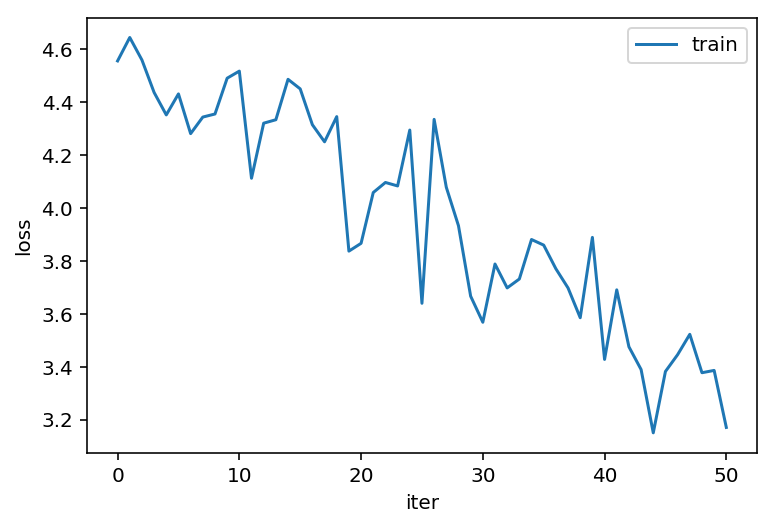

51
Epoch: 51, Iteration: 48100, Loss: 2.9602813720703125
Epoch: 51, Iteration: 48200, Loss: 3.2237181663513184
Epoch: 51, Iteration: 48300, Loss: 2.941232204437256
Epoch: 51, Iteration: 48400, Loss: 2.9632785320281982
Epoch: 51, Iteration: 48500, Loss: 3.6782779693603516
Epoch: 51, Iteration: 48600, Loss: 3.3774354457855225
Epoch: 51, Iteration: 48700, Loss: 2.9708919525146484
Epoch: 51, Iteration: 48800, Loss: 3.1703271865844727
Epoch: 51, Iteration: 48900, Loss: 3.2580502033233643
Epoch: 51, Iteration: 49000, Loss: 2.6981964111328125


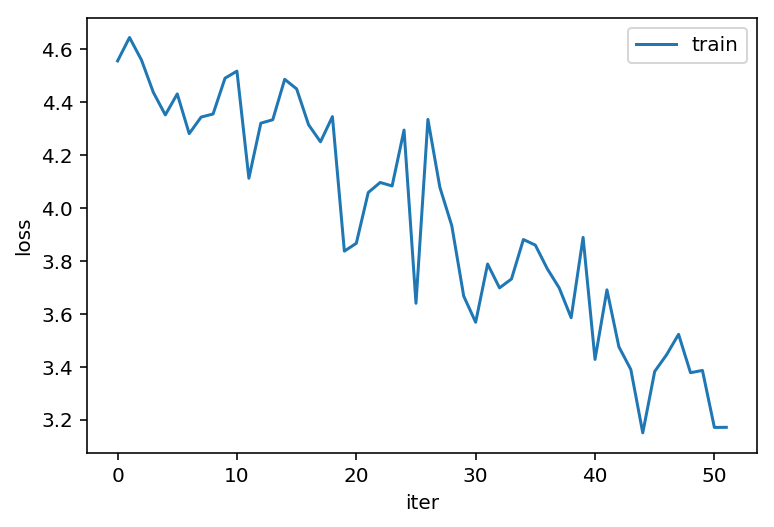

52
Epoch: 52, Iteration: 49100, Loss: 3.1267621517181396
Epoch: 52, Iteration: 49200, Loss: 3.5199904441833496
Epoch: 52, Iteration: 49300, Loss: 3.2896738052368164
Epoch: 52, Iteration: 49400, Loss: 3.474026679992676
Epoch: 52, Iteration: 49500, Loss: 3.213059425354004
Epoch: 52, Iteration: 49600, Loss: 3.174428701400757
Epoch: 52, Iteration: 49700, Loss: 3.421613931655884
Epoch: 52, Iteration: 49800, Loss: 3.4712018966674805
Epoch: 52, Iteration: 49900, Loss: 3.2587735652923584


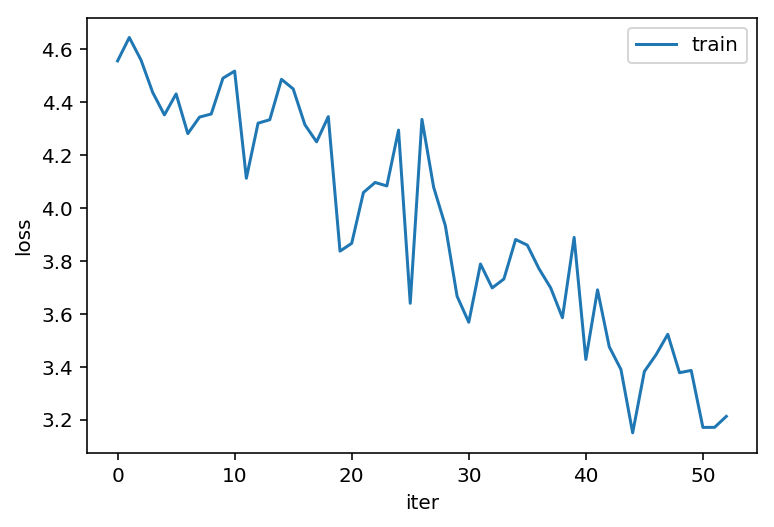

53
Epoch: 53, Iteration: 50000, Loss: 3.0259485244750977
Epoch: 53, Iteration: 50100, Loss: 3.0122294425964355
Epoch: 53, Iteration: 50200, Loss: 3.1695175170898438
Epoch: 53, Iteration: 50300, Loss: 3.5974180698394775
Epoch: 53, Iteration: 50400, Loss: 3.2827048301696777
Epoch: 53, Iteration: 50500, Loss: 3.076145648956299
Epoch: 53, Iteration: 50600, Loss: 3.3704209327697754
Epoch: 53, Iteration: 50700, Loss: 3.1795012950897217
Epoch: 53, Iteration: 50800, Loss: 3.071086883544922
Epoch: 53, Iteration: 50900, Loss: 3.040849208831787


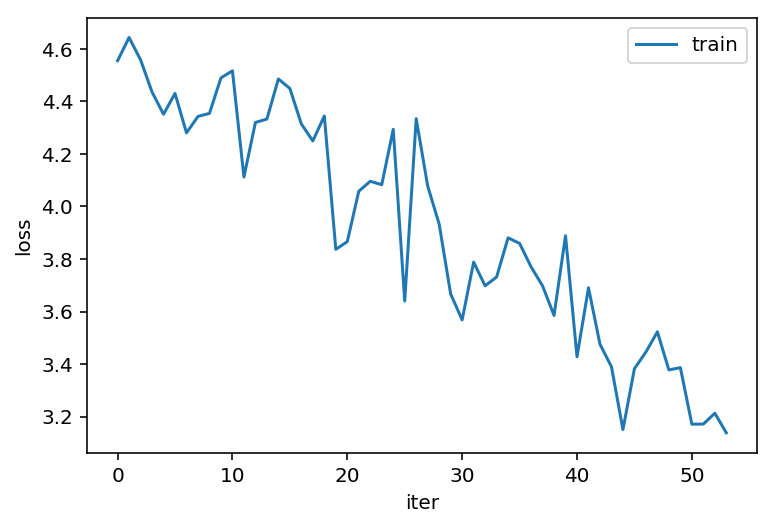

54
Epoch: 54, Iteration: 51000, Loss: 3.4949545860290527
Epoch: 54, Iteration: 51100, Loss: 3.0403754711151123
Epoch: 54, Iteration: 51200, Loss: 3.39573335647583
Epoch: 54, Iteration: 51300, Loss: 3.2611701488494873
Epoch: 54, Iteration: 51400, Loss: 3.4866456985473633
Epoch: 54, Iteration: 51500, Loss: 3.128288745880127
Epoch: 54, Iteration: 51600, Loss: 3.1121912002563477
Epoch: 54, Iteration: 51700, Loss: 2.6265370845794678
Epoch: 54, Iteration: 51800, Loss: 2.9249229431152344


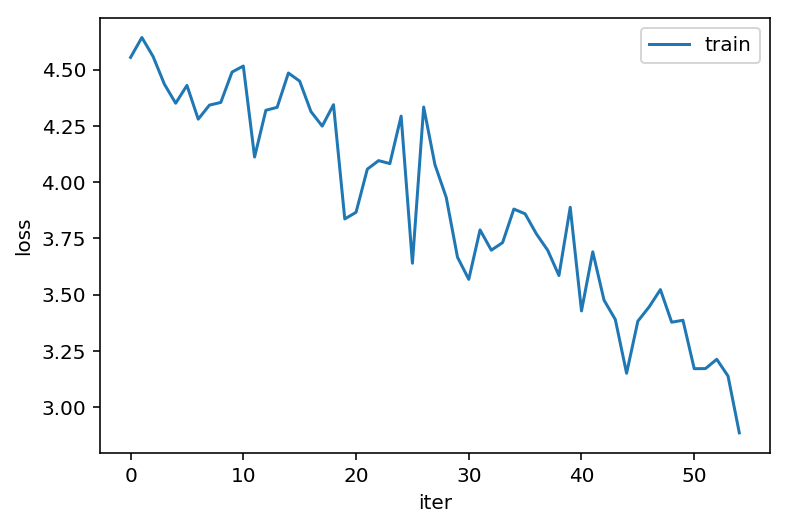

55
Epoch: 55, Iteration: 51900, Loss: 2.7056469917297363
Epoch: 55, Iteration: 52000, Loss: 2.855340003967285
Epoch: 55, Iteration: 52100, Loss: 3.0808773040771484
Epoch: 55, Iteration: 52200, Loss: 2.9180569648742676
Epoch: 55, Iteration: 52300, Loss: 3.1876440048217773
Epoch: 55, Iteration: 52400, Loss: 2.949474573135376
Epoch: 55, Iteration: 52500, Loss: 3.2112724781036377
Epoch: 55, Iteration: 52600, Loss: 3.2402663230895996
Epoch: 55, Iteration: 52700, Loss: 3.0466389656066895
Epoch: 55, Iteration: 52800, Loss: 3.2355597019195557


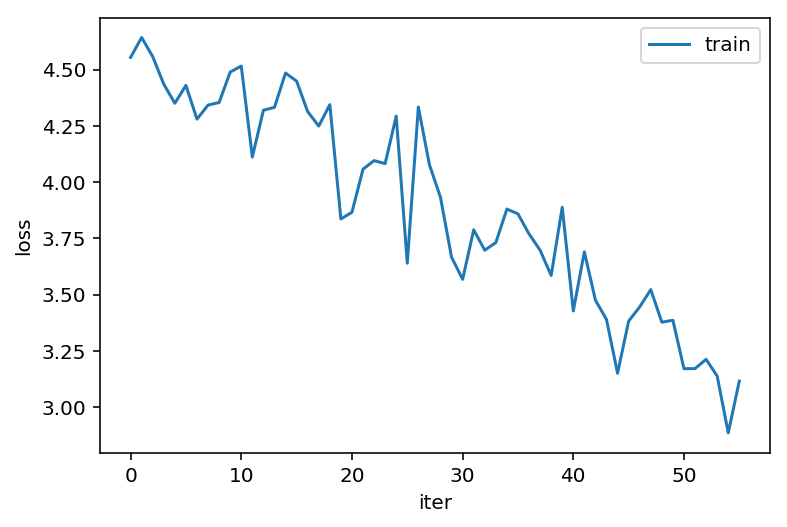

56
Epoch: 56, Iteration: 52900, Loss: 2.938162088394165
Epoch: 56, Iteration: 53000, Loss: 2.74080491065979
Epoch: 56, Iteration: 53100, Loss: 2.9482390880584717
Epoch: 56, Iteration: 53200, Loss: 3.0969955921173096
Epoch: 56, Iteration: 53300, Loss: 3.2985832691192627
Epoch: 56, Iteration: 53400, Loss: 3.0639853477478027
Epoch: 56, Iteration: 53500, Loss: 2.826531171798706
Epoch: 56, Iteration: 53600, Loss: 3.6122233867645264
Epoch: 56, Iteration: 53700, Loss: 3.3839519023895264


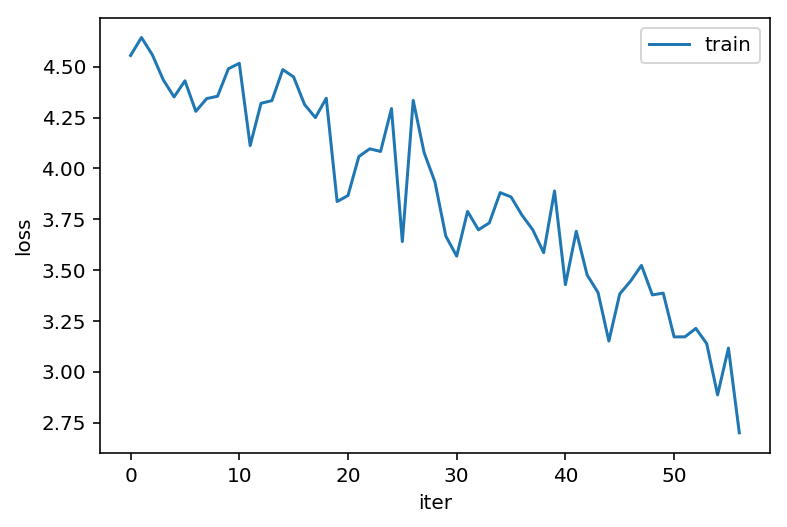

57
Epoch: 57, Iteration: 53800, Loss: 2.9982781410217285
Epoch: 57, Iteration: 53900, Loss: 3.2716033458709717
Epoch: 57, Iteration: 54000, Loss: 3.147921562194824
Epoch: 57, Iteration: 54100, Loss: 3.4025416374206543
Epoch: 57, Iteration: 54200, Loss: 3.148861885070801
Epoch: 57, Iteration: 54300, Loss: 2.958510160446167
Epoch: 57, Iteration: 54400, Loss: 3.0146865844726562
Epoch: 57, Iteration: 54500, Loss: 3.1370162963867188
Epoch: 57, Iteration: 54600, Loss: 3.4307050704956055


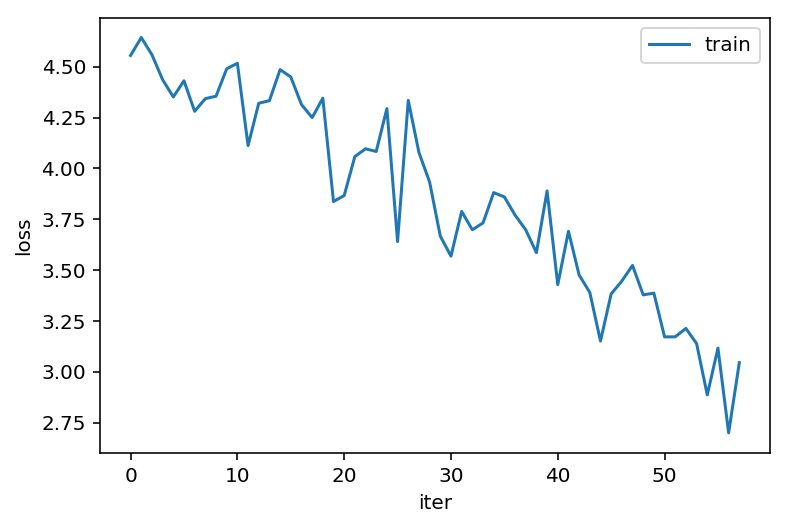

58
Epoch: 58, Iteration: 54700, Loss: 3.220672130584717
Epoch: 58, Iteration: 54800, Loss: 2.8155152797698975
Epoch: 58, Iteration: 54900, Loss: 3.113502025604248
Epoch: 58, Iteration: 55000, Loss: 3.1558027267456055
Epoch: 58, Iteration: 55100, Loss: 2.5822508335113525
Epoch: 58, Iteration: 55200, Loss: 2.871248722076416
Epoch: 58, Iteration: 55300, Loss: 2.779431104660034
Epoch: 58, Iteration: 55400, Loss: 3.2307167053222656
Epoch: 58, Iteration: 55500, Loss: 3.1477551460266113
Epoch: 58, Iteration: 55600, Loss: 2.861696481704712


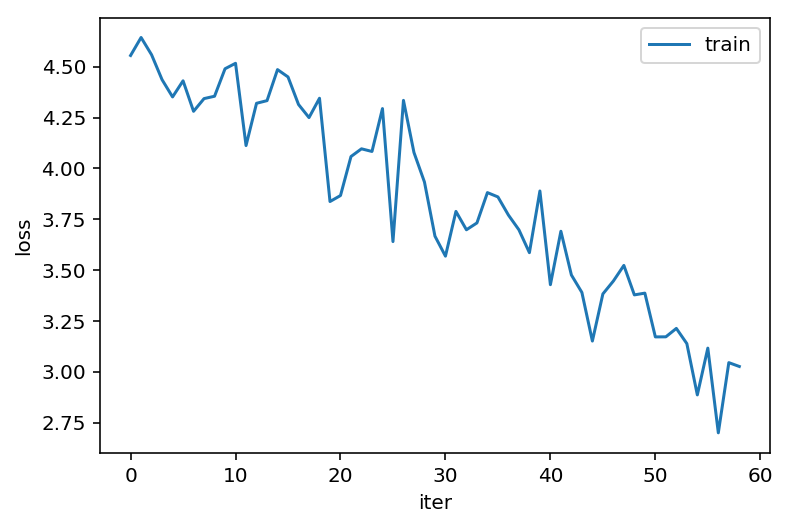

59
Epoch: 59, Iteration: 55700, Loss: 3.5017495155334473
Epoch: 59, Iteration: 55800, Loss: 3.038287401199341
Epoch: 59, Iteration: 55900, Loss: 3.2876393795013428
Epoch: 59, Iteration: 56000, Loss: 3.4249541759490967
Epoch: 59, Iteration: 56100, Loss: 3.141179084777832
Epoch: 59, Iteration: 56200, Loss: 2.7740256786346436
Epoch: 59, Iteration: 56300, Loss: 2.817857503890991
Epoch: 59, Iteration: 56400, Loss: 2.9296867847442627
Epoch: 59, Iteration: 56500, Loss: 2.981163263320923


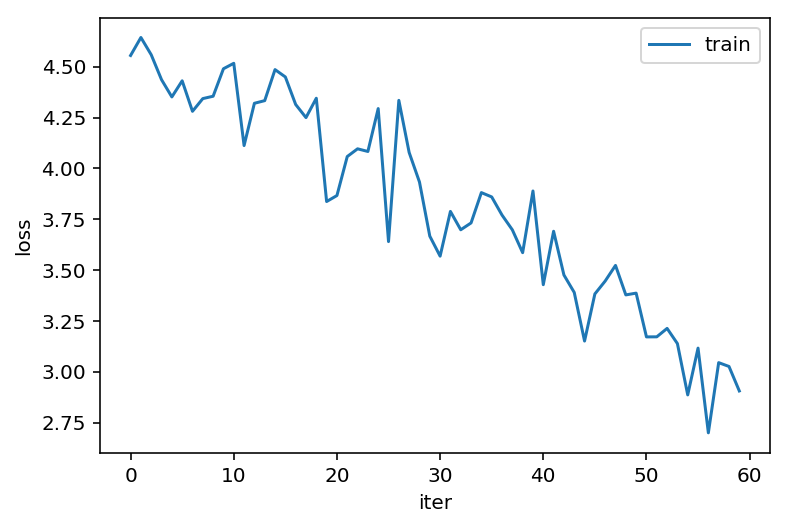

60
Epoch: 60, Iteration: 56600, Loss: 3.151095390319824
Epoch: 60, Iteration: 56700, Loss: 3.160571813583374
Epoch: 60, Iteration: 56800, Loss: 2.688162088394165
Epoch: 60, Iteration: 56900, Loss: 3.2804558277130127
Epoch: 60, Iteration: 57000, Loss: 2.7274293899536133
Epoch: 60, Iteration: 57100, Loss: 3.0737643241882324
Epoch: 60, Iteration: 57200, Loss: 3.0880730152130127
Epoch: 60, Iteration: 57300, Loss: 2.562131643295288
Epoch: 60, Iteration: 57400, Loss: 2.95672607421875
Epoch: 60, Iteration: 57500, Loss: 3.1117875576019287


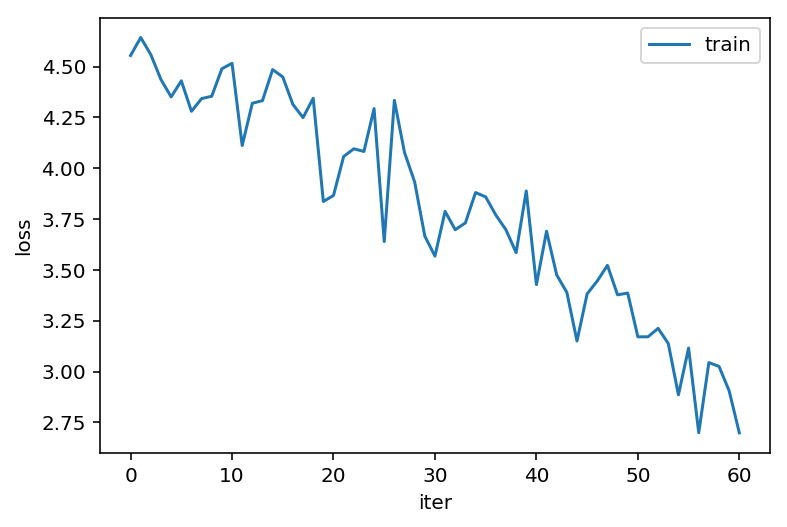

61
Epoch: 61, Iteration: 57600, Loss: 2.9736218452453613
Epoch: 61, Iteration: 57700, Loss: 2.6802542209625244
Epoch: 61, Iteration: 57800, Loss: 2.84401535987854
Epoch: 61, Iteration: 57900, Loss: 2.8875060081481934
Epoch: 61, Iteration: 58000, Loss: 3.1856818199157715
Epoch: 61, Iteration: 58100, Loss: 3.051248788833618
Epoch: 61, Iteration: 58200, Loss: 2.746990442276001
Epoch: 61, Iteration: 58300, Loss: 3.416559934616089
Epoch: 61, Iteration: 58400, Loss: 2.5767645835876465


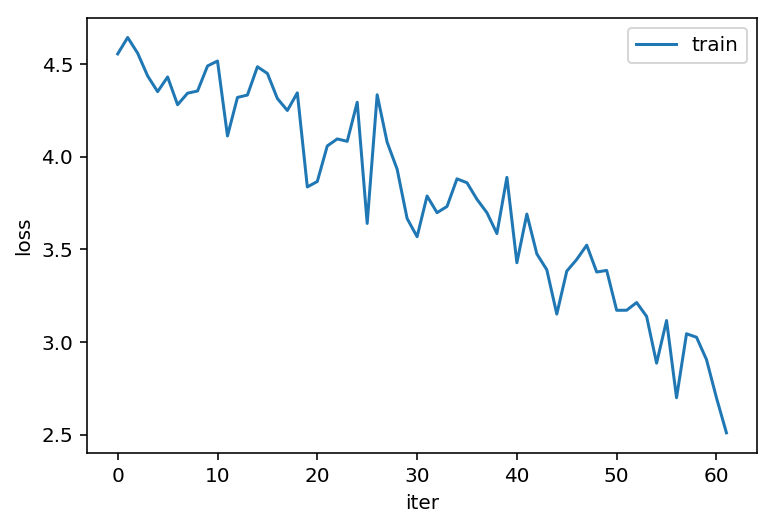

62
Epoch: 62, Iteration: 58500, Loss: 3.0986130237579346
Epoch: 62, Iteration: 58600, Loss: 2.638868570327759
Epoch: 62, Iteration: 58700, Loss: 3.1002843379974365
Epoch: 62, Iteration: 58800, Loss: 2.833678960800171
Epoch: 62, Iteration: 58900, Loss: 2.730685234069824
Epoch: 62, Iteration: 59000, Loss: 2.7513129711151123
Epoch: 62, Iteration: 59100, Loss: 2.9221949577331543
Epoch: 62, Iteration: 59200, Loss: 2.8396708965301514
Epoch: 62, Iteration: 59300, Loss: 3.0951409339904785
Epoch: 62, Iteration: 59400, Loss: 3.2477710247039795


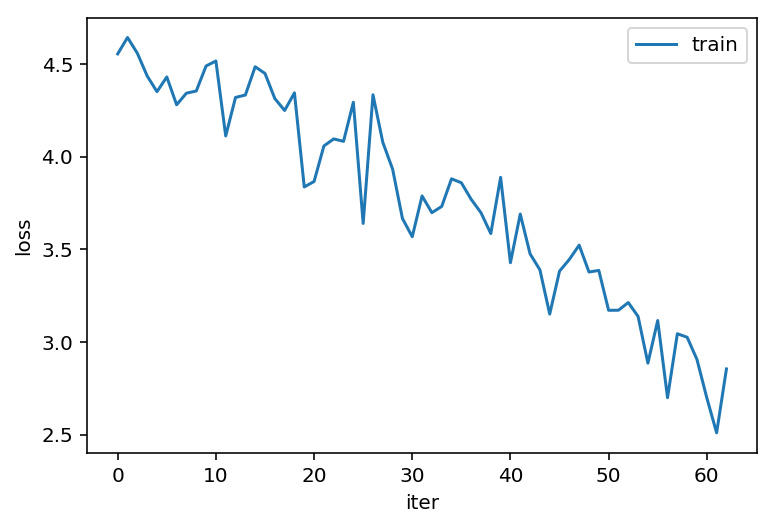

63
Epoch: 63, Iteration: 59500, Loss: 2.5699825286865234
Epoch: 63, Iteration: 59600, Loss: 2.87166690826416
Epoch: 63, Iteration: 59700, Loss: 2.9209158420562744
Epoch: 63, Iteration: 59800, Loss: 2.96728253364563
Epoch: 63, Iteration: 59900, Loss: 3.1273605823516846
Epoch: 63, Iteration: 60000, Loss: 2.836433172225952
Epoch: 63, Iteration: 60100, Loss: 3.296259880065918
Epoch: 63, Iteration: 60200, Loss: 3.001065731048584
Epoch: 63, Iteration: 60300, Loss: 2.893728256225586


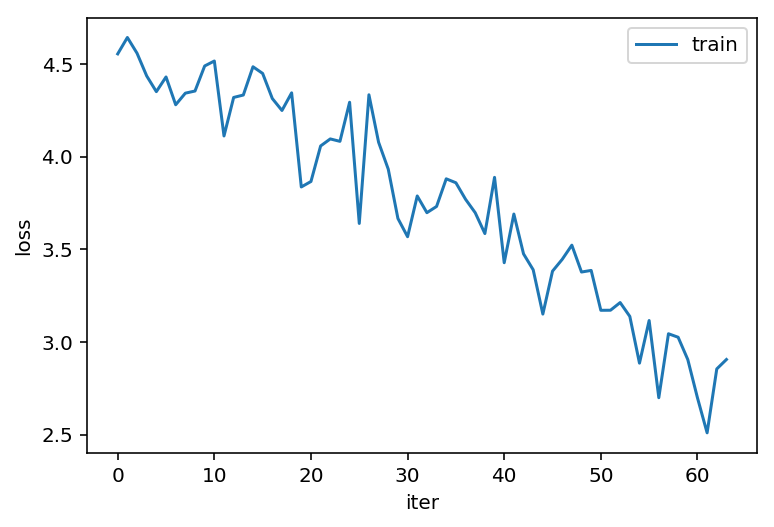

64
Epoch: 64, Iteration: 60400, Loss: 2.598888635635376
Epoch: 64, Iteration: 60500, Loss: 2.632084369659424
Epoch: 64, Iteration: 60600, Loss: 2.8040764331817627
Epoch: 64, Iteration: 60700, Loss: 3.090501308441162
Epoch: 64, Iteration: 60800, Loss: 2.815558910369873
Epoch: 64, Iteration: 60900, Loss: 3.0339581966400146
Epoch: 64, Iteration: 61000, Loss: 2.6160061359405518
Epoch: 64, Iteration: 61100, Loss: 2.9154882431030273
Epoch: 64, Iteration: 61200, Loss: 2.6996169090270996


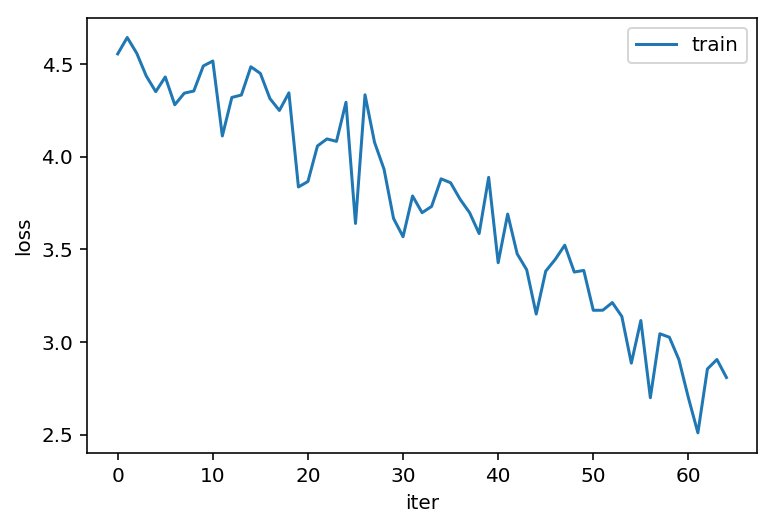

65
Epoch: 65, Iteration: 61300, Loss: 3.026874303817749
Epoch: 65, Iteration: 61400, Loss: 2.900266408920288
Epoch: 65, Iteration: 61500, Loss: 2.761277675628662
Epoch: 65, Iteration: 61600, Loss: 2.8836522102355957
Epoch: 65, Iteration: 61700, Loss: 2.871845245361328
Epoch: 65, Iteration: 61800, Loss: 2.7916715145111084
Epoch: 65, Iteration: 61900, Loss: 3.1534948348999023
Epoch: 65, Iteration: 62000, Loss: 2.95249342918396
Epoch: 65, Iteration: 62100, Loss: 3.365657091140747
Epoch: 65, Iteration: 62200, Loss: 2.7625248432159424


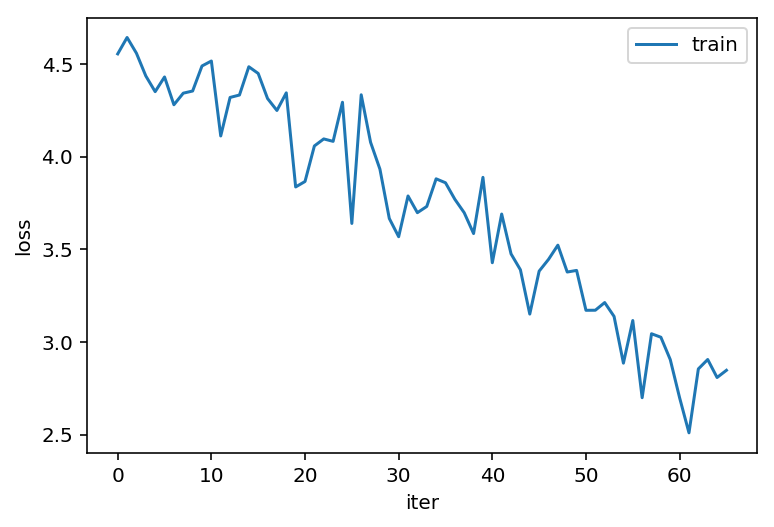

66
Epoch: 66, Iteration: 62300, Loss: 2.5210154056549072
Epoch: 66, Iteration: 62400, Loss: 2.4423696994781494
Epoch: 66, Iteration: 62500, Loss: 2.329562187194824
Epoch: 66, Iteration: 62600, Loss: 3.1591453552246094
Epoch: 66, Iteration: 62700, Loss: 2.901832342147827
Epoch: 66, Iteration: 62800, Loss: 3.0760769844055176
Epoch: 66, Iteration: 62900, Loss: 2.9360251426696777
Epoch: 66, Iteration: 63000, Loss: 2.9313316345214844
Epoch: 66, Iteration: 63100, Loss: 2.945009708404541


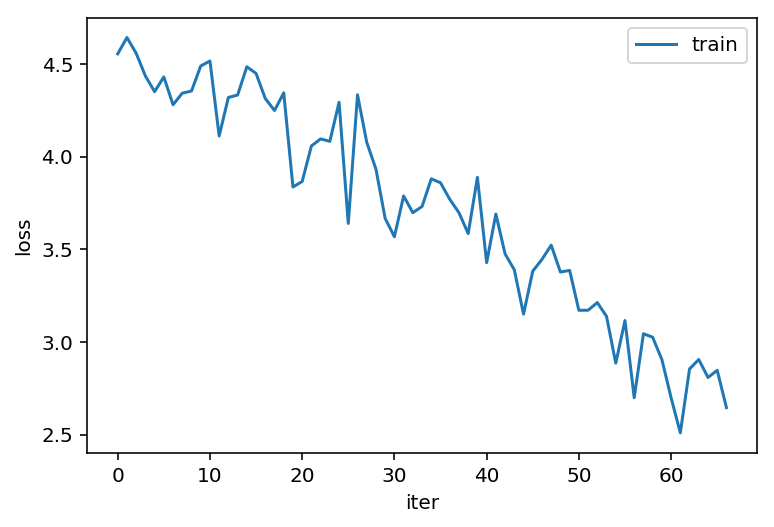

67
Epoch: 67, Iteration: 63200, Loss: 3.059518575668335
Epoch: 67, Iteration: 63300, Loss: 3.0589752197265625
Epoch: 67, Iteration: 63400, Loss: 2.8419296741485596
Epoch: 67, Iteration: 63500, Loss: 2.430919885635376
Epoch: 67, Iteration: 63600, Loss: 2.73897123336792
Epoch: 67, Iteration: 63700, Loss: 2.6937155723571777
Epoch: 67, Iteration: 63800, Loss: 3.0161285400390625
Epoch: 67, Iteration: 63900, Loss: 3.1600749492645264
Epoch: 67, Iteration: 64000, Loss: 2.932960033416748
Epoch: 67, Iteration: 64100, Loss: 2.934554100036621


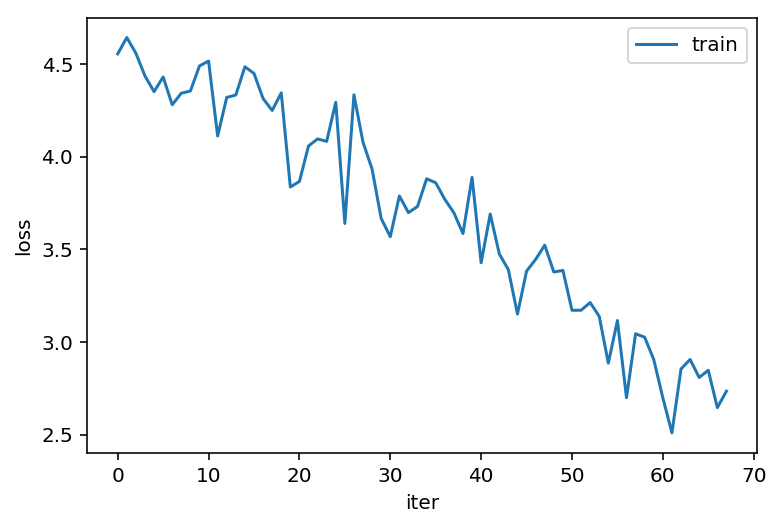

68
Epoch: 68, Iteration: 64200, Loss: 2.789074182510376
Epoch: 68, Iteration: 64300, Loss: 2.3233118057250977
Epoch: 68, Iteration: 64400, Loss: 2.747786521911621
Epoch: 68, Iteration: 64500, Loss: 3.0496139526367188
Epoch: 68, Iteration: 64600, Loss: 2.3446669578552246
Epoch: 68, Iteration: 64700, Loss: 3.15022611618042
Epoch: 68, Iteration: 64800, Loss: 2.812817096710205
Epoch: 68, Iteration: 64900, Loss: 2.727771520614624
Epoch: 68, Iteration: 65000, Loss: 2.490875482559204


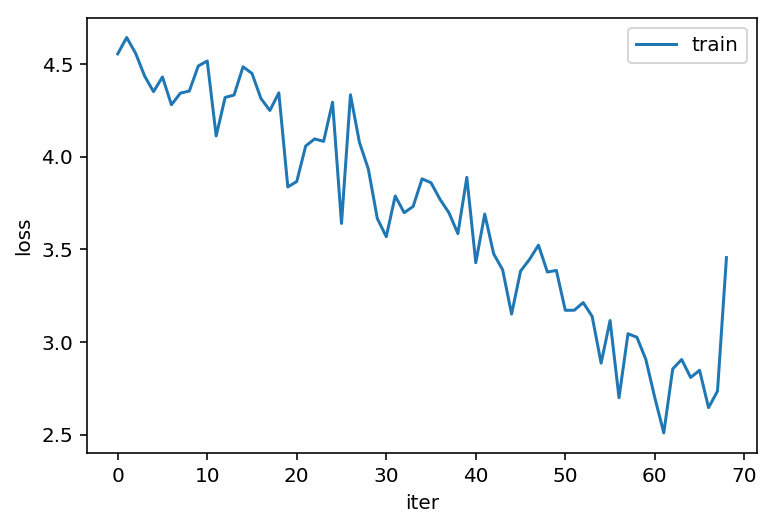

69
Epoch: 69, Iteration: 65100, Loss: 2.891500949859619
Epoch: 69, Iteration: 65200, Loss: 2.9917349815368652
Epoch: 69, Iteration: 65300, Loss: 3.0602471828460693
Epoch: 69, Iteration: 65400, Loss: 2.735772132873535
Epoch: 69, Iteration: 65500, Loss: 2.609182357788086
Epoch: 69, Iteration: 65600, Loss: 2.7683842182159424
Epoch: 69, Iteration: 65700, Loss: 2.23850154876709
Epoch: 69, Iteration: 65800, Loss: 2.9971678256988525
Epoch: 69, Iteration: 65900, Loss: 2.917024850845337
Epoch: 69, Iteration: 66000, Loss: 3.100158929824829


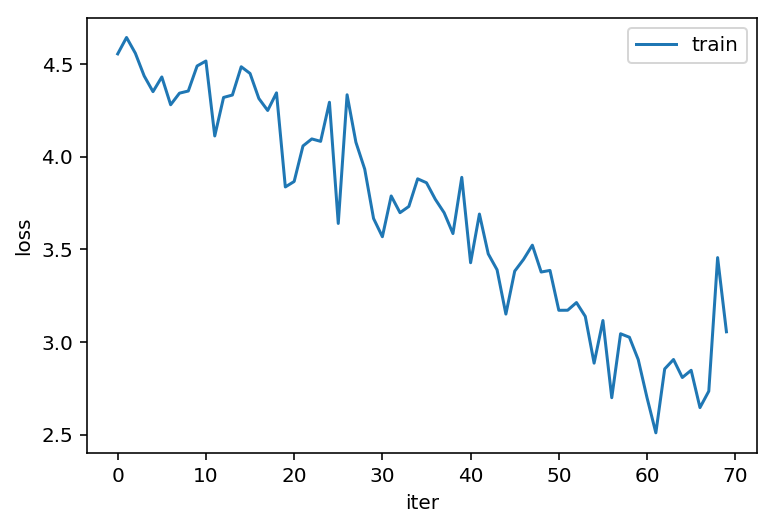

70
Epoch: 70, Iteration: 66100, Loss: 2.4338908195495605
Epoch: 70, Iteration: 66200, Loss: 2.222907304763794
Epoch: 70, Iteration: 66300, Loss: 2.7078006267547607
Epoch: 70, Iteration: 66400, Loss: 2.6038119792938232
Epoch: 70, Iteration: 66500, Loss: 2.9627797603607178
Epoch: 70, Iteration: 66600, Loss: 2.838178873062134
Epoch: 70, Iteration: 66700, Loss: 2.6240696907043457
Epoch: 70, Iteration: 66800, Loss: 2.7290725708007812
Epoch: 70, Iteration: 66900, Loss: 2.9577436447143555


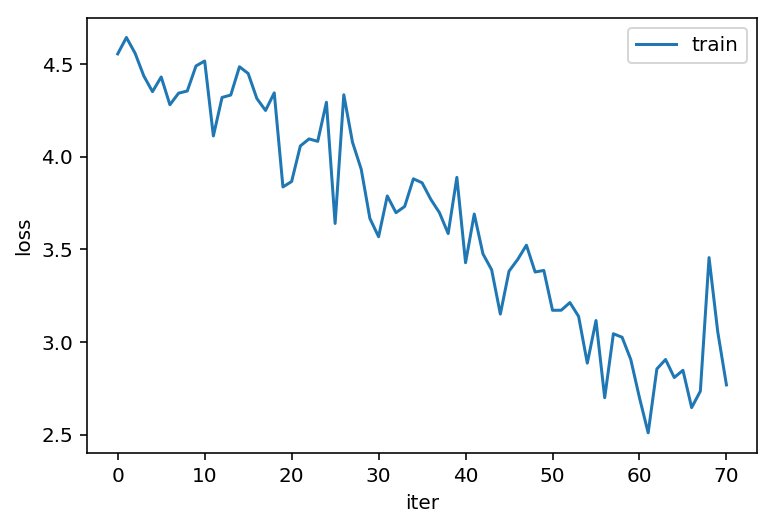

71
Epoch: 71, Iteration: 67000, Loss: 3.060419797897339
Epoch: 71, Iteration: 67100, Loss: 2.294337749481201
Epoch: 71, Iteration: 67200, Loss: 2.7358338832855225
Epoch: 71, Iteration: 67300, Loss: 2.687150001525879
Epoch: 71, Iteration: 67400, Loss: 2.717557191848755
Epoch: 71, Iteration: 67500, Loss: 2.607374668121338
Epoch: 71, Iteration: 67600, Loss: 2.7028844356536865
Epoch: 71, Iteration: 67700, Loss: 2.5808162689208984
Epoch: 71, Iteration: 67800, Loss: 2.865231990814209


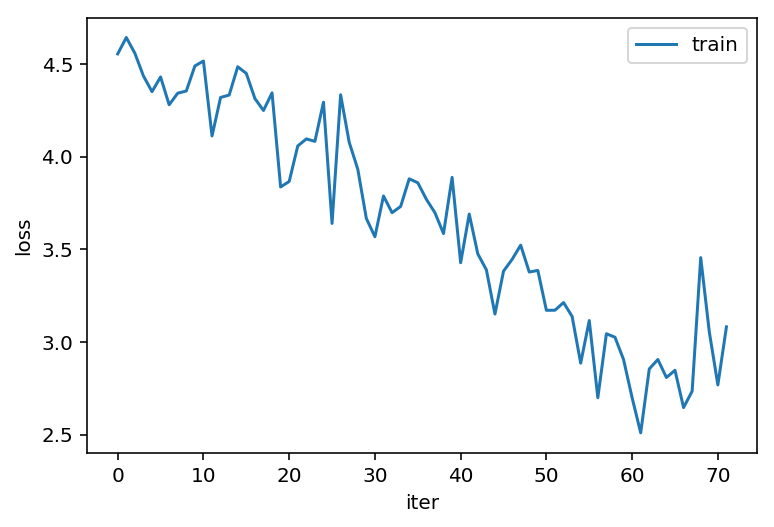

72
Epoch: 72, Iteration: 67900, Loss: 2.3270010948181152
Epoch: 72, Iteration: 68000, Loss: 2.8581442832946777
Epoch: 72, Iteration: 68100, Loss: 2.635150671005249
Epoch: 72, Iteration: 68200, Loss: 2.7198233604431152
Epoch: 72, Iteration: 68300, Loss: 2.4874632358551025
Epoch: 72, Iteration: 68400, Loss: 3.0845847129821777
Epoch: 72, Iteration: 68500, Loss: 2.9740097522735596
Epoch: 72, Iteration: 68600, Loss: 2.9151108264923096
Epoch: 72, Iteration: 68700, Loss: 2.9315195083618164
Epoch: 72, Iteration: 68800, Loss: 2.407999038696289


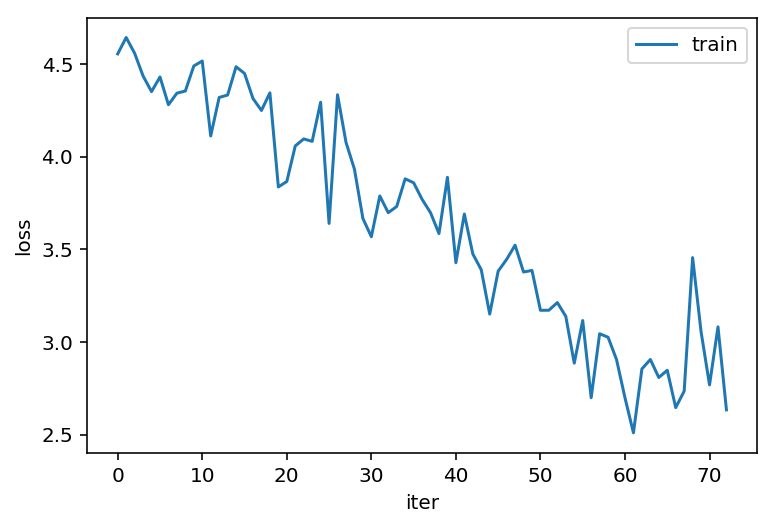

73
Epoch: 73, Iteration: 68900, Loss: 2.5865840911865234
Epoch: 73, Iteration: 69000, Loss: 2.4298603534698486
Epoch: 73, Iteration: 69100, Loss: 2.850188732147217
Epoch: 73, Iteration: 69200, Loss: 2.6560580730438232
Epoch: 73, Iteration: 69300, Loss: 2.640362501144409
Epoch: 73, Iteration: 69400, Loss: 2.427445411682129
Epoch: 73, Iteration: 69500, Loss: 3.21976637840271
Epoch: 73, Iteration: 69600, Loss: 2.455763578414917
Epoch: 73, Iteration: 69700, Loss: 2.3677971363067627


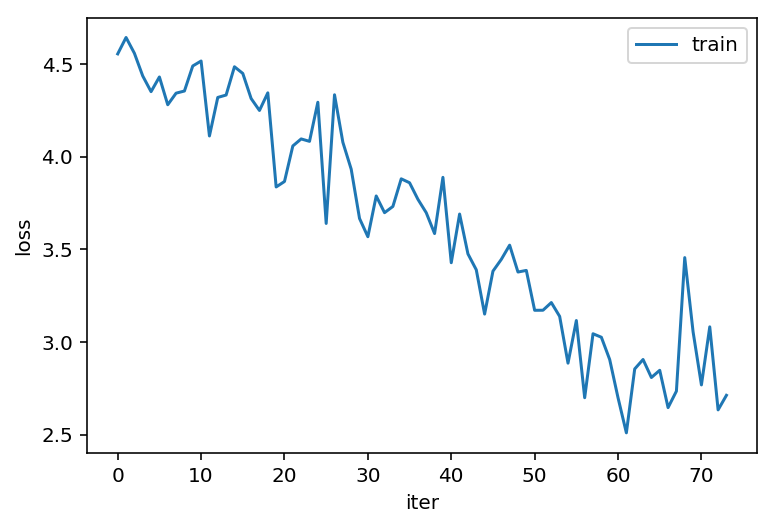

74
Epoch: 74, Iteration: 69800, Loss: 2.245601177215576
Epoch: 74, Iteration: 69900, Loss: 2.2860872745513916
Epoch: 74, Iteration: 70000, Loss: 2.785748243331909
Epoch: 74, Iteration: 70100, Loss: 2.5756235122680664
Epoch: 74, Iteration: 70200, Loss: 2.5290725231170654
Epoch: 74, Iteration: 70300, Loss: 2.572080135345459
Epoch: 74, Iteration: 70400, Loss: 2.732642650604248
Epoch: 74, Iteration: 70500, Loss: 2.7976694107055664
Epoch: 74, Iteration: 70600, Loss: 2.601552963256836
Epoch: 74, Iteration: 70700, Loss: 2.4815328121185303


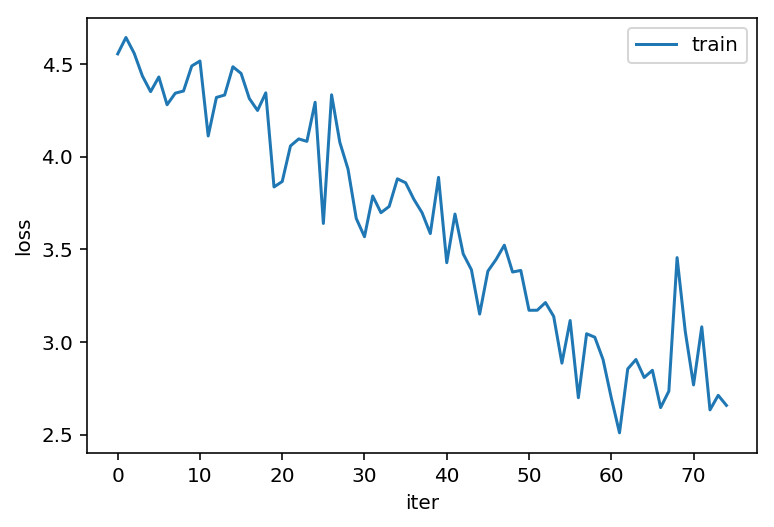

75
Epoch: 75, Iteration: 70800, Loss: 2.6999764442443848
Epoch: 75, Iteration: 70900, Loss: 2.014463186264038
Epoch: 75, Iteration: 71000, Loss: 2.6412546634674072
Epoch: 75, Iteration: 71100, Loss: 2.527395486831665
Epoch: 75, Iteration: 71200, Loss: 2.668091297149658
Epoch: 75, Iteration: 71300, Loss: 2.7404167652130127
Epoch: 75, Iteration: 71400, Loss: 2.564093828201294
Epoch: 75, Iteration: 71500, Loss: 2.361630439758301
Epoch: 75, Iteration: 71600, Loss: 2.930891990661621


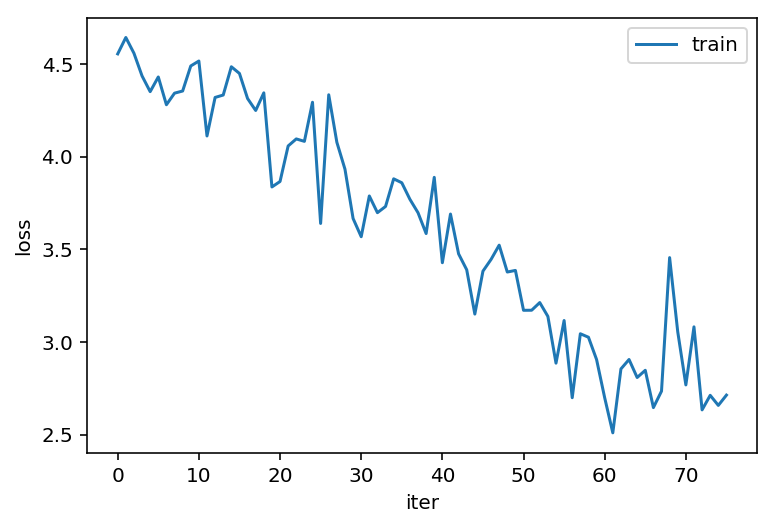

76
Epoch: 76, Iteration: 71700, Loss: 2.4532577991485596
Epoch: 76, Iteration: 71800, Loss: 2.6202166080474854
Epoch: 76, Iteration: 71900, Loss: 2.62656569480896
Epoch: 76, Iteration: 72000, Loss: 2.696885585784912
Epoch: 76, Iteration: 72100, Loss: 2.893566370010376
Epoch: 76, Iteration: 72200, Loss: 3.010324716567993
Epoch: 76, Iteration: 72300, Loss: 2.847238302230835
Epoch: 76, Iteration: 72400, Loss: 2.468188524246216
Epoch: 76, Iteration: 72500, Loss: 2.357038974761963
Epoch: 76, Iteration: 72600, Loss: 2.830369710922241


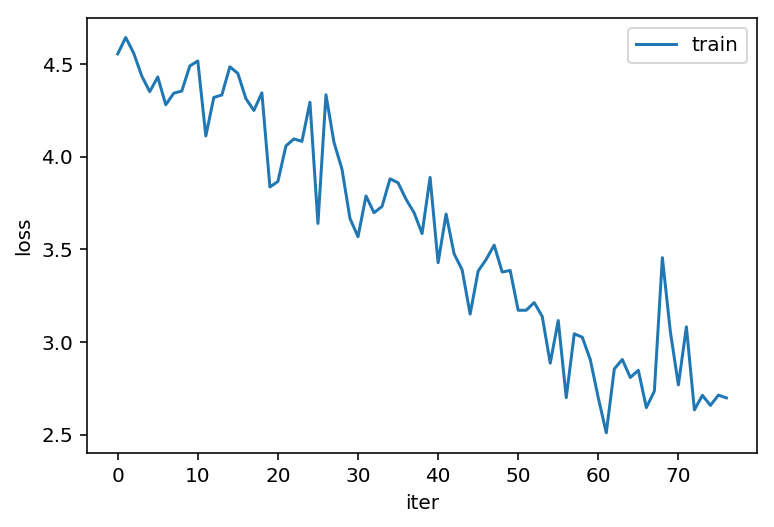

77
Epoch: 77, Iteration: 72700, Loss: 2.1414780616760254
Epoch: 77, Iteration: 72800, Loss: 2.50820255279541
Epoch: 77, Iteration: 72900, Loss: 2.387857437133789
Epoch: 77, Iteration: 73000, Loss: 2.4062066078186035
Epoch: 77, Iteration: 73100, Loss: 2.1595981121063232
Epoch: 77, Iteration: 73200, Loss: 3.0551085472106934
Epoch: 77, Iteration: 73300, Loss: 2.3748068809509277
Epoch: 77, Iteration: 73400, Loss: 3.059326171875
Epoch: 77, Iteration: 73500, Loss: 2.491159677505493


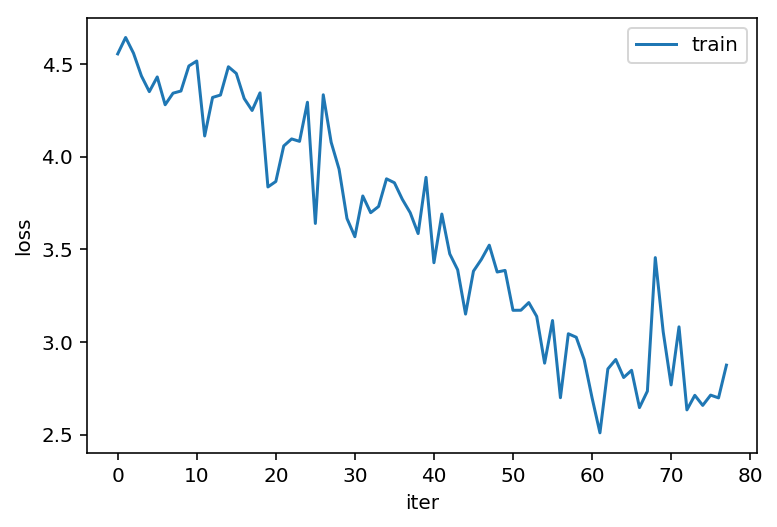

78
Epoch: 78, Iteration: 73600, Loss: 2.900777816772461
Epoch: 78, Iteration: 73700, Loss: 2.634080648422241
Epoch: 78, Iteration: 73800, Loss: 2.283191680908203
Epoch: 78, Iteration: 73900, Loss: 2.3941287994384766
Epoch: 78, Iteration: 74000, Loss: 2.8189053535461426
Epoch: 78, Iteration: 74100, Loss: 2.388705015182495
Epoch: 78, Iteration: 74200, Loss: 2.642655611038208
Epoch: 78, Iteration: 74300, Loss: 2.7713847160339355
Epoch: 78, Iteration: 74400, Loss: 3.093885660171509


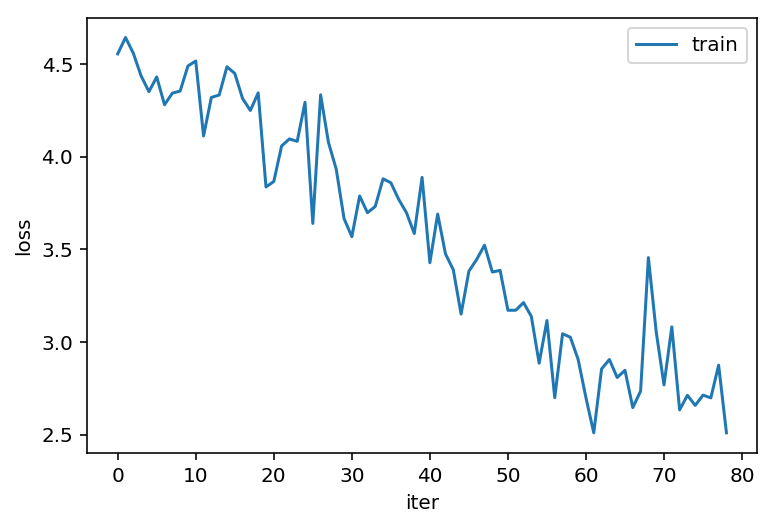

79
Epoch: 79, Iteration: 74500, Loss: 2.349884033203125
Epoch: 79, Iteration: 74600, Loss: 2.3425087928771973
Epoch: 79, Iteration: 74700, Loss: 2.6640844345092773
Epoch: 79, Iteration: 74800, Loss: 2.2982475757598877
Epoch: 79, Iteration: 74900, Loss: 2.531991481781006
Epoch: 79, Iteration: 75000, Loss: 2.7406461238861084
Epoch: 79, Iteration: 75100, Loss: 2.3022232055664062
Epoch: 79, Iteration: 75200, Loss: 2.4553537368774414
Epoch: 79, Iteration: 75300, Loss: 2.934626340866089
Epoch: 79, Iteration: 75400, Loss: 2.3578741550445557


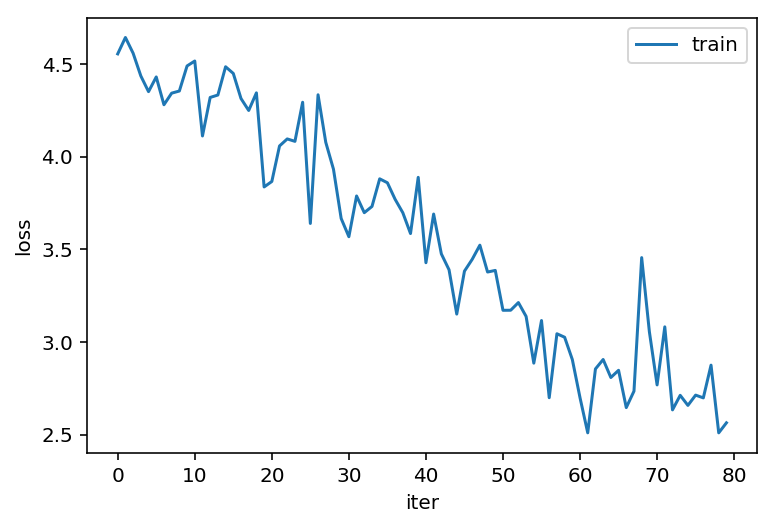

80
Epoch: 80, Iteration: 75500, Loss: 2.4957144260406494
Epoch: 80, Iteration: 75600, Loss: 2.106415033340454
Epoch: 80, Iteration: 75700, Loss: 2.685865640640259
Epoch: 80, Iteration: 75800, Loss: 2.7031614780426025
Epoch: 80, Iteration: 75900, Loss: 2.1437673568725586
Epoch: 80, Iteration: 76000, Loss: 2.3053219318389893
Epoch: 80, Iteration: 76100, Loss: 2.57303524017334
Epoch: 80, Iteration: 76200, Loss: 2.106287717819214
Epoch: 80, Iteration: 76300, Loss: 2.687715768814087


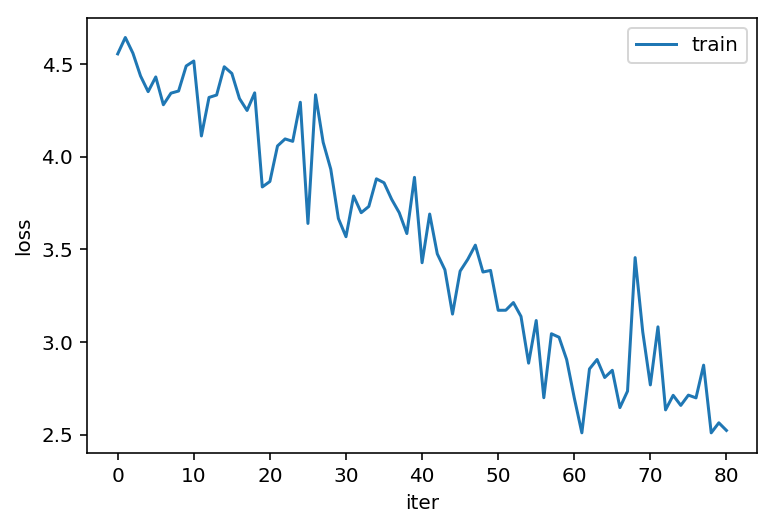

81
Epoch: 81, Iteration: 76400, Loss: 2.4856841564178467
Epoch: 81, Iteration: 76500, Loss: 2.5851762294769287
Epoch: 81, Iteration: 76600, Loss: 2.792099952697754
Epoch: 81, Iteration: 76700, Loss: 2.77487850189209
Epoch: 81, Iteration: 76800, Loss: 2.993279218673706
Epoch: 81, Iteration: 76900, Loss: 2.399562120437622
Epoch: 81, Iteration: 77000, Loss: 2.823561429977417
Epoch: 81, Iteration: 77100, Loss: 2.508042335510254
Epoch: 81, Iteration: 77200, Loss: 3.0349531173706055
Epoch: 81, Iteration: 77300, Loss: 2.8941636085510254


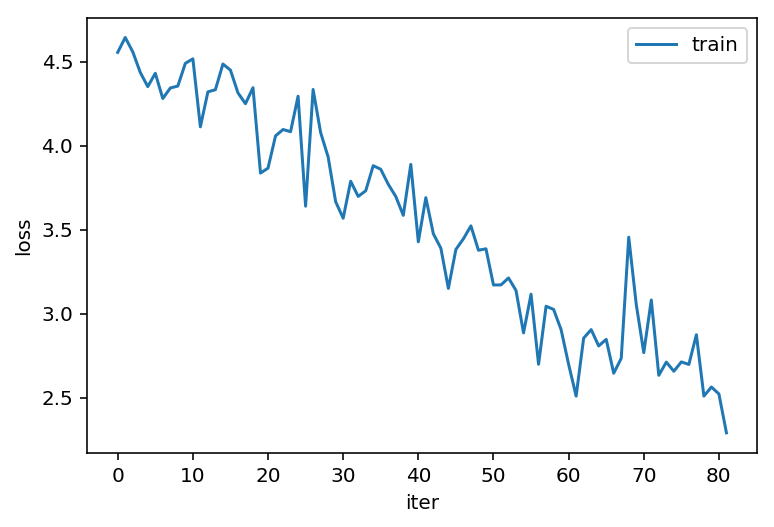

82
Epoch: 82, Iteration: 77400, Loss: 2.5250587463378906
Epoch: 82, Iteration: 77500, Loss: 2.2125492095947266
Epoch: 82, Iteration: 77600, Loss: 2.5678343772888184
Epoch: 82, Iteration: 77700, Loss: 2.385443925857544
Epoch: 82, Iteration: 77800, Loss: 2.2857913970947266
Epoch: 82, Iteration: 77900, Loss: 2.601940155029297
Epoch: 82, Iteration: 78000, Loss: 2.8221733570098877
Epoch: 82, Iteration: 78100, Loss: 2.7312605381011963
Epoch: 82, Iteration: 78200, Loss: 2.66831636428833


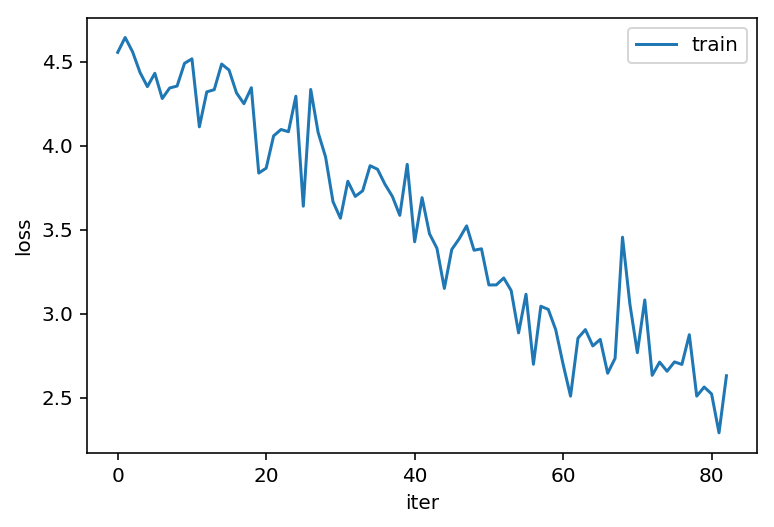

83
Epoch: 83, Iteration: 78300, Loss: 2.1774063110351562
Epoch: 83, Iteration: 78400, Loss: 2.3242714405059814
Epoch: 83, Iteration: 78500, Loss: 2.51373291015625
Epoch: 83, Iteration: 78600, Loss: 2.567462205886841
Epoch: 83, Iteration: 78700, Loss: 2.664008855819702
Epoch: 83, Iteration: 78800, Loss: 2.536928653717041
Epoch: 83, Iteration: 78900, Loss: 2.6409265995025635
Epoch: 83, Iteration: 79000, Loss: 2.635413646697998
Epoch: 83, Iteration: 79100, Loss: 2.5248665809631348
Epoch: 83, Iteration: 79200, Loss: 2.6606314182281494


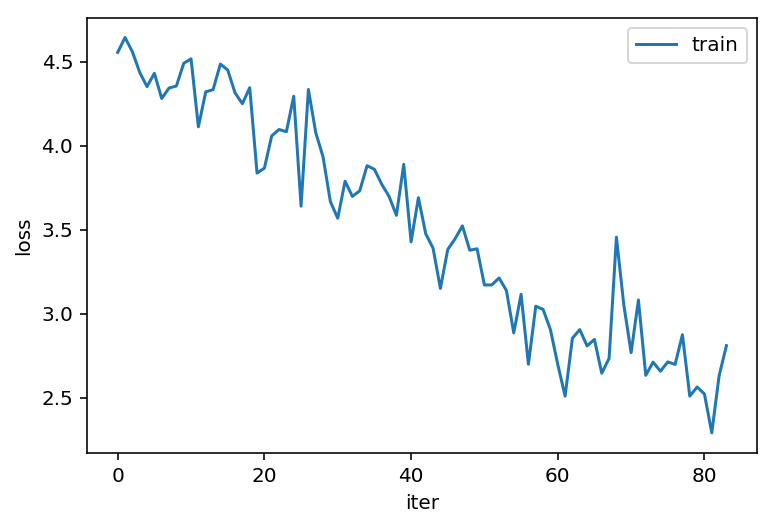

84
Epoch: 84, Iteration: 79300, Loss: 2.0369980335235596
Epoch: 84, Iteration: 79400, Loss: 2.2529194355010986
Epoch: 84, Iteration: 79500, Loss: 2.4370718002319336
Epoch: 84, Iteration: 79600, Loss: 2.319514751434326
Epoch: 84, Iteration: 79700, Loss: 2.953155994415283
Epoch: 84, Iteration: 79800, Loss: 2.253890037536621
Epoch: 84, Iteration: 79900, Loss: 2.8093199729919434
Epoch: 84, Iteration: 80000, Loss: 2.6868185997009277
Epoch: 84, Iteration: 80100, Loss: 2.495497941970825


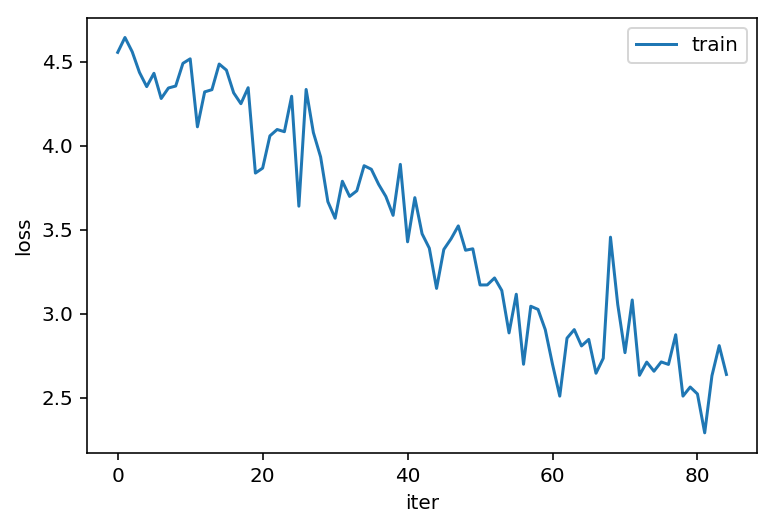

85
Epoch: 85, Iteration: 80200, Loss: 2.037285327911377
Epoch: 85, Iteration: 80300, Loss: 2.3953566551208496
Epoch: 85, Iteration: 80400, Loss: 2.4648303985595703
Epoch: 85, Iteration: 80500, Loss: 2.372631788253784
Epoch: 85, Iteration: 80600, Loss: 2.438816547393799
Epoch: 85, Iteration: 80700, Loss: 2.5294249057769775
Epoch: 85, Iteration: 80800, Loss: 2.955838203430176
Epoch: 85, Iteration: 80900, Loss: 2.030054807662964
Epoch: 85, Iteration: 81000, Loss: 2.707099199295044


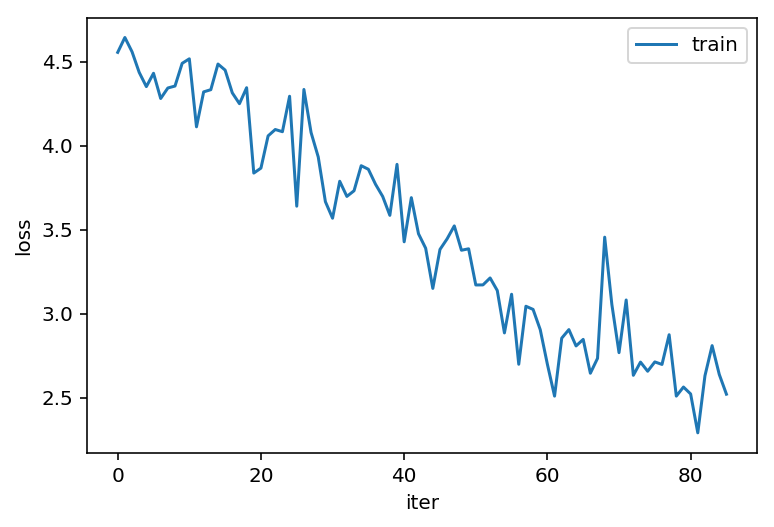

86
Epoch: 86, Iteration: 81100, Loss: 2.6354808807373047
Epoch: 86, Iteration: 81200, Loss: 2.08671498298645
Epoch: 86, Iteration: 81300, Loss: 2.2524585723876953
Epoch: 86, Iteration: 81400, Loss: 2.289879322052002
Epoch: 86, Iteration: 81500, Loss: 2.5095462799072266
Epoch: 86, Iteration: 81600, Loss: 2.709998607635498
Epoch: 86, Iteration: 81700, Loss: 2.8865973949432373
Epoch: 86, Iteration: 81800, Loss: 2.3748316764831543
Epoch: 86, Iteration: 81900, Loss: 2.823086977005005
Epoch: 86, Iteration: 82000, Loss: 2.345180034637451


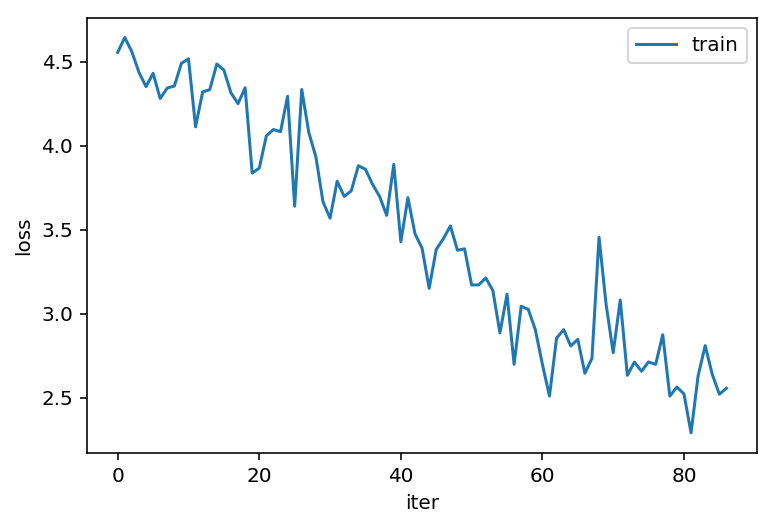

87
Epoch: 87, Iteration: 82100, Loss: 2.4754912853240967
Epoch: 87, Iteration: 82200, Loss: 2.3762989044189453
Epoch: 87, Iteration: 82300, Loss: 2.3647451400756836
Epoch: 87, Iteration: 82400, Loss: 2.5931169986724854
Epoch: 87, Iteration: 82500, Loss: 2.6006081104278564
Epoch: 87, Iteration: 82600, Loss: 2.157179355621338
Epoch: 87, Iteration: 82700, Loss: 2.2804439067840576
Epoch: 87, Iteration: 82800, Loss: 2.062657356262207
Epoch: 87, Iteration: 82900, Loss: 2.3734703063964844


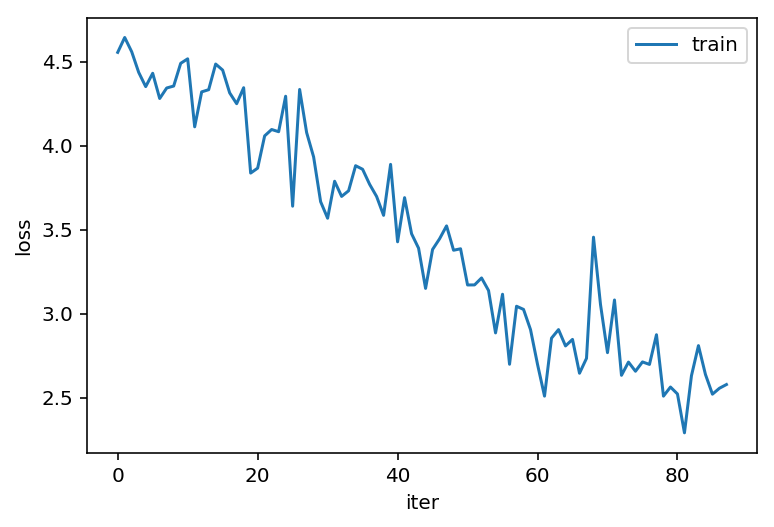

88
Epoch: 88, Iteration: 83000, Loss: 2.579777479171753
Epoch: 88, Iteration: 83100, Loss: 2.3601982593536377
Epoch: 88, Iteration: 83200, Loss: 2.1922197341918945
Epoch: 88, Iteration: 83300, Loss: 2.300488233566284
Epoch: 88, Iteration: 83400, Loss: 2.448627471923828
Epoch: 88, Iteration: 83500, Loss: 2.521057367324829
Epoch: 88, Iteration: 83600, Loss: 2.276364326477051
Epoch: 88, Iteration: 83700, Loss: 2.538997173309326
Epoch: 88, Iteration: 83800, Loss: 2.162482738494873
Epoch: 88, Iteration: 83900, Loss: 2.4303760528564453


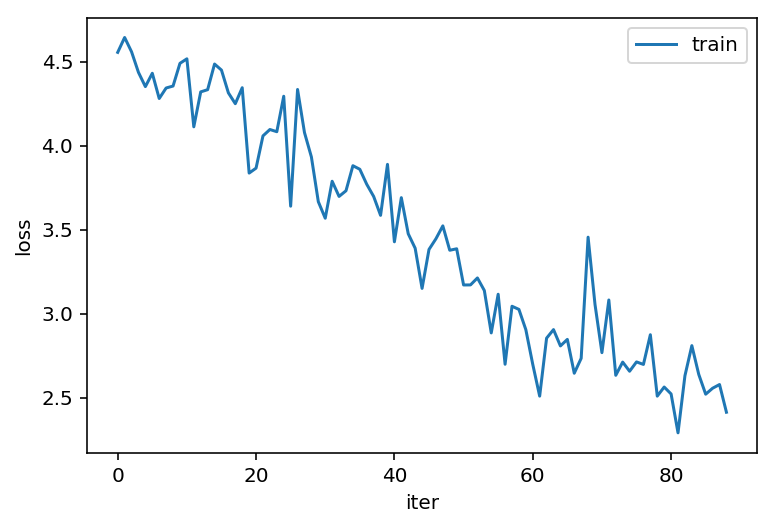

89
Epoch: 89, Iteration: 84000, Loss: 2.1558632850646973
Epoch: 89, Iteration: 84100, Loss: 2.796847343444824
Epoch: 89, Iteration: 84200, Loss: 2.4700114727020264
Epoch: 89, Iteration: 84300, Loss: 2.2848033905029297
Epoch: 89, Iteration: 84400, Loss: 2.5674095153808594
Epoch: 89, Iteration: 84500, Loss: 2.4370572566986084
Epoch: 89, Iteration: 84600, Loss: 2.1881914138793945
Epoch: 89, Iteration: 84700, Loss: 2.4979419708251953
Epoch: 89, Iteration: 84800, Loss: 2.6129820346832275


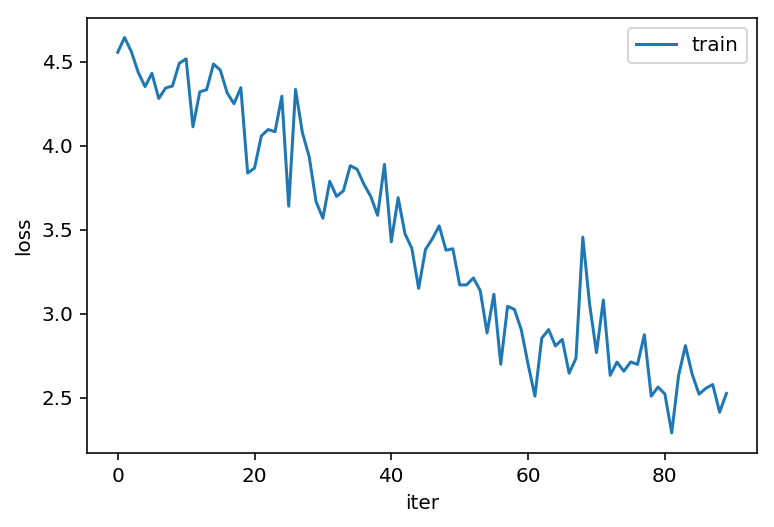

90
Epoch: 90, Iteration: 84900, Loss: 2.4645559787750244
Epoch: 90, Iteration: 85000, Loss: 2.0893962383270264
Epoch: 90, Iteration: 85100, Loss: 2.505903482437134
Epoch: 90, Iteration: 85200, Loss: 2.4491117000579834
Epoch: 90, Iteration: 85300, Loss: 2.21574330329895
Epoch: 90, Iteration: 85400, Loss: 2.631075859069824
Epoch: 90, Iteration: 85500, Loss: 2.5015063285827637
Epoch: 90, Iteration: 85600, Loss: 2.5792806148529053
Epoch: 90, Iteration: 85700, Loss: 2.4002838134765625
Epoch: 90, Iteration: 85800, Loss: 2.218012809753418


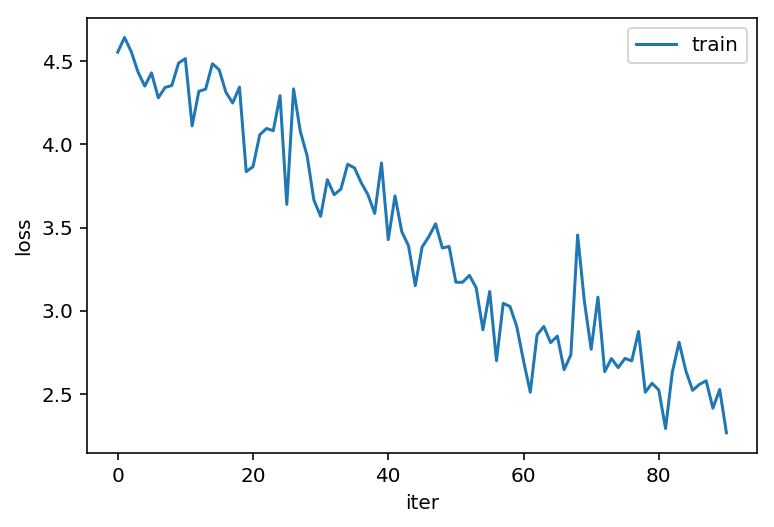

91
Epoch: 91, Iteration: 85900, Loss: 2.575759172439575
Epoch: 91, Iteration: 86000, Loss: 2.382448434829712
Epoch: 91, Iteration: 86100, Loss: 2.751856803894043
Epoch: 91, Iteration: 86200, Loss: 2.540814161300659
Epoch: 91, Iteration: 86300, Loss: 2.237806558609009
Epoch: 91, Iteration: 86400, Loss: 2.968787431716919
Epoch: 91, Iteration: 86500, Loss: 2.0964717864990234
Epoch: 91, Iteration: 86600, Loss: 2.485732078552246
Epoch: 91, Iteration: 86700, Loss: 2.512308120727539


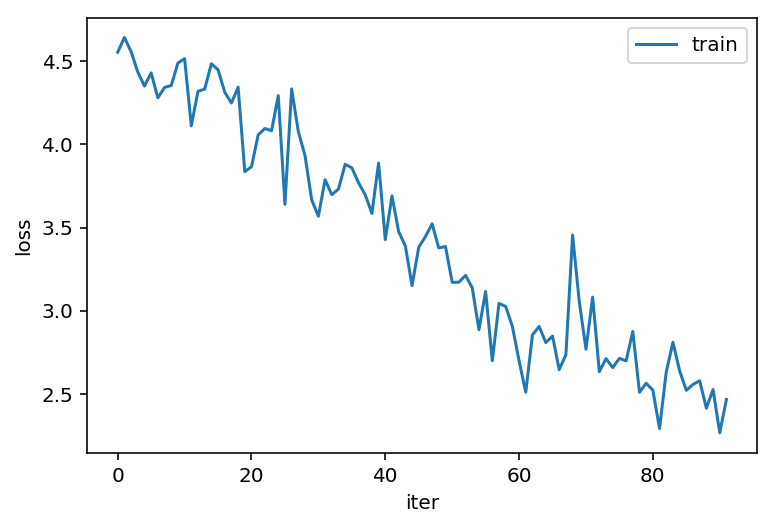

92
Epoch: 92, Iteration: 86800, Loss: 2.0973730087280273
Epoch: 92, Iteration: 86900, Loss: 2.593773603439331
Epoch: 92, Iteration: 87000, Loss: 2.8043060302734375
Epoch: 92, Iteration: 87100, Loss: 2.324040412902832
Epoch: 92, Iteration: 87200, Loss: 2.0820419788360596
Epoch: 92, Iteration: 87300, Loss: 2.695431709289551
Epoch: 92, Iteration: 87400, Loss: 2.5525479316711426
Epoch: 92, Iteration: 87500, Loss: 1.7678087949752808
Epoch: 92, Iteration: 87600, Loss: 2.4288485050201416


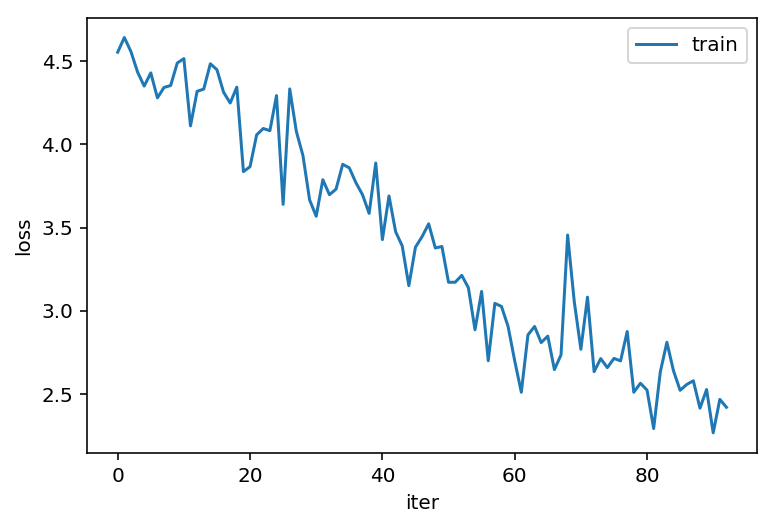

93
Epoch: 93, Iteration: 87800, Loss: 1.9612661600112915
Epoch: 93, Iteration: 87900, Loss: 2.3215744495391846
Epoch: 93, Iteration: 88000, Loss: 2.322758913040161
Epoch: 93, Iteration: 88100, Loss: 2.0133771896362305
Epoch: 93, Iteration: 88200, Loss: 2.4013798236846924
Epoch: 93, Iteration: 88300, Loss: 2.408450126647949
Epoch: 93, Iteration: 88400, Loss: 2.2123241424560547
Epoch: 93, Iteration: 88500, Loss: 2.537153482437134
Epoch: 93, Iteration: 88600, Loss: 2.372119665145874


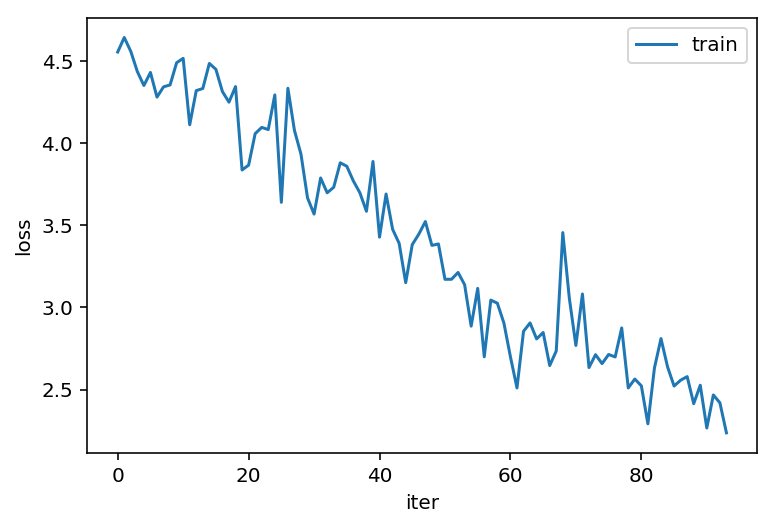

94
Epoch: 94, Iteration: 88700, Loss: 2.282263994216919
Epoch: 94, Iteration: 88800, Loss: 2.1522951126098633
Epoch: 94, Iteration: 88900, Loss: 2.57867431640625
Epoch: 94, Iteration: 89000, Loss: 2.163562774658203
Epoch: 94, Iteration: 89100, Loss: 2.5177204608917236
Epoch: 94, Iteration: 89200, Loss: 2.1965103149414062
Epoch: 94, Iteration: 89300, Loss: 3.0136260986328125
Epoch: 94, Iteration: 89400, Loss: 2.6360208988189697
Epoch: 94, Iteration: 89500, Loss: 2.3366100788116455


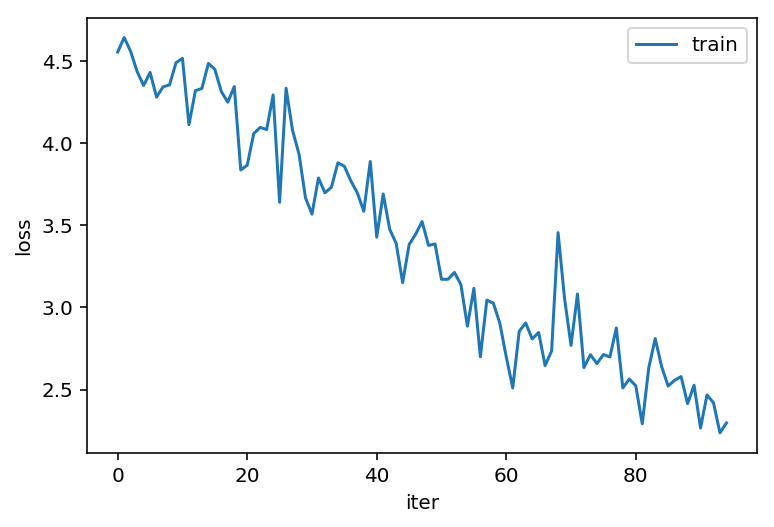

95
Epoch: 95, Iteration: 89600, Loss: 2.0423054695129395
Epoch: 95, Iteration: 89700, Loss: 2.1966657638549805
Epoch: 95, Iteration: 89800, Loss: 1.8227156400680542
Epoch: 95, Iteration: 89900, Loss: 2.098351001739502
Epoch: 95, Iteration: 90000, Loss: 2.3025171756744385
Epoch: 95, Iteration: 90100, Loss: 1.9223109483718872
Epoch: 95, Iteration: 90200, Loss: 2.2822439670562744
Epoch: 95, Iteration: 90300, Loss: 2.399308681488037
Epoch: 95, Iteration: 90400, Loss: 2.63643741607666
Epoch: 95, Iteration: 90500, Loss: 2.338350296020508


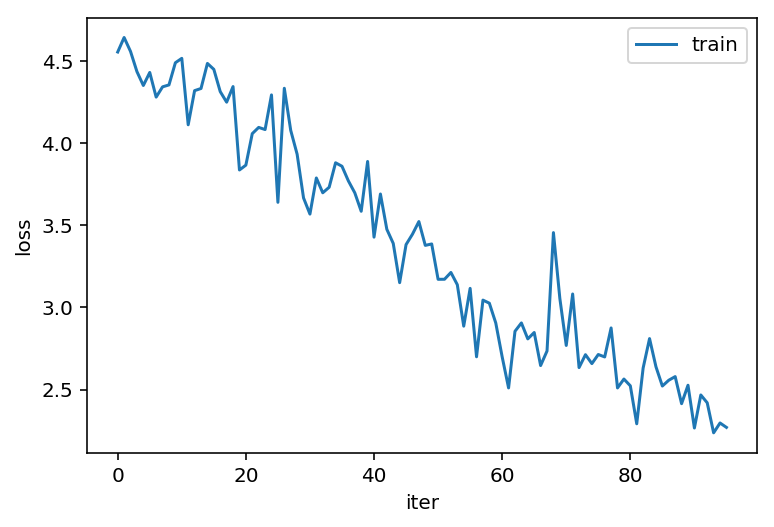

96
Epoch: 96, Iteration: 90600, Loss: 2.2865304946899414
Epoch: 96, Iteration: 90700, Loss: 2.737854480743408
Epoch: 96, Iteration: 90800, Loss: 2.269871473312378
Epoch: 96, Iteration: 90900, Loss: 2.2934372425079346
Epoch: 96, Iteration: 91000, Loss: 2.449591875076294
Epoch: 96, Iteration: 91100, Loss: 2.095763921737671
Epoch: 96, Iteration: 91200, Loss: 2.2933082580566406
Epoch: 96, Iteration: 91300, Loss: 1.8719372749328613
Epoch: 96, Iteration: 91400, Loss: 2.5233514308929443


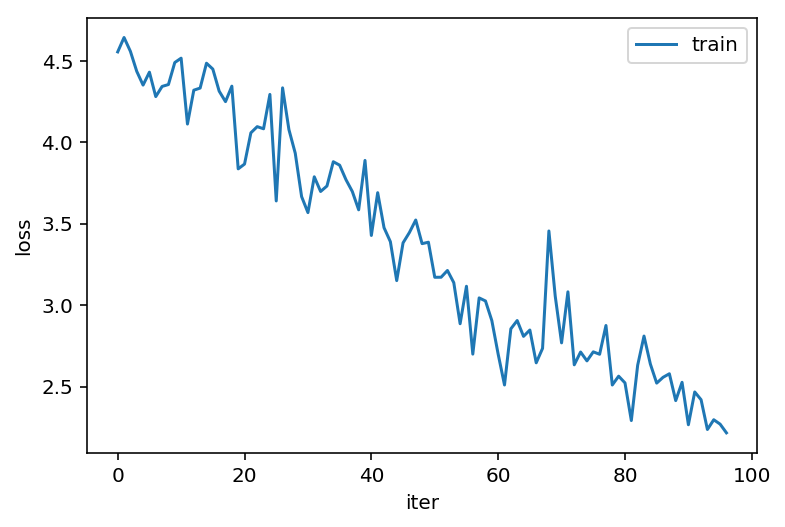

97
Epoch: 97, Iteration: 91500, Loss: 2.6085307598114014
Epoch: 97, Iteration: 91600, Loss: 2.350320339202881
Epoch: 97, Iteration: 91700, Loss: 1.893127202987671
Epoch: 97, Iteration: 91800, Loss: 2.2014358043670654
Epoch: 97, Iteration: 91900, Loss: 2.1484522819519043
Epoch: 97, Iteration: 92000, Loss: 2.839599609375
Epoch: 97, Iteration: 92100, Loss: 2.271644353866577
Epoch: 97, Iteration: 92200, Loss: 2.1652135848999023
Epoch: 97, Iteration: 92300, Loss: 2.6358678340911865
Epoch: 97, Iteration: 92400, Loss: 2.6250064373016357


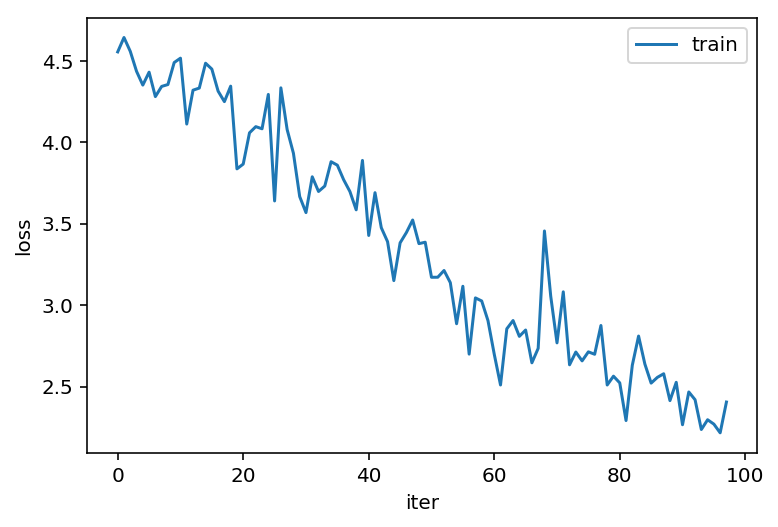

98
Epoch: 98, Iteration: 92500, Loss: 2.3002333641052246
Epoch: 98, Iteration: 92600, Loss: 2.134577751159668
Epoch: 98, Iteration: 92700, Loss: 2.2117667198181152
Epoch: 98, Iteration: 92800, Loss: 1.7829934358596802
Epoch: 98, Iteration: 92900, Loss: 2.455906629562378
Epoch: 98, Iteration: 93000, Loss: 2.2815916538238525
Epoch: 98, Iteration: 93100, Loss: 2.2352235317230225
Epoch: 98, Iteration: 93200, Loss: 2.0576043128967285
Epoch: 98, Iteration: 93300, Loss: 2.283217191696167


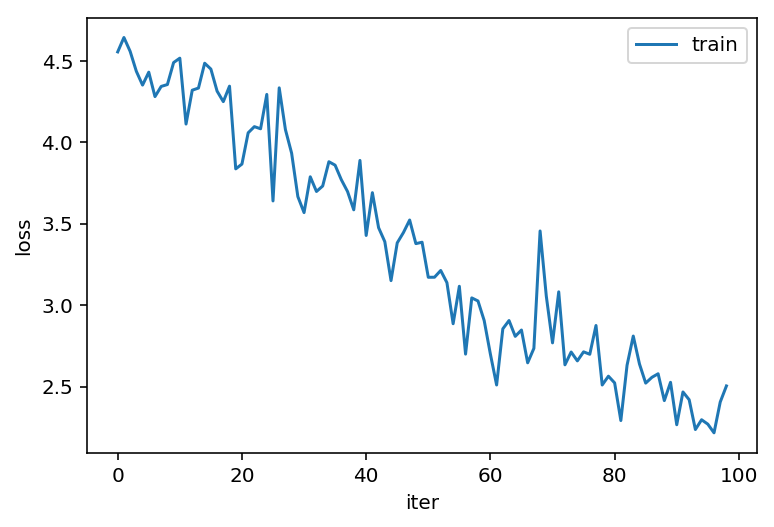

99
Epoch: 99, Iteration: 93400, Loss: 2.142957925796509
Epoch: 99, Iteration: 93500, Loss: 2.494978427886963
Epoch: 99, Iteration: 93600, Loss: 2.213064670562744
Epoch: 99, Iteration: 93700, Loss: 2.555018424987793
Epoch: 99, Iteration: 93800, Loss: 2.615525245666504
Epoch: 99, Iteration: 93900, Loss: 2.2952752113342285
Epoch: 99, Iteration: 94000, Loss: 2.5417425632476807
Epoch: 99, Iteration: 94100, Loss: 2.2135891914367676
Epoch: 99, Iteration: 94200, Loss: 2.434744358062744
Epoch: 99, Iteration: 94300, Loss: 2.525197744369507


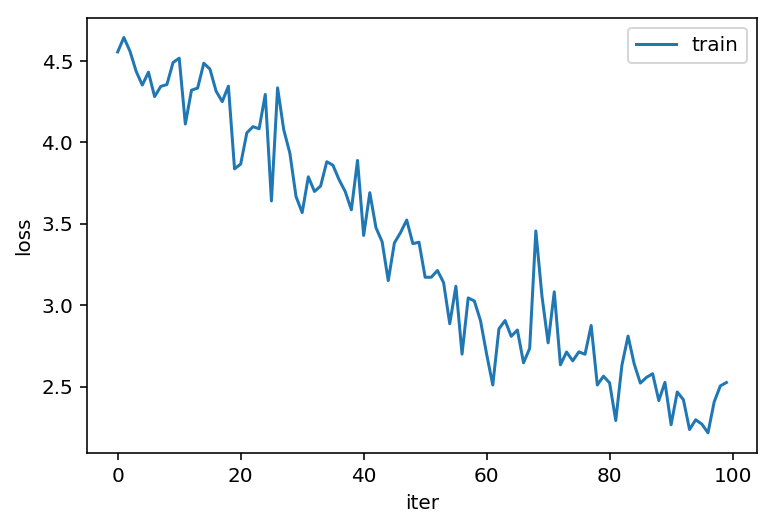

100
Epoch: 100, Iteration: 94400, Loss: 2.17393159866333
Epoch: 100, Iteration: 94500, Loss: 2.364952802658081
Epoch: 100, Iteration: 94600, Loss: 1.7877366542816162
Epoch: 100, Iteration: 94700, Loss: 2.0786213874816895
Epoch: 100, Iteration: 94800, Loss: 2.417156457901001
Epoch: 100, Iteration: 94900, Loss: 2.645826816558838
Epoch: 100, Iteration: 95000, Loss: 2.659710168838501
Epoch: 100, Iteration: 95100, Loss: 1.9835233688354492
Epoch: 100, Iteration: 95200, Loss: 2.3571033477783203


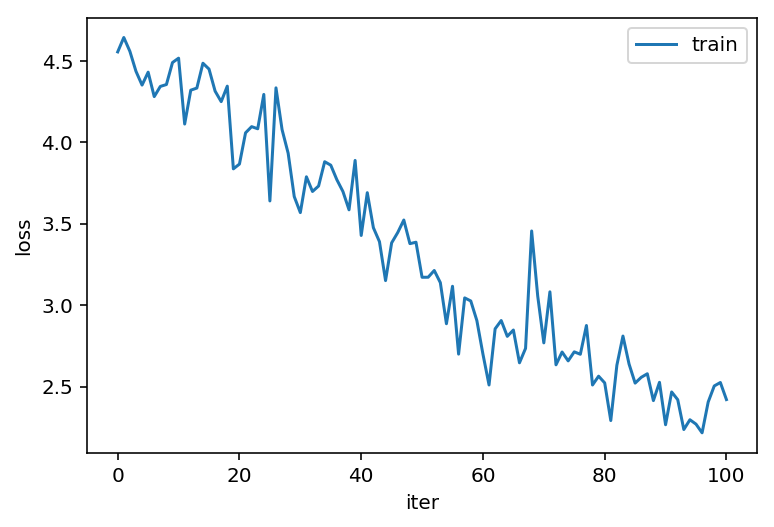

101
Epoch: 101, Iteration: 95300, Loss: 1.8444561958312988
Epoch: 101, Iteration: 95400, Loss: 2.215981960296631
Epoch: 101, Iteration: 95500, Loss: 2.5023114681243896
Epoch: 101, Iteration: 95600, Loss: 2.0479888916015625
Epoch: 101, Iteration: 95700, Loss: 2.103397846221924
Epoch: 101, Iteration: 95800, Loss: 2.0445985794067383
Epoch: 101, Iteration: 95900, Loss: 2.3056442737579346
Epoch: 101, Iteration: 96000, Loss: 2.103549003601074
Epoch: 101, Iteration: 96100, Loss: 2.0022964477539062


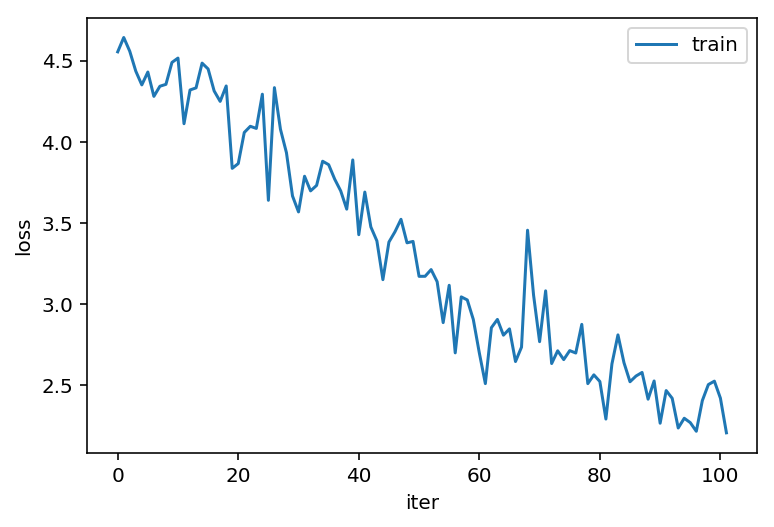

102
Epoch: 102, Iteration: 96200, Loss: 2.3165030479431152
Epoch: 102, Iteration: 96300, Loss: 1.8818439245224
Epoch: 102, Iteration: 96400, Loss: 2.0771918296813965
Epoch: 102, Iteration: 96500, Loss: 2.106248140335083
Epoch: 102, Iteration: 96600, Loss: 1.9983385801315308
Epoch: 102, Iteration: 96700, Loss: 2.5487077236175537
Epoch: 102, Iteration: 96800, Loss: 1.8939564228057861
Epoch: 102, Iteration: 96900, Loss: 2.606369733810425
Epoch: 102, Iteration: 97000, Loss: 2.131416082382202
Epoch: 102, Iteration: 97100, Loss: 2.3429341316223145


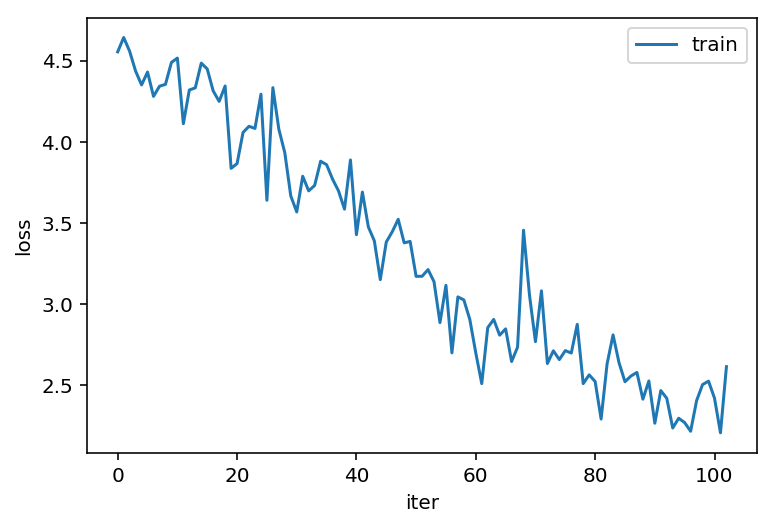

103
Epoch: 103, Iteration: 97200, Loss: 2.3962619304656982
Epoch: 103, Iteration: 97300, Loss: 2.09283185005188
Epoch: 103, Iteration: 97400, Loss: 2.3590128421783447
Epoch: 103, Iteration: 97500, Loss: 2.248854398727417
Epoch: 103, Iteration: 97600, Loss: 2.35402512550354
Epoch: 103, Iteration: 97700, Loss: 2.5429458618164062
Epoch: 103, Iteration: 97800, Loss: 2.3719558715820312
Epoch: 103, Iteration: 97900, Loss: 1.8112008571624756
Epoch: 103, Iteration: 98000, Loss: 1.7938323020935059


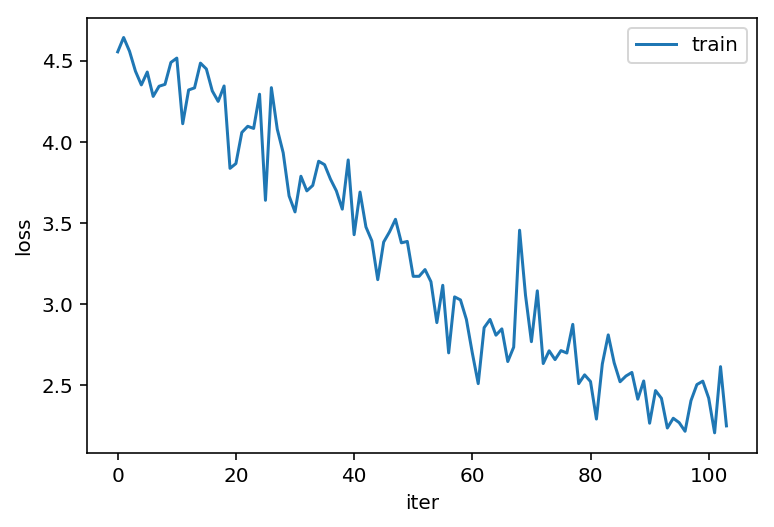

104
Epoch: 104, Iteration: 98100, Loss: 2.2115914821624756
Epoch: 104, Iteration: 98200, Loss: 1.8096545934677124
Epoch: 104, Iteration: 98300, Loss: 2.280128002166748
Epoch: 104, Iteration: 98400, Loss: 2.0836191177368164
Epoch: 104, Iteration: 98500, Loss: 2.053800344467163
Epoch: 104, Iteration: 98600, Loss: 2.301769495010376
Epoch: 104, Iteration: 98700, Loss: 2.206357955932617
Epoch: 104, Iteration: 98800, Loss: 2.2890124320983887
Epoch: 104, Iteration: 98900, Loss: 2.4990289211273193
Epoch: 104, Iteration: 99000, Loss: 2.5504214763641357


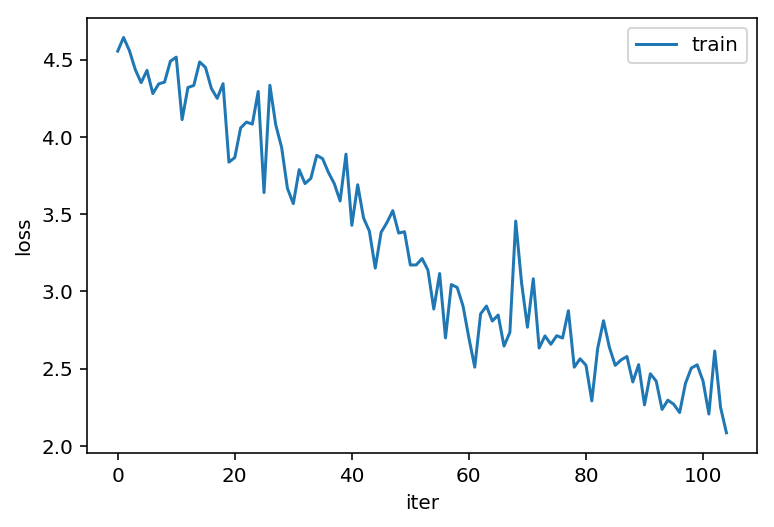

105
Epoch: 105, Iteration: 99100, Loss: 2.390918493270874
Epoch: 105, Iteration: 99200, Loss: 2.379448890686035
Epoch: 105, Iteration: 99300, Loss: 2.01277232170105
Epoch: 105, Iteration: 99400, Loss: 2.1289989948272705
Epoch: 105, Iteration: 99500, Loss: 2.2627813816070557
Epoch: 105, Iteration: 99600, Loss: 2.109091281890869
Epoch: 105, Iteration: 99700, Loss: 1.9467923641204834
Epoch: 105, Iteration: 99800, Loss: 2.3245632648468018
Epoch: 105, Iteration: 99900, Loss: 2.1531200408935547


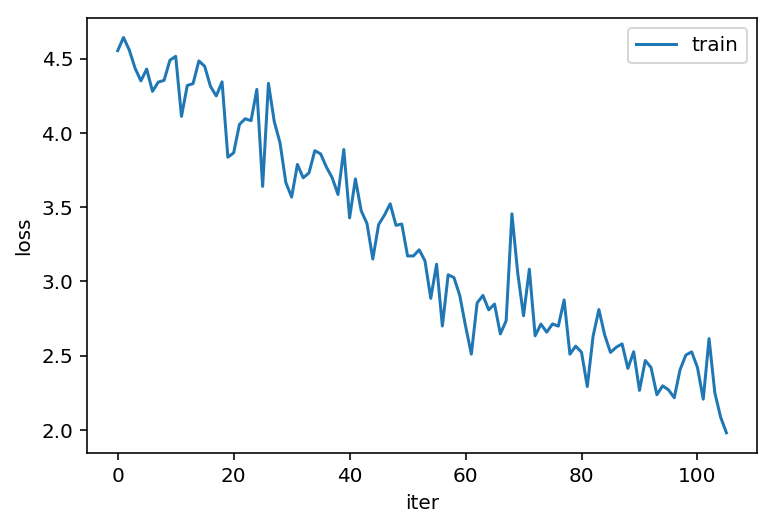

106
Epoch: 106, Iteration: 100000, Loss: 2.154174566268921
Epoch: 106, Iteration: 100100, Loss: 2.292135238647461
Epoch: 106, Iteration: 100200, Loss: 2.5605828762054443
Epoch: 106, Iteration: 100300, Loss: 2.2696313858032227
Epoch: 106, Iteration: 100400, Loss: 2.5963613986968994
Epoch: 106, Iteration: 100500, Loss: 2.200371026992798
Epoch: 106, Iteration: 100600, Loss: 1.8217964172363281
Epoch: 106, Iteration: 100700, Loss: 2.293731451034546
Epoch: 106, Iteration: 100800, Loss: 1.837170124053955
Epoch: 106, Iteration: 100900, Loss: 2.0820906162261963


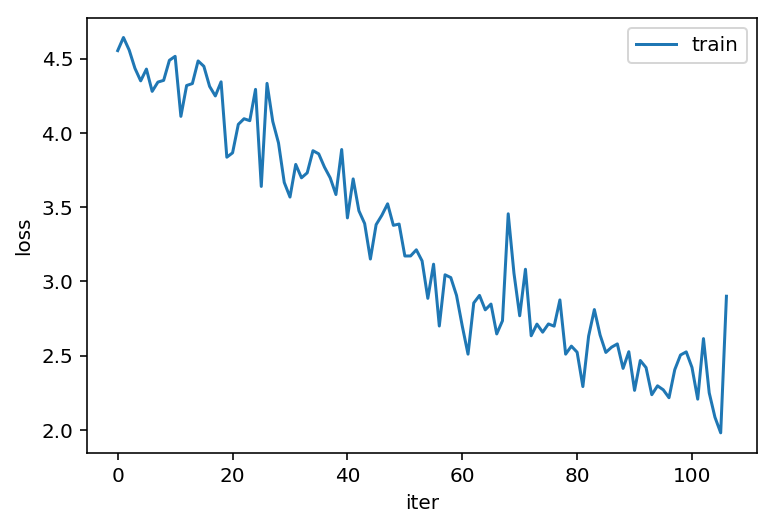

107
Epoch: 107, Iteration: 101000, Loss: 1.8091211318969727
Epoch: 107, Iteration: 101100, Loss: 1.741457223892212
Epoch: 107, Iteration: 101200, Loss: 2.4496779441833496
Epoch: 107, Iteration: 101300, Loss: 1.834128737449646
Epoch: 107, Iteration: 101400, Loss: 2.3294425010681152
Epoch: 107, Iteration: 101500, Loss: 2.2088000774383545
Epoch: 107, Iteration: 101600, Loss: 2.58610200881958
Epoch: 107, Iteration: 101700, Loss: 2.2906293869018555
Epoch: 107, Iteration: 101800, Loss: 2.3423614501953125


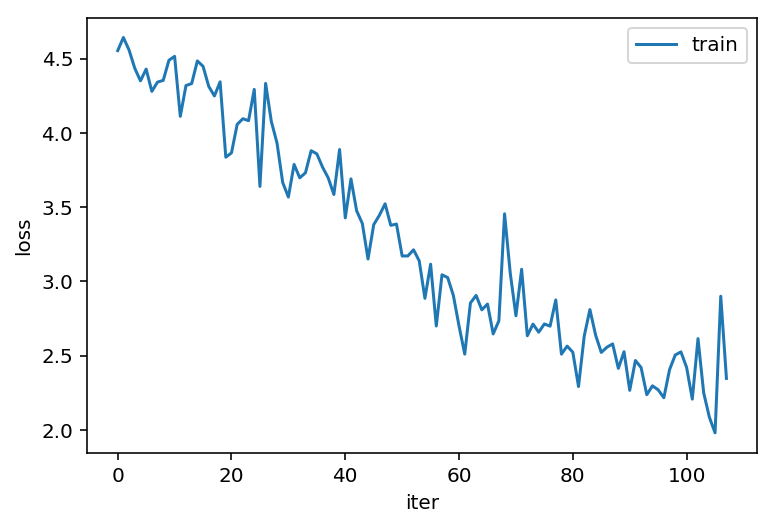

108
Epoch: 108, Iteration: 101900, Loss: 2.310577630996704
Epoch: 108, Iteration: 102000, Loss: 1.9335323572158813
Epoch: 108, Iteration: 102100, Loss: 2.5680129528045654
Epoch: 108, Iteration: 102200, Loss: 2.0150339603424072
Epoch: 108, Iteration: 102300, Loss: 2.2849326133728027
Epoch: 108, Iteration: 102400, Loss: 2.0387072563171387
Epoch: 108, Iteration: 102500, Loss: 2.2956717014312744
Epoch: 108, Iteration: 102600, Loss: 2.4335038661956787
Epoch: 108, Iteration: 102700, Loss: 2.2462282180786133


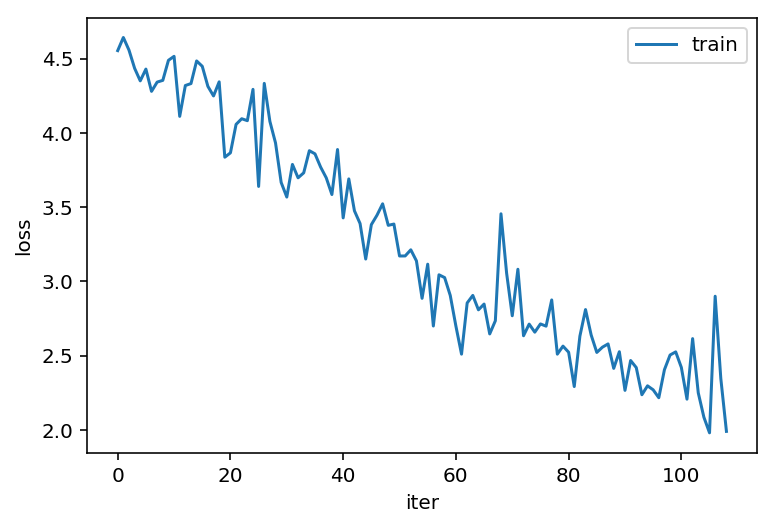

109
Epoch: 109, Iteration: 102800, Loss: 1.7351789474487305
Epoch: 109, Iteration: 102900, Loss: 2.0001161098480225
Epoch: 109, Iteration: 103000, Loss: 2.070726156234741
Epoch: 109, Iteration: 103100, Loss: 1.805328607559204
Epoch: 109, Iteration: 103200, Loss: 2.069943428039551
Epoch: 109, Iteration: 103300, Loss: 1.7492897510528564
Epoch: 109, Iteration: 103400, Loss: 2.1593759059906006
Epoch: 109, Iteration: 103500, Loss: 2.159578561782837
Epoch: 109, Iteration: 103600, Loss: 2.9320566654205322
Epoch: 109, Iteration: 103700, Loss: 1.8745605945587158


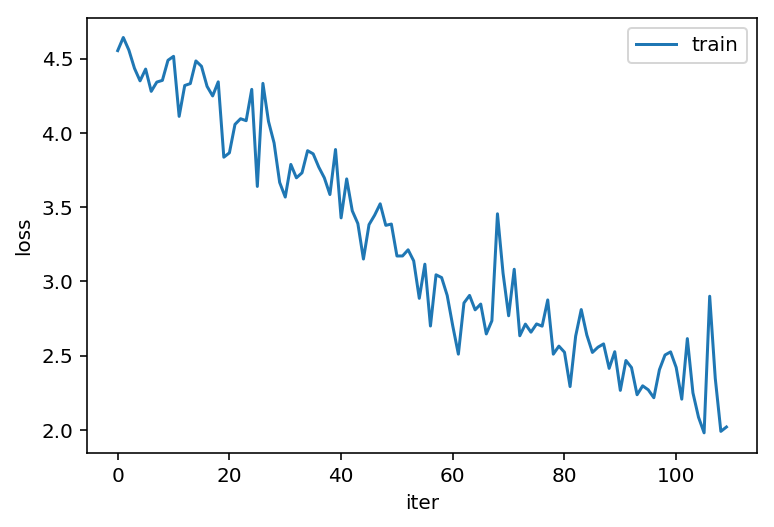

110
Epoch: 110, Iteration: 103800, Loss: 1.795262098312378
Epoch: 110, Iteration: 103900, Loss: 2.289187431335449
Epoch: 110, Iteration: 104000, Loss: 1.83555006980896
Epoch: 110, Iteration: 104100, Loss: 2.4474687576293945
Epoch: 110, Iteration: 104200, Loss: 1.6796705722808838
Epoch: 110, Iteration: 104300, Loss: 2.3295140266418457
Epoch: 110, Iteration: 104400, Loss: 2.4229941368103027
Epoch: 110, Iteration: 104500, Loss: 2.120239496231079
Epoch: 110, Iteration: 104600, Loss: 2.30863618850708


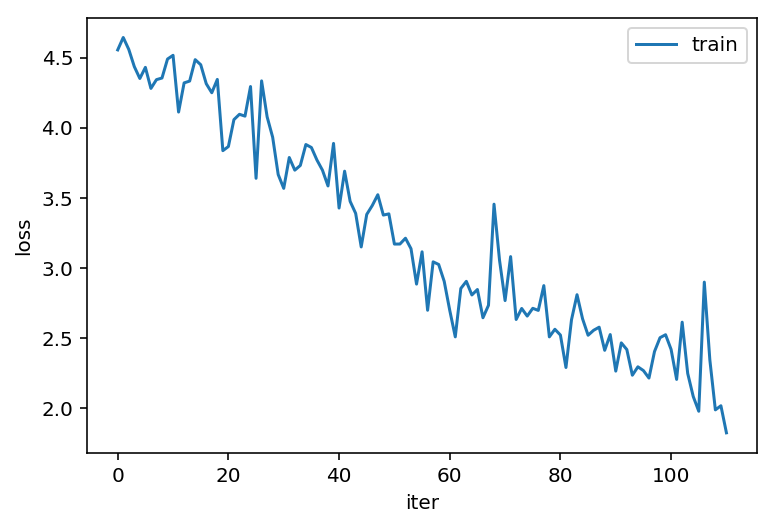

111
Epoch: 111, Iteration: 104700, Loss: 1.8827933073043823
Epoch: 111, Iteration: 104800, Loss: 2.333360195159912
Epoch: 111, Iteration: 104900, Loss: 2.3181731700897217
Epoch: 111, Iteration: 105000, Loss: 2.579890489578247
Epoch: 111, Iteration: 105100, Loss: 2.3797693252563477
Epoch: 111, Iteration: 105200, Loss: 2.3335671424865723
Epoch: 111, Iteration: 105300, Loss: 1.9984911680221558
Epoch: 111, Iteration: 105400, Loss: 2.0087108612060547
Epoch: 111, Iteration: 105500, Loss: 2.040391206741333
Epoch: 111, Iteration: 105600, Loss: 2.348400115966797


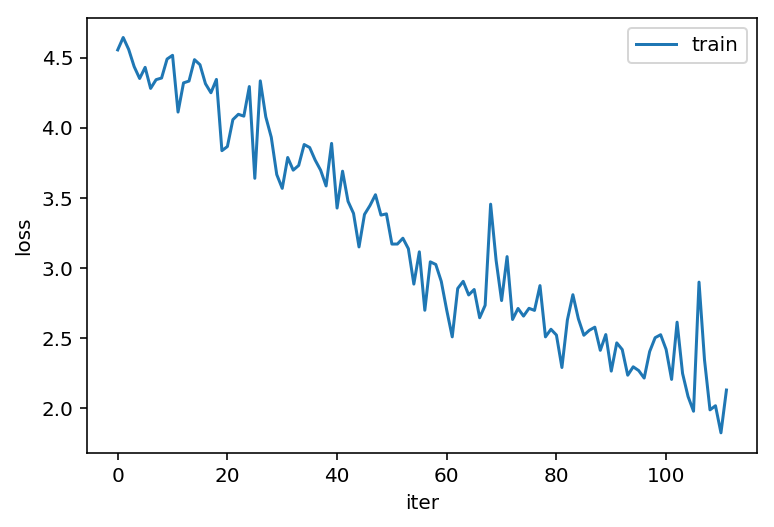

112
Epoch: 112, Iteration: 105700, Loss: 1.6593265533447266
Epoch: 112, Iteration: 105800, Loss: 2.036557197570801
Epoch: 112, Iteration: 105900, Loss: 1.7459945678710938
Epoch: 112, Iteration: 106000, Loss: 1.9396308660507202
Epoch: 112, Iteration: 106100, Loss: 2.132075071334839
Epoch: 112, Iteration: 106200, Loss: 2.1035308837890625
Epoch: 112, Iteration: 106300, Loss: 2.0236706733703613
Epoch: 112, Iteration: 106400, Loss: 2.1811933517456055
Epoch: 112, Iteration: 106500, Loss: 1.8699487447738647


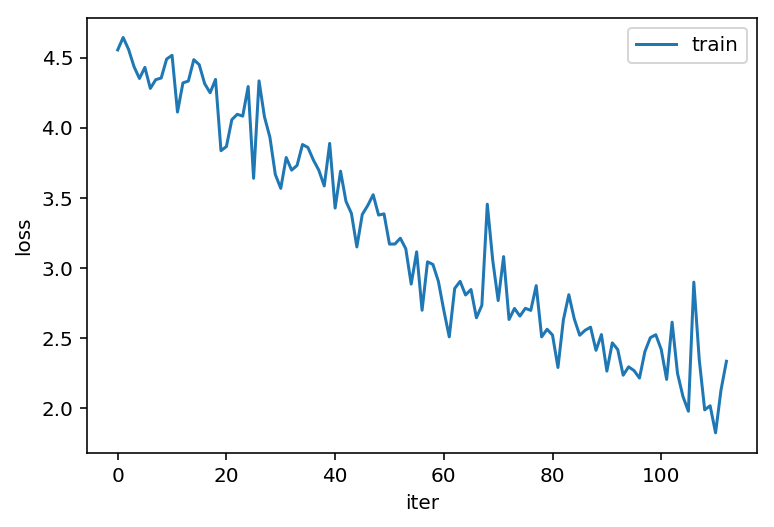

113
Epoch: 113, Iteration: 106600, Loss: 1.4605308771133423
Epoch: 113, Iteration: 106700, Loss: 1.671015739440918
Epoch: 113, Iteration: 106800, Loss: 2.1065566539764404
Epoch: 113, Iteration: 106900, Loss: 2.2514238357543945
Epoch: 113, Iteration: 107000, Loss: 2.187713146209717
Epoch: 113, Iteration: 107100, Loss: 1.9170759916305542
Epoch: 113, Iteration: 107200, Loss: 2.1851115226745605
Epoch: 113, Iteration: 107300, Loss: 2.3562943935394287
Epoch: 113, Iteration: 107400, Loss: 1.9795572757720947
Epoch: 113, Iteration: 107500, Loss: 2.2397897243499756


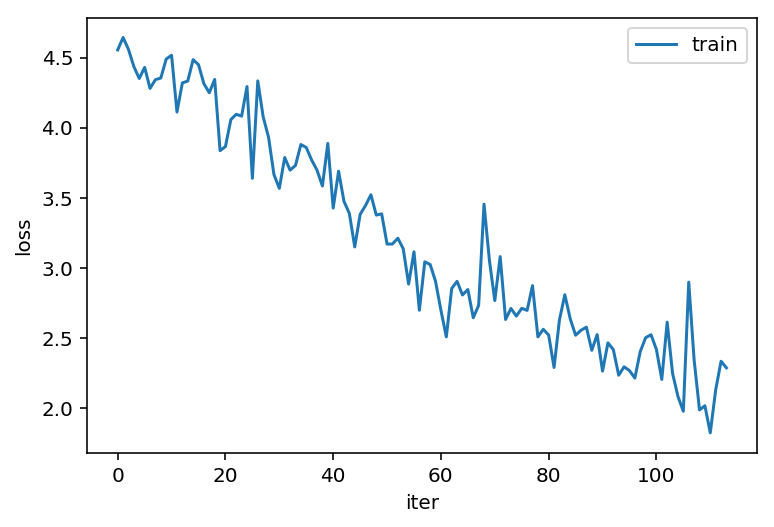

114
Epoch: 114, Iteration: 107600, Loss: 2.147242546081543
Epoch: 114, Iteration: 107700, Loss: 2.1657092571258545
Epoch: 114, Iteration: 107800, Loss: 2.068976640701294
Epoch: 114, Iteration: 107900, Loss: 2.291032552719116
Epoch: 114, Iteration: 108000, Loss: 2.1144931316375732
Epoch: 114, Iteration: 108100, Loss: 2.5092697143554688
Epoch: 114, Iteration: 108200, Loss: 2.1562607288360596
Epoch: 114, Iteration: 108300, Loss: 2.0295000076293945
Epoch: 114, Iteration: 108400, Loss: 2.4086861610412598


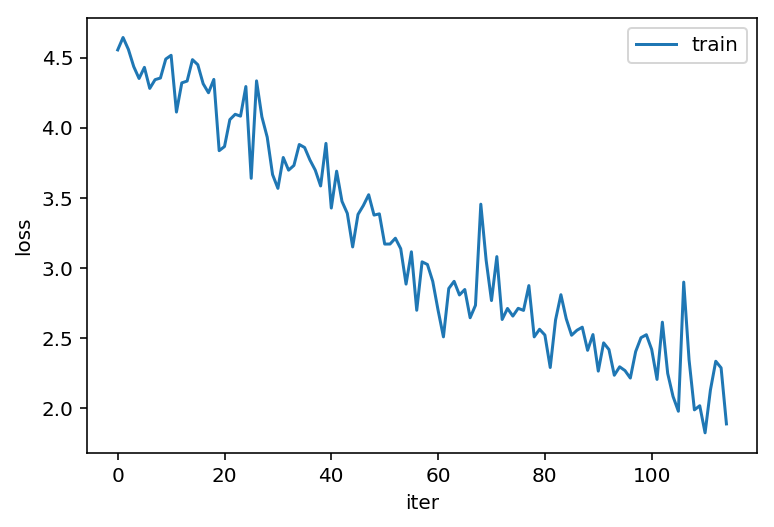

115
Epoch: 115, Iteration: 108500, Loss: 2.170835018157959
Epoch: 115, Iteration: 108600, Loss: 2.2699244022369385
Epoch: 115, Iteration: 108700, Loss: 2.0489866733551025
Epoch: 115, Iteration: 108800, Loss: 2.1442372798919678
Epoch: 115, Iteration: 108900, Loss: 1.8541626930236816
Epoch: 115, Iteration: 109000, Loss: 2.5085959434509277
Epoch: 115, Iteration: 109100, Loss: 2.048332929611206
Epoch: 115, Iteration: 109200, Loss: 2.266016721725464
Epoch: 115, Iteration: 109300, Loss: 2.640836715698242


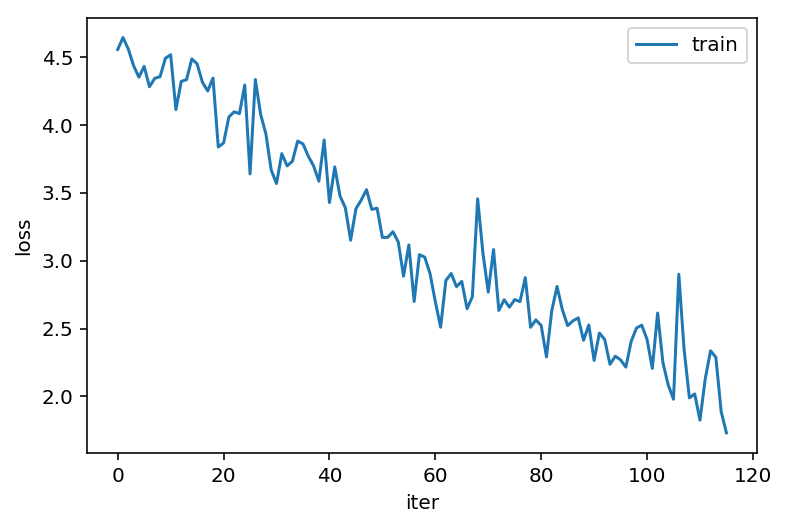

116
Epoch: 116, Iteration: 109400, Loss: 2.319938898086548
Epoch: 116, Iteration: 109500, Loss: 2.286963939666748
Epoch: 116, Iteration: 109600, Loss: 1.9287620782852173
Epoch: 116, Iteration: 109700, Loss: 2.9248709678649902
Epoch: 116, Iteration: 109800, Loss: 2.0408151149749756
Epoch: 116, Iteration: 109900, Loss: 2.12298846244812
Epoch: 116, Iteration: 110000, Loss: 2.1351377964019775
Epoch: 116, Iteration: 110100, Loss: 1.5646939277648926
Epoch: 116, Iteration: 110200, Loss: 2.090827226638794
Epoch: 116, Iteration: 110300, Loss: 2.265366554260254


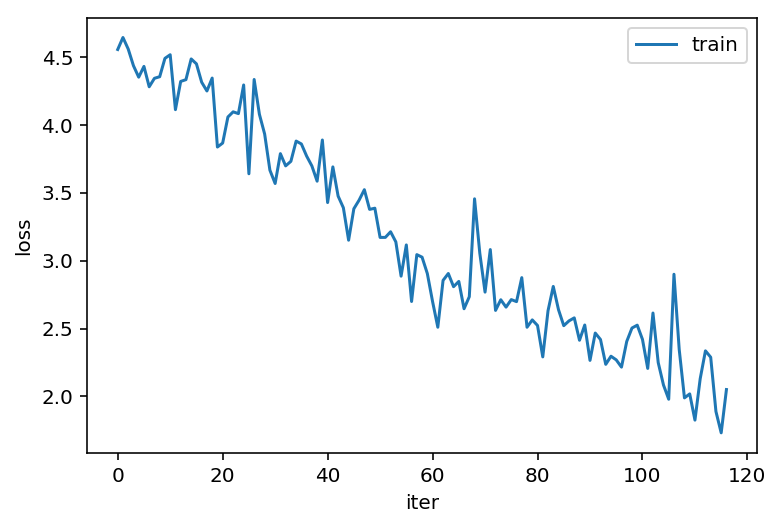

117
Epoch: 117, Iteration: 110400, Loss: 2.02833890914917
Epoch: 117, Iteration: 110500, Loss: 2.0247011184692383
Epoch: 117, Iteration: 110600, Loss: 2.3739349842071533
Epoch: 117, Iteration: 110700, Loss: 2.0301785469055176
Epoch: 117, Iteration: 110800, Loss: 1.8998900651931763
Epoch: 117, Iteration: 110900, Loss: 2.0969882011413574
Epoch: 117, Iteration: 111000, Loss: 2.1637041568756104
Epoch: 117, Iteration: 111100, Loss: 1.8834843635559082
Epoch: 117, Iteration: 111200, Loss: 2.1200363636016846


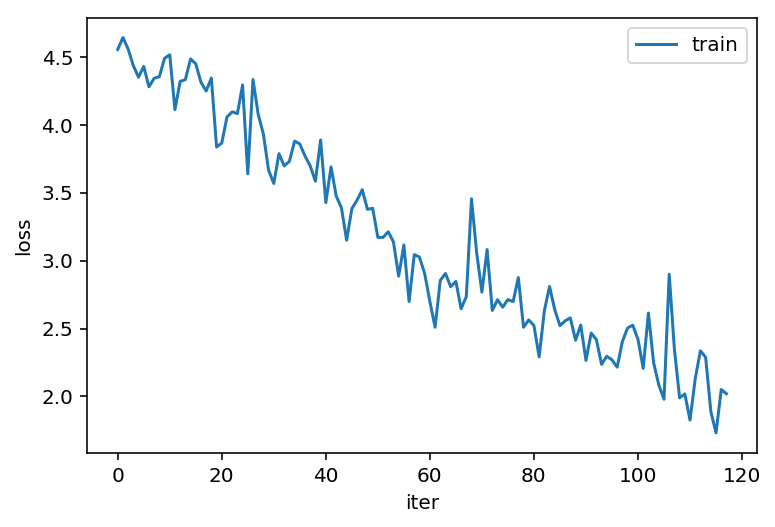

118
Epoch: 118, Iteration: 111300, Loss: 1.912546992301941
Epoch: 118, Iteration: 111400, Loss: 1.917271375656128
Epoch: 118, Iteration: 111500, Loss: 1.992917537689209
Epoch: 118, Iteration: 111600, Loss: 2.0338692665100098
Epoch: 118, Iteration: 111700, Loss: 2.2993760108947754
Epoch: 118, Iteration: 111800, Loss: 2.222571849822998
Epoch: 118, Iteration: 111900, Loss: 2.029543161392212
Epoch: 118, Iteration: 112000, Loss: 2.4655373096466064
Epoch: 118, Iteration: 112100, Loss: 1.9409425258636475
Epoch: 118, Iteration: 112200, Loss: 2.0096426010131836


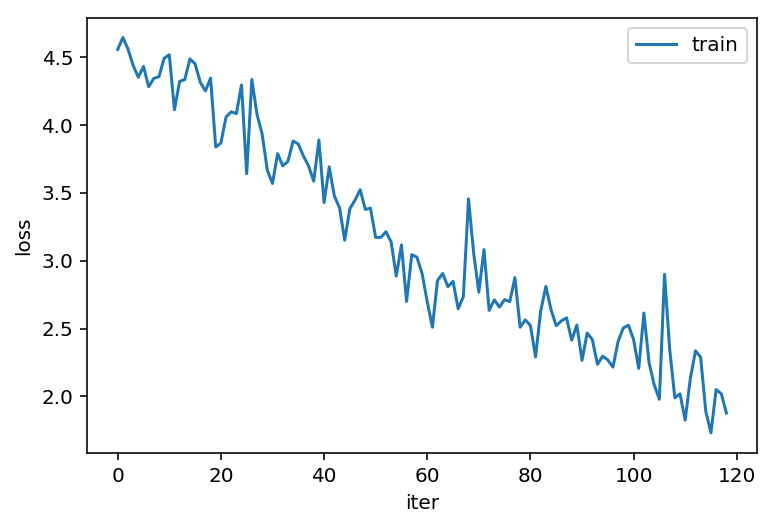

119
Epoch: 119, Iteration: 112300, Loss: 1.7256330251693726
Epoch: 119, Iteration: 112400, Loss: 1.9666533470153809
Epoch: 119, Iteration: 112500, Loss: 1.691572666168213
Epoch: 119, Iteration: 112600, Loss: 2.1072065830230713
Epoch: 119, Iteration: 112700, Loss: 1.515905737876892
Epoch: 119, Iteration: 112800, Loss: 2.1260342597961426
Epoch: 119, Iteration: 112900, Loss: 1.9686987400054932
Epoch: 119, Iteration: 113000, Loss: 1.7642285823822021
Epoch: 119, Iteration: 113100, Loss: 2.1902313232421875


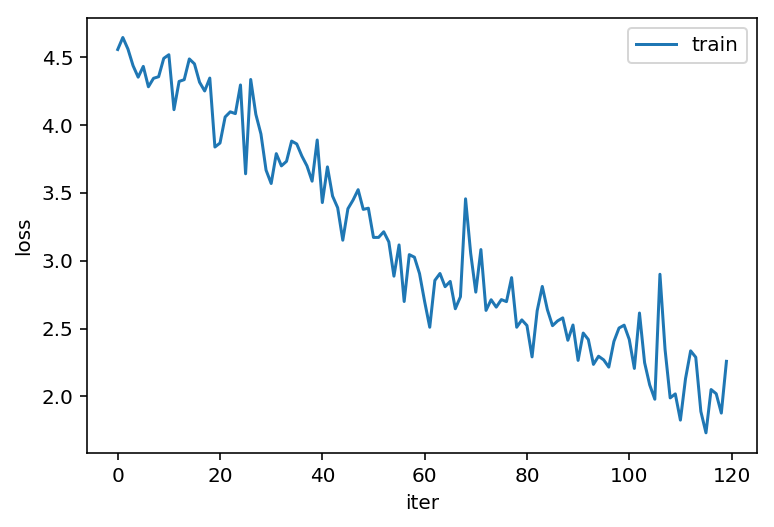

120
Epoch: 120, Iteration: 113200, Loss: 2.4932525157928467
Epoch: 120, Iteration: 113300, Loss: 2.1579971313476562
Epoch: 120, Iteration: 113400, Loss: 2.3808252811431885
Epoch: 120, Iteration: 113500, Loss: 2.125880002975464
Epoch: 120, Iteration: 113600, Loss: 1.9808012247085571
Epoch: 120, Iteration: 113700, Loss: 2.0767385959625244
Epoch: 120, Iteration: 113800, Loss: 2.36391019821167
Epoch: 120, Iteration: 113900, Loss: 1.9803738594055176
Epoch: 120, Iteration: 114000, Loss: 1.8659493923187256
Epoch: 120, Iteration: 114100, Loss: 2.4152135848999023


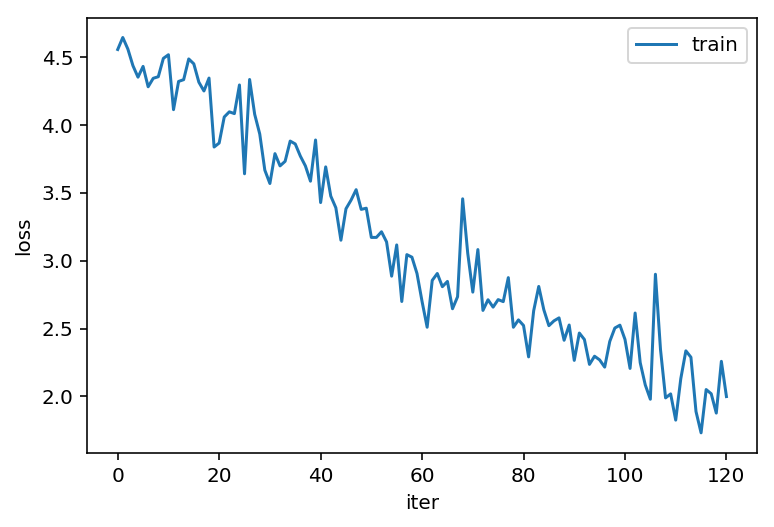

121
Epoch: 121, Iteration: 114200, Loss: 1.7503812313079834
Epoch: 121, Iteration: 114300, Loss: 2.008885383605957
Epoch: 121, Iteration: 114400, Loss: 1.7550249099731445
Epoch: 121, Iteration: 114500, Loss: 2.2313849925994873
Epoch: 121, Iteration: 114600, Loss: 2.000883102416992
Epoch: 121, Iteration: 114700, Loss: 1.9473546743392944
Epoch: 121, Iteration: 114800, Loss: 1.697435736656189
Epoch: 121, Iteration: 114900, Loss: 2.0363070964813232
Epoch: 121, Iteration: 115000, Loss: 2.166581392288208


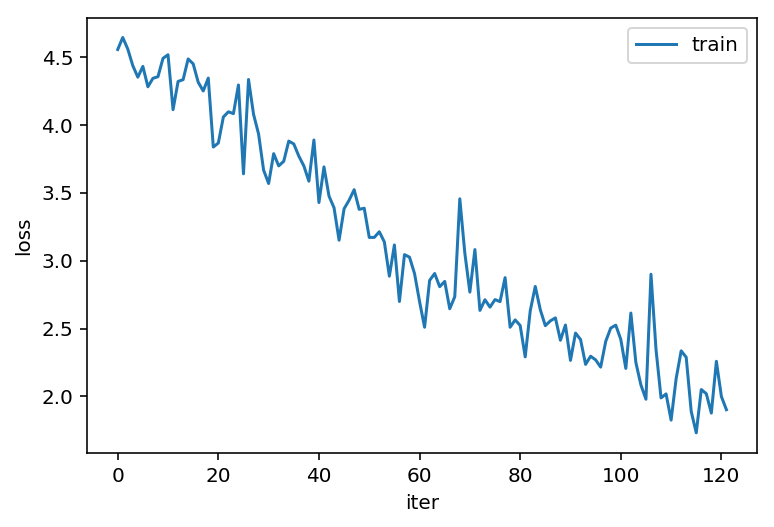

122
Epoch: 122, Iteration: 115100, Loss: 2.210968494415283
Epoch: 122, Iteration: 115200, Loss: 1.9615947008132935
Epoch: 122, Iteration: 115300, Loss: 2.2978949546813965
Epoch: 122, Iteration: 115400, Loss: 1.8518543243408203
Epoch: 122, Iteration: 115500, Loss: 2.1277401447296143
Epoch: 122, Iteration: 115600, Loss: 2.1853275299072266
Epoch: 122, Iteration: 115700, Loss: 1.937533974647522
Epoch: 122, Iteration: 115800, Loss: 1.571862816810608
Epoch: 122, Iteration: 115900, Loss: 2.2940452098846436


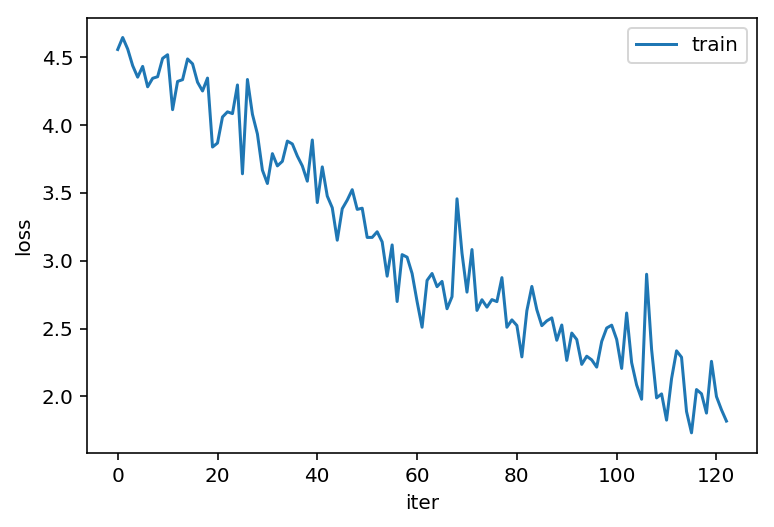

123
Epoch: 123, Iteration: 116000, Loss: 1.8161301612854004
Epoch: 123, Iteration: 116100, Loss: 1.3412941694259644
Epoch: 123, Iteration: 116200, Loss: 1.7284462451934814
Epoch: 123, Iteration: 116300, Loss: 1.9798353910446167
Epoch: 123, Iteration: 116400, Loss: 2.0352625846862793
Epoch: 123, Iteration: 116500, Loss: 2.0048434734344482
Epoch: 123, Iteration: 116600, Loss: 2.2498350143432617
Epoch: 123, Iteration: 116700, Loss: 1.8496077060699463
Epoch: 123, Iteration: 116800, Loss: 1.7931426763534546
Epoch: 123, Iteration: 116900, Loss: 2.624192237854004


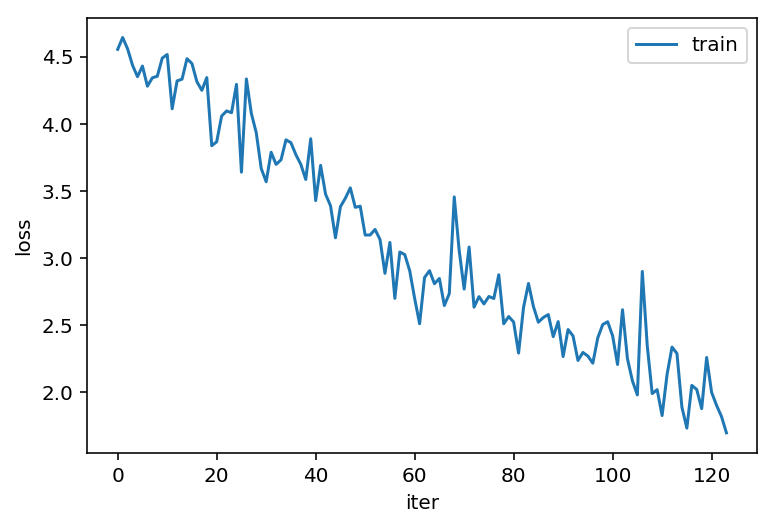

124
Epoch: 124, Iteration: 117000, Loss: 1.811530590057373
Epoch: 124, Iteration: 117100, Loss: 2.0986618995666504
Epoch: 124, Iteration: 117200, Loss: 1.910831093788147
Epoch: 124, Iteration: 117300, Loss: 1.8560878038406372
Epoch: 124, Iteration: 117400, Loss: 1.7527174949645996
Epoch: 124, Iteration: 117500, Loss: 2.220351457595825
Epoch: 124, Iteration: 117600, Loss: 1.8726381063461304
Epoch: 124, Iteration: 117700, Loss: 2.365466833114624
Epoch: 124, Iteration: 117800, Loss: 2.052145481109619


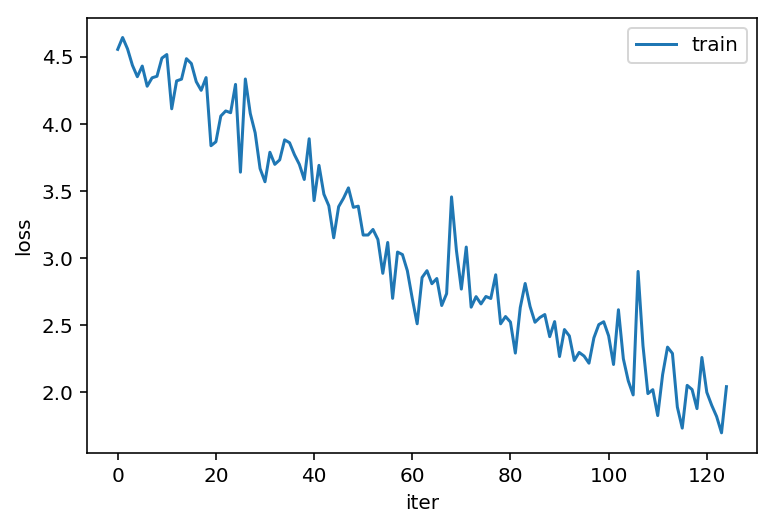

125
Epoch: 125, Iteration: 117900, Loss: 2.041693925857544
Epoch: 125, Iteration: 118000, Loss: 1.8108971118927002
Epoch: 125, Iteration: 118100, Loss: 1.6122459173202515
Epoch: 125, Iteration: 118200, Loss: 1.7155261039733887
Epoch: 125, Iteration: 118300, Loss: 2.1085946559906006
Epoch: 125, Iteration: 118400, Loss: 1.834633708000183
Epoch: 125, Iteration: 118500, Loss: 1.6876235008239746
Epoch: 125, Iteration: 118600, Loss: 2.0669503211975098
Epoch: 125, Iteration: 118700, Loss: 2.6870083808898926
Epoch: 125, Iteration: 118800, Loss: 2.00419282913208


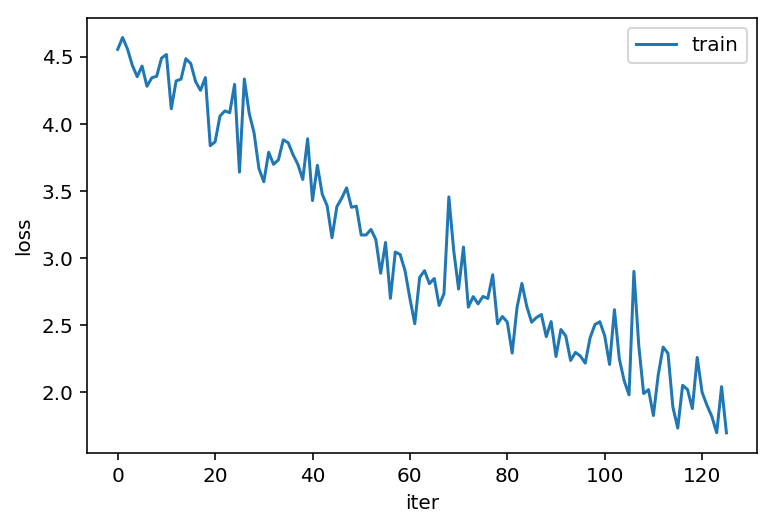

126
Epoch: 126, Iteration: 118900, Loss: 2.313051462173462
Epoch: 126, Iteration: 119000, Loss: 1.9604474306106567
Epoch: 126, Iteration: 119100, Loss: 1.6001964807510376
Epoch: 126, Iteration: 119200, Loss: 2.3134593963623047
Epoch: 126, Iteration: 119300, Loss: 2.076136827468872
Epoch: 126, Iteration: 119400, Loss: 2.186387538909912
Epoch: 126, Iteration: 119500, Loss: 1.734480381011963
Epoch: 126, Iteration: 119600, Loss: 1.8313390016555786
Epoch: 126, Iteration: 119700, Loss: 1.885033130645752


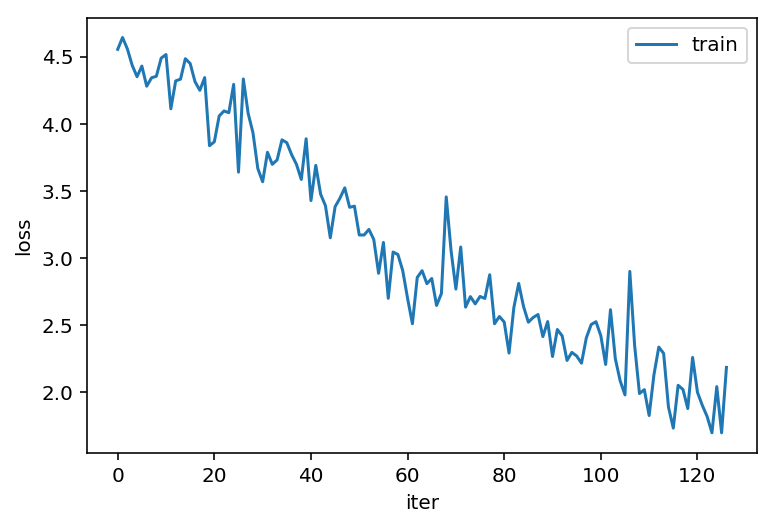

127
Epoch: 127, Iteration: 119800, Loss: 2.1507763862609863
Epoch: 127, Iteration: 119900, Loss: 1.896814227104187
Epoch: 127, Iteration: 120000, Loss: 1.872597575187683
Epoch: 127, Iteration: 120100, Loss: 2.075000524520874
Epoch: 127, Iteration: 120200, Loss: 2.1170239448547363
Epoch: 127, Iteration: 120300, Loss: 2.159358263015747
Epoch: 127, Iteration: 120400, Loss: 2.313117742538452
Epoch: 127, Iteration: 120500, Loss: 1.5644805431365967
Epoch: 127, Iteration: 120600, Loss: 1.7200074195861816
Epoch: 127, Iteration: 120700, Loss: 1.847257137298584


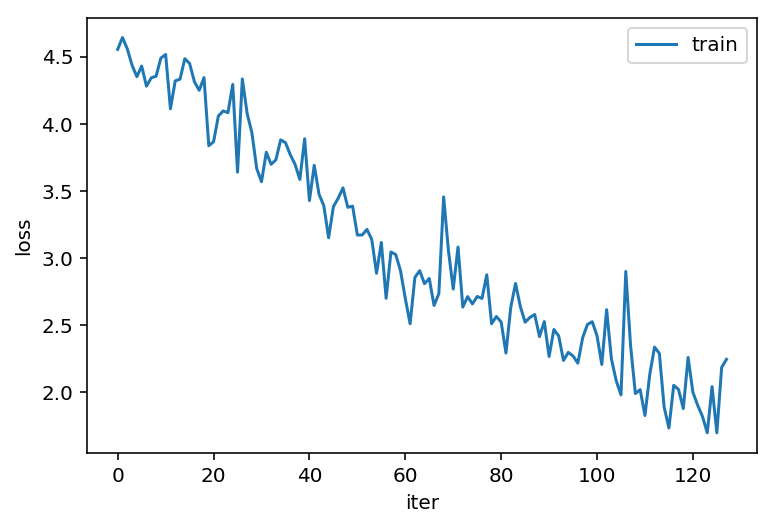

128
Epoch: 128, Iteration: 120800, Loss: 2.1620700359344482
Epoch: 128, Iteration: 120900, Loss: 1.8675495386123657
Epoch: 128, Iteration: 121000, Loss: 1.8225663900375366
Epoch: 128, Iteration: 121100, Loss: 2.0058767795562744
Epoch: 128, Iteration: 121200, Loss: 1.6763648986816406
Epoch: 128, Iteration: 121300, Loss: 2.4321253299713135
Epoch: 128, Iteration: 121400, Loss: 1.6892526149749756
Epoch: 128, Iteration: 121500, Loss: 1.92439866065979
Epoch: 128, Iteration: 121600, Loss: 1.871179223060608


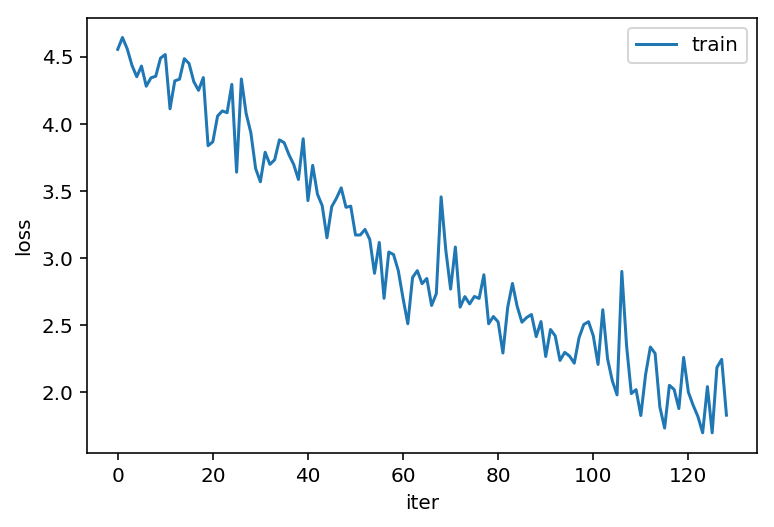

129
Epoch: 129, Iteration: 121700, Loss: 2.229870319366455
Epoch: 129, Iteration: 121800, Loss: 1.632763147354126
Epoch: 129, Iteration: 121900, Loss: 2.026599407196045
Epoch: 129, Iteration: 122000, Loss: 1.8204463720321655
Epoch: 129, Iteration: 122100, Loss: 1.8870248794555664
Epoch: 129, Iteration: 122200, Loss: 2.1834189891815186
Epoch: 129, Iteration: 122300, Loss: 1.8504891395568848
Epoch: 129, Iteration: 122400, Loss: 1.800693392753601
Epoch: 129, Iteration: 122500, Loss: 2.1431233882904053


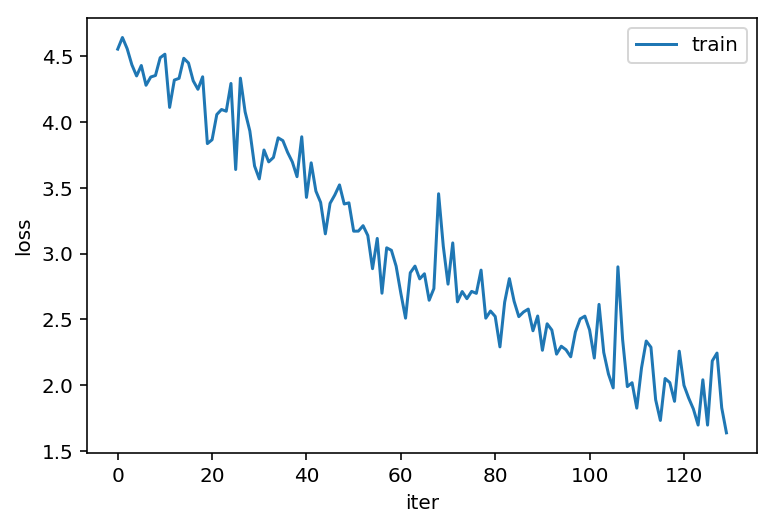

130
Epoch: 130, Iteration: 122600, Loss: 2.0097994804382324
Epoch: 130, Iteration: 122700, Loss: 1.4937949180603027
Epoch: 130, Iteration: 122800, Loss: 2.197263717651367
Epoch: 130, Iteration: 122900, Loss: 1.7640318870544434
Epoch: 130, Iteration: 123000, Loss: 2.10421085357666
Epoch: 130, Iteration: 123100, Loss: 2.021617889404297
Epoch: 130, Iteration: 123200, Loss: 2.3368518352508545
Epoch: 130, Iteration: 123300, Loss: 2.0109243392944336
Epoch: 130, Iteration: 123400, Loss: 1.834511399269104
Epoch: 130, Iteration: 123500, Loss: 1.5527100563049316


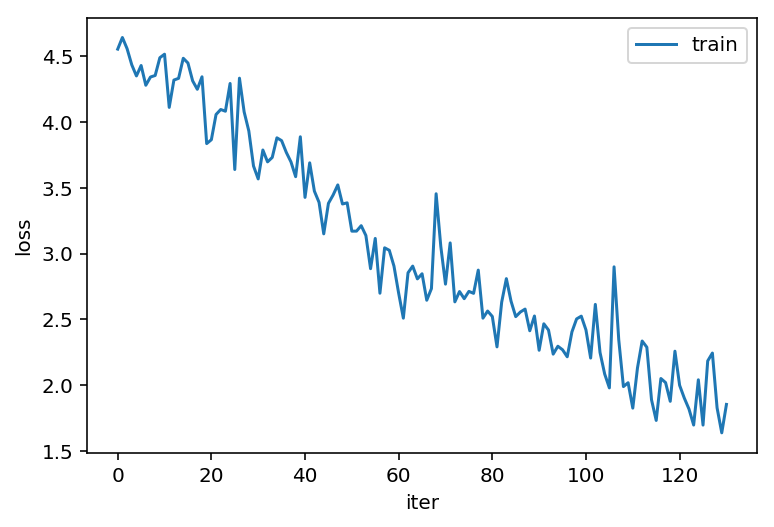

131
Epoch: 131, Iteration: 123600, Loss: 1.9772963523864746
Epoch: 131, Iteration: 123700, Loss: 2.1395699977874756
Epoch: 131, Iteration: 123800, Loss: 2.1107218265533447
Epoch: 131, Iteration: 123900, Loss: 1.6304234266281128
Epoch: 131, Iteration: 124000, Loss: 2.008479356765747
Epoch: 131, Iteration: 124100, Loss: 1.950215458869934
Epoch: 131, Iteration: 124200, Loss: 2.0720722675323486
Epoch: 131, Iteration: 124300, Loss: 1.9965382814407349
Epoch: 131, Iteration: 124400, Loss: 1.689700722694397


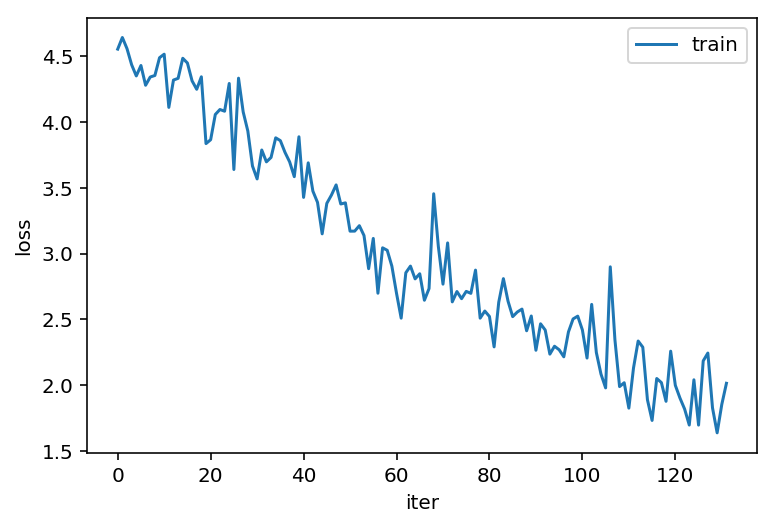

132
Epoch: 132, Iteration: 124500, Loss: 2.4618818759918213
Epoch: 132, Iteration: 124600, Loss: 2.5760841369628906
Epoch: 132, Iteration: 124700, Loss: 2.2146308422088623
Epoch: 132, Iteration: 124800, Loss: 2.03056263923645
Epoch: 132, Iteration: 124900, Loss: 2.0823023319244385
Epoch: 132, Iteration: 125000, Loss: 2.0679359436035156
Epoch: 132, Iteration: 125100, Loss: 2.1058743000030518
Epoch: 132, Iteration: 125200, Loss: 2.3117940425872803
Epoch: 132, Iteration: 125300, Loss: 1.6990481615066528
Epoch: 132, Iteration: 125400, Loss: 1.7249349355697632


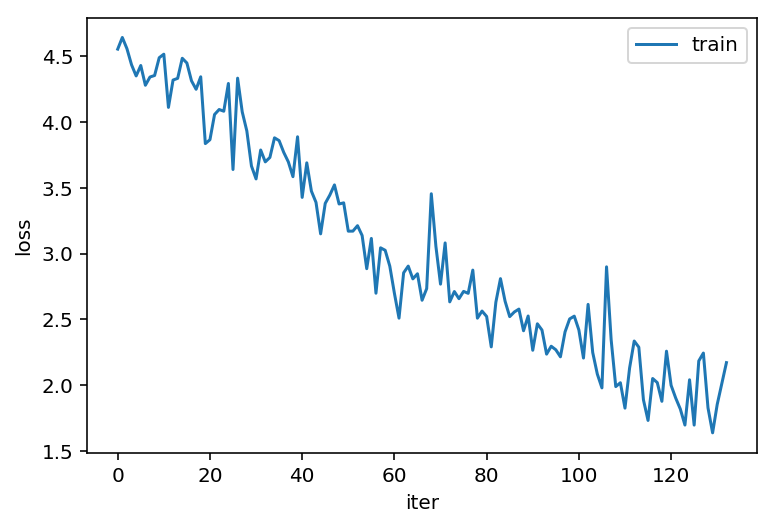

133
Epoch: 133, Iteration: 125500, Loss: 2.205594301223755
Epoch: 133, Iteration: 125600, Loss: 2.1514971256256104
Epoch: 133, Iteration: 125700, Loss: 1.8717342615127563
Epoch: 133, Iteration: 125800, Loss: 1.8990809917449951
Epoch: 133, Iteration: 125900, Loss: 1.8549511432647705
Epoch: 133, Iteration: 126000, Loss: 2.235755681991577
Epoch: 133, Iteration: 126100, Loss: 1.7538119554519653
Epoch: 133, Iteration: 126200, Loss: 1.4214270114898682
Epoch: 133, Iteration: 126300, Loss: 1.7918329238891602


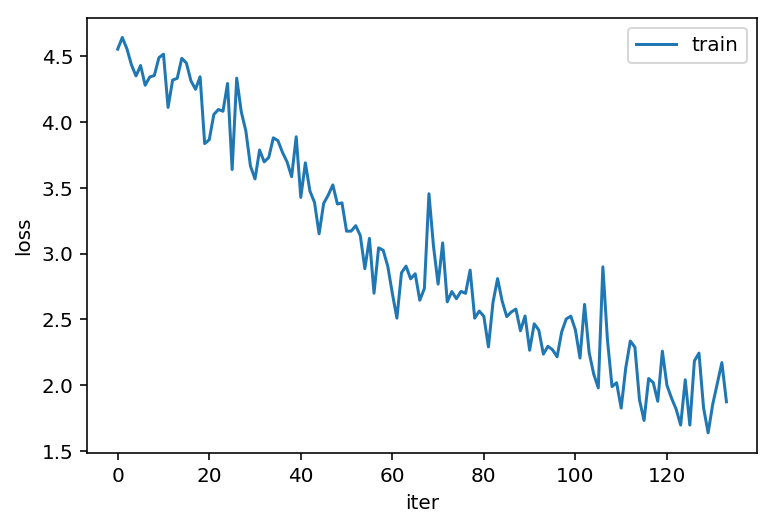

134
Epoch: 134, Iteration: 126400, Loss: 1.714591383934021
Epoch: 134, Iteration: 126500, Loss: 1.8472785949707031
Epoch: 134, Iteration: 126600, Loss: 1.8937736749649048
Epoch: 134, Iteration: 126700, Loss: 1.7170741558074951
Epoch: 134, Iteration: 126800, Loss: 1.9347871541976929
Epoch: 134, Iteration: 126900, Loss: 1.343239426612854
Epoch: 134, Iteration: 127000, Loss: 1.975752353668213
Epoch: 134, Iteration: 127100, Loss: 2.1018877029418945
Epoch: 134, Iteration: 127200, Loss: 2.3627145290374756
Epoch: 134, Iteration: 127300, Loss: 1.9645415544509888


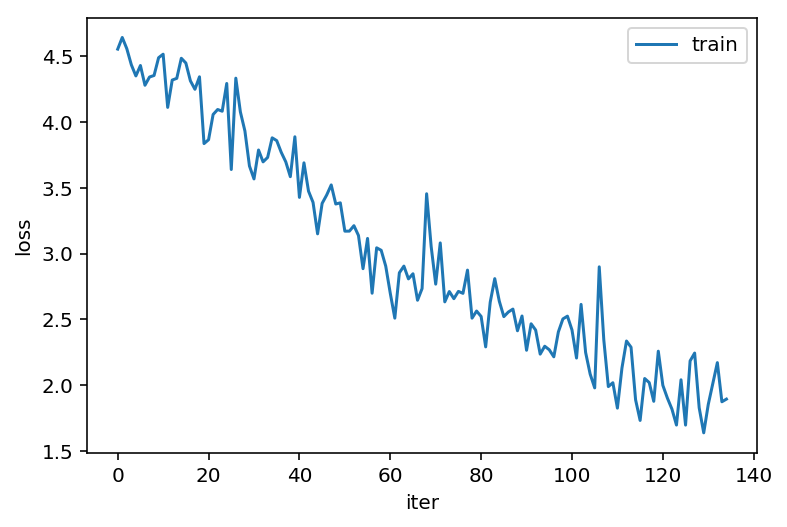

135
Epoch: 135, Iteration: 127400, Loss: 1.5957043170928955
Epoch: 135, Iteration: 127500, Loss: 1.6800613403320312
Epoch: 135, Iteration: 127600, Loss: 1.7102222442626953
Epoch: 135, Iteration: 127700, Loss: 2.0863900184631348
Epoch: 135, Iteration: 127800, Loss: 2.184907913208008
Epoch: 135, Iteration: 127900, Loss: 1.9892663955688477
Epoch: 135, Iteration: 128000, Loss: 1.8185112476348877
Epoch: 135, Iteration: 128100, Loss: 1.452356219291687
Epoch: 135, Iteration: 128200, Loss: 1.8832731246948242


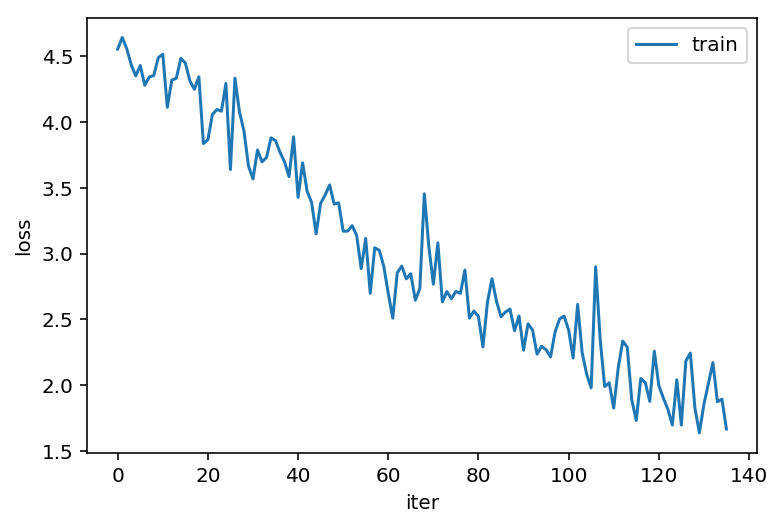

136
Epoch: 136, Iteration: 128300, Loss: 1.885116696357727
Epoch: 136, Iteration: 128400, Loss: 1.8337507247924805
Epoch: 136, Iteration: 128500, Loss: 1.7678661346435547
Epoch: 136, Iteration: 128600, Loss: 2.1913180351257324
Epoch: 136, Iteration: 128700, Loss: 2.1115341186523438
Epoch: 136, Iteration: 128800, Loss: 1.870600700378418
Epoch: 136, Iteration: 128900, Loss: 2.6097497940063477
Epoch: 136, Iteration: 129000, Loss: 1.8655407428741455
Epoch: 136, Iteration: 129100, Loss: 1.5299872159957886


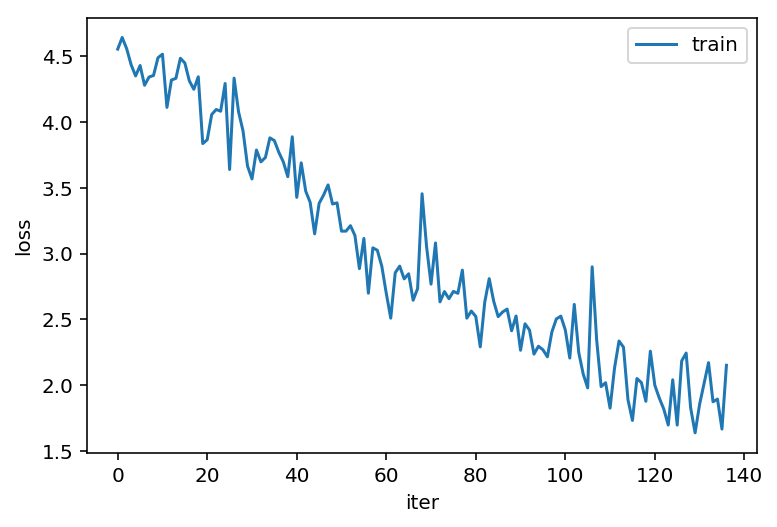

137
Epoch: 137, Iteration: 129200, Loss: 2.6750648021698
Epoch: 137, Iteration: 129300, Loss: 1.8506622314453125
Epoch: 137, Iteration: 129400, Loss: 2.035282611846924
Epoch: 137, Iteration: 129500, Loss: 1.6943271160125732
Epoch: 137, Iteration: 129600, Loss: 1.7749062776565552
Epoch: 137, Iteration: 129700, Loss: 2.0278491973876953
Epoch: 137, Iteration: 129800, Loss: 1.8961880207061768
Epoch: 137, Iteration: 129900, Loss: 1.7811942100524902
Epoch: 137, Iteration: 130000, Loss: 1.4686775207519531
Epoch: 137, Iteration: 130100, Loss: 1.8649835586547852


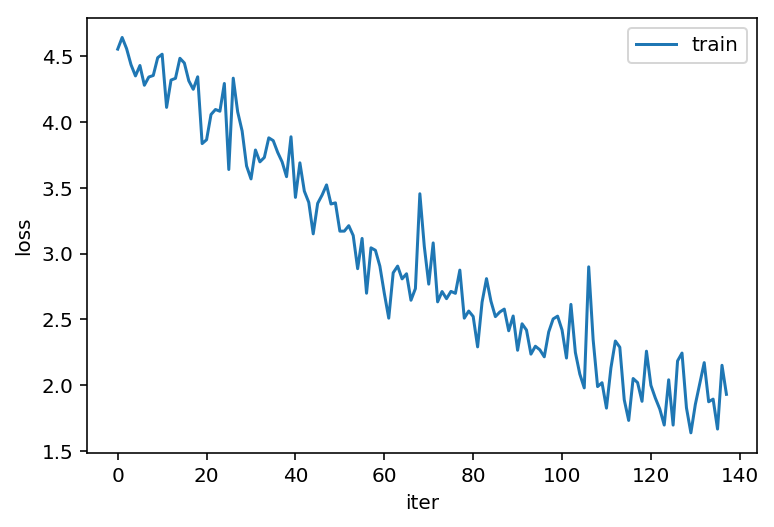

138
Epoch: 138, Iteration: 130200, Loss: 1.7920299768447876
Epoch: 138, Iteration: 130300, Loss: 1.8796640634536743
Epoch: 138, Iteration: 130400, Loss: 2.384727954864502
Epoch: 138, Iteration: 130500, Loss: 1.7428120374679565
Epoch: 138, Iteration: 130600, Loss: 1.9025793075561523
Epoch: 138, Iteration: 130700, Loss: 1.730364203453064
Epoch: 138, Iteration: 130800, Loss: 2.099167823791504
Epoch: 138, Iteration: 130900, Loss: 2.3564341068267822
Epoch: 138, Iteration: 131000, Loss: 1.9289872646331787


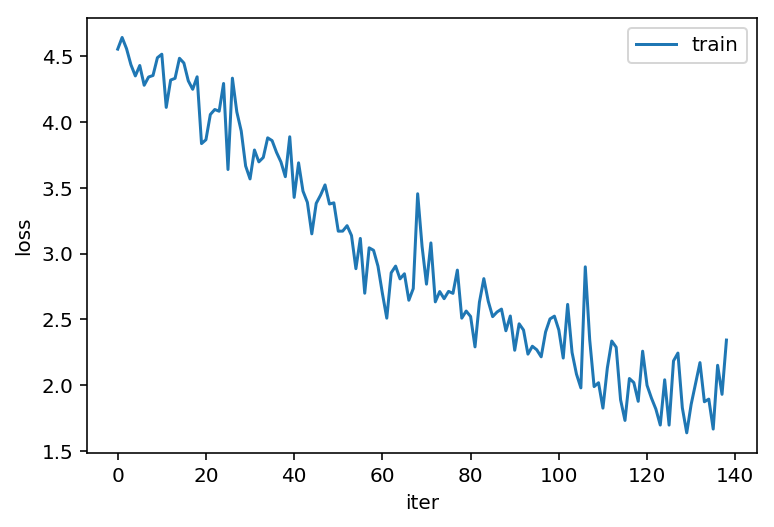

139
Epoch: 139, Iteration: 131100, Loss: 1.6633950471878052
Epoch: 139, Iteration: 131200, Loss: 1.9459478855133057
Epoch: 139, Iteration: 131300, Loss: 1.7737295627593994
Epoch: 139, Iteration: 131400, Loss: 2.3165483474731445
Epoch: 139, Iteration: 131500, Loss: 2.2871193885803223
Epoch: 139, Iteration: 131600, Loss: 1.6947969198226929
Epoch: 139, Iteration: 131700, Loss: 1.5208805799484253
Epoch: 139, Iteration: 131800, Loss: 1.8923932313919067
Epoch: 139, Iteration: 131900, Loss: 2.1536502838134766
Epoch: 139, Iteration: 132000, Loss: 1.8228116035461426


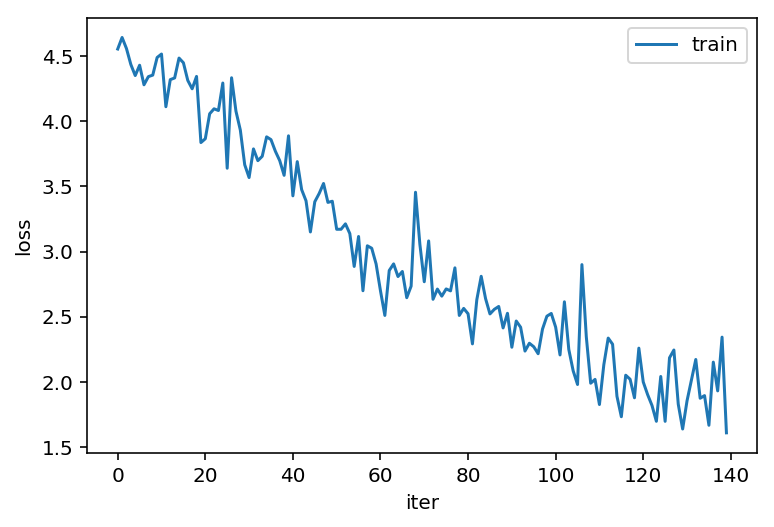

140
Epoch: 140, Iteration: 132100, Loss: 1.9804590940475464
Epoch: 140, Iteration: 132200, Loss: 1.884717583656311
Epoch: 140, Iteration: 132300, Loss: 2.0053253173828125
Epoch: 140, Iteration: 132400, Loss: 2.189565658569336
Epoch: 140, Iteration: 132500, Loss: 1.89975905418396
Epoch: 140, Iteration: 132600, Loss: 2.378343343734741
Epoch: 140, Iteration: 132700, Loss: 1.8685635328292847
Epoch: 140, Iteration: 132800, Loss: 1.721842885017395
Epoch: 140, Iteration: 132900, Loss: 1.9784510135650635


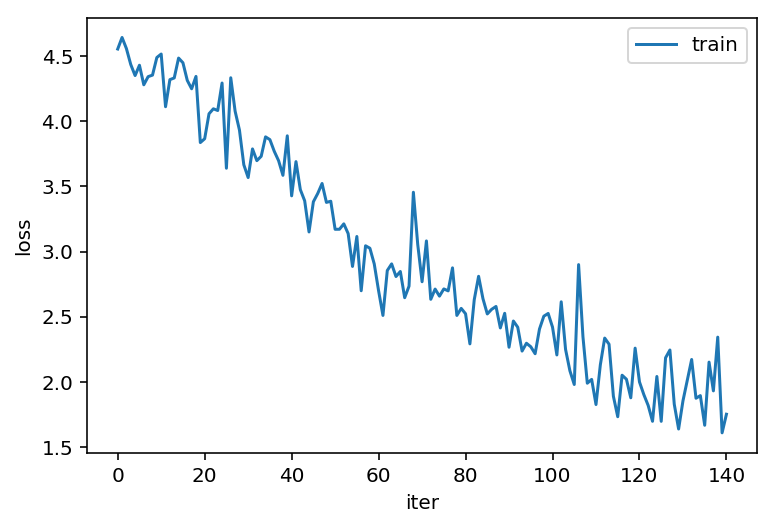

141
Epoch: 141, Iteration: 133000, Loss: 1.8106069564819336
Epoch: 141, Iteration: 133100, Loss: 2.116365909576416
Epoch: 141, Iteration: 133200, Loss: 1.5337345600128174
Epoch: 141, Iteration: 133300, Loss: 1.7935646772384644
Epoch: 141, Iteration: 133400, Loss: 2.10123610496521
Epoch: 141, Iteration: 133500, Loss: 1.7495388984680176
Epoch: 141, Iteration: 133600, Loss: 1.8288812637329102
Epoch: 141, Iteration: 133700, Loss: 1.909383773803711
Epoch: 141, Iteration: 133800, Loss: 1.8851511478424072
Epoch: 141, Iteration: 133900, Loss: 1.8672019243240356


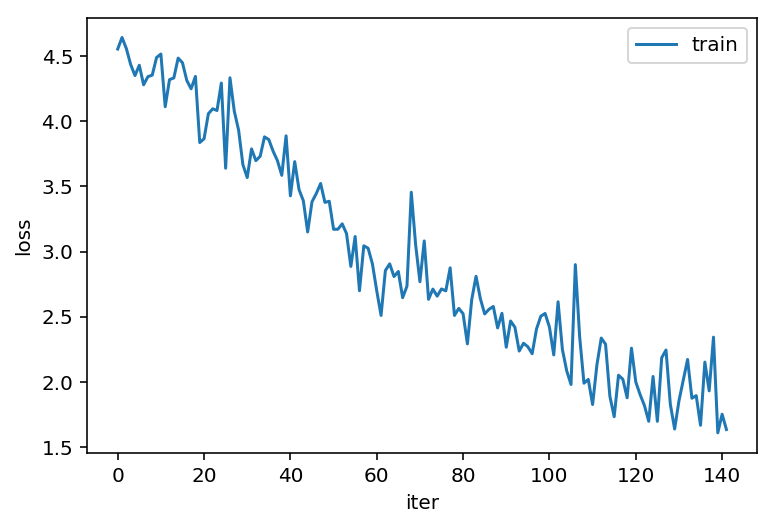

142
Epoch: 142, Iteration: 134000, Loss: 1.6075853109359741
Epoch: 142, Iteration: 134100, Loss: 1.7347735166549683
Epoch: 142, Iteration: 134200, Loss: 1.4604508876800537
Epoch: 142, Iteration: 134300, Loss: 2.226043462753296
Epoch: 142, Iteration: 134400, Loss: 1.8107284307479858
Epoch: 142, Iteration: 134500, Loss: 2.131007194519043
Epoch: 142, Iteration: 134600, Loss: 1.8460183143615723
Epoch: 142, Iteration: 134700, Loss: 1.8706696033477783
Epoch: 142, Iteration: 134800, Loss: 1.6749252080917358


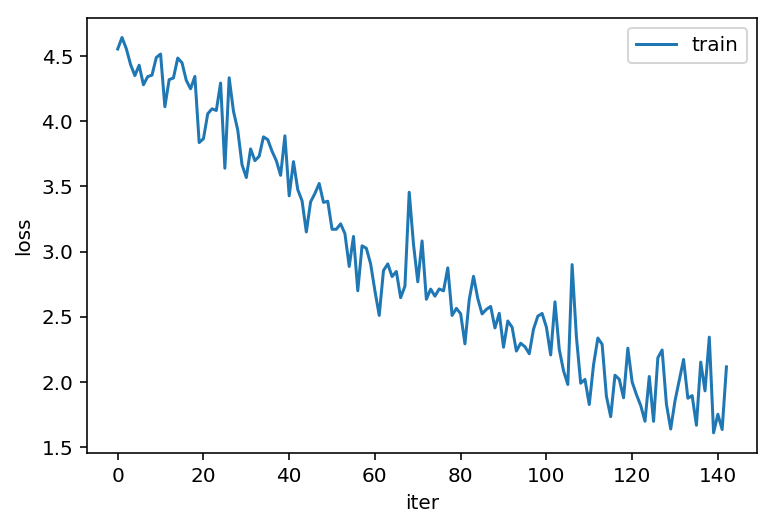

143
Epoch: 143, Iteration: 134900, Loss: 1.7033190727233887
Epoch: 143, Iteration: 135000, Loss: 1.9539222717285156
Epoch: 143, Iteration: 135100, Loss: 1.762109398841858
Epoch: 143, Iteration: 135200, Loss: 1.8243194818496704
Epoch: 143, Iteration: 135300, Loss: 2.2072529792785645
Epoch: 143, Iteration: 135400, Loss: 2.084380626678467
Epoch: 143, Iteration: 135500, Loss: 2.139392137527466
Epoch: 143, Iteration: 135600, Loss: 1.741965651512146
Epoch: 143, Iteration: 135700, Loss: 1.987335443496704


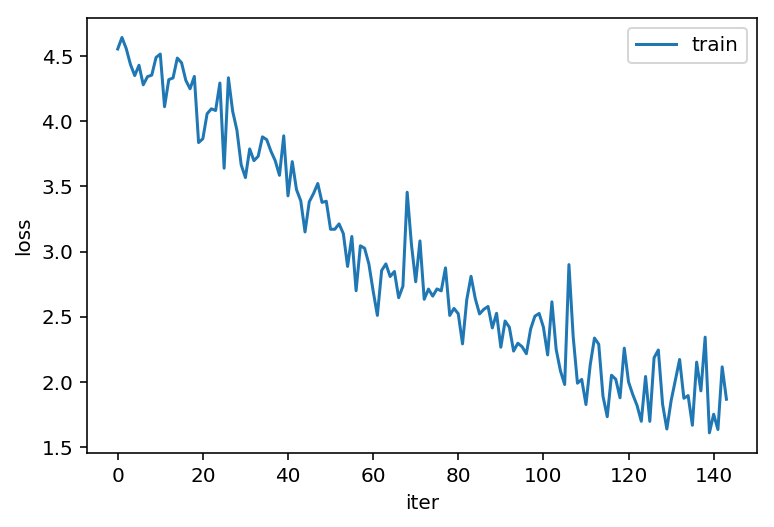

144
Epoch: 144, Iteration: 135800, Loss: 1.7308902740478516
Epoch: 144, Iteration: 135900, Loss: 1.298169732093811
Epoch: 144, Iteration: 136000, Loss: 2.0719189643859863
Epoch: 144, Iteration: 136100, Loss: 1.4963269233703613
Epoch: 144, Iteration: 136200, Loss: 1.984175682067871
Epoch: 144, Iteration: 136300, Loss: 2.2199454307556152
Epoch: 144, Iteration: 136400, Loss: 1.4728362560272217
Epoch: 144, Iteration: 136500, Loss: 2.4906585216522217
Epoch: 144, Iteration: 136600, Loss: 1.719204068183899
Epoch: 144, Iteration: 136700, Loss: 2.0820534229278564


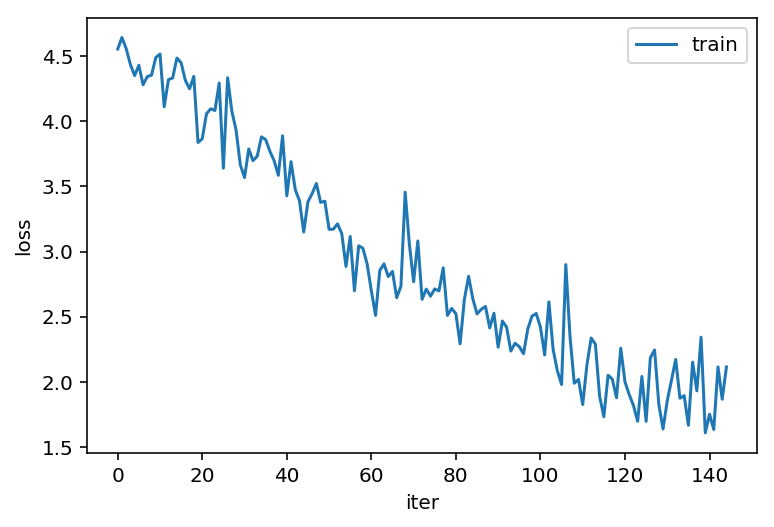

145
Epoch: 145, Iteration: 136800, Loss: 1.804763674736023
Epoch: 145, Iteration: 136900, Loss: 1.5365784168243408
Epoch: 145, Iteration: 137000, Loss: 2.1512458324432373
Epoch: 145, Iteration: 137100, Loss: 2.341958999633789
Epoch: 145, Iteration: 137200, Loss: 1.870477557182312
Epoch: 145, Iteration: 137300, Loss: 1.8838258981704712
Epoch: 145, Iteration: 137400, Loss: 2.076007843017578
Epoch: 145, Iteration: 137500, Loss: 1.9976072311401367
Epoch: 145, Iteration: 137600, Loss: 1.867675542831421


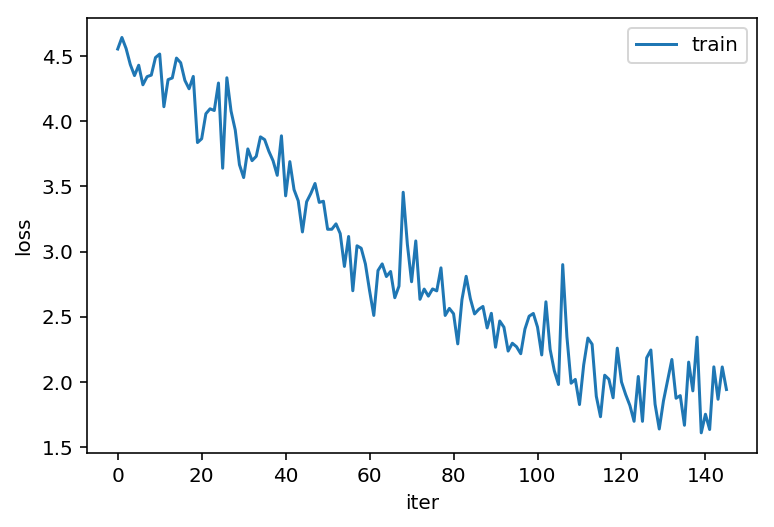

146
Epoch: 146, Iteration: 137700, Loss: 2.042011022567749
Epoch: 146, Iteration: 137800, Loss: 1.7181845903396606
Epoch: 146, Iteration: 137900, Loss: 2.0727860927581787
Epoch: 146, Iteration: 138000, Loss: 1.7122774124145508
Epoch: 146, Iteration: 138100, Loss: 1.4991753101348877
Epoch: 146, Iteration: 138200, Loss: 1.6979882717132568
Epoch: 146, Iteration: 138300, Loss: 1.9023889303207397
Epoch: 146, Iteration: 138400, Loss: 1.6346124410629272
Epoch: 146, Iteration: 138500, Loss: 1.4749027490615845
Epoch: 146, Iteration: 138600, Loss: 1.6301286220550537


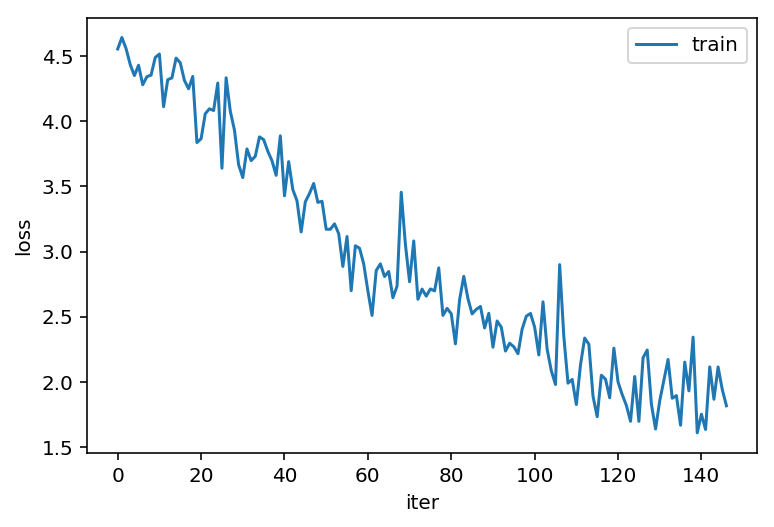

147
Epoch: 147, Iteration: 138700, Loss: 1.6006170511245728
Epoch: 147, Iteration: 138800, Loss: 1.9870985746383667
Epoch: 147, Iteration: 138900, Loss: 1.7873435020446777
Epoch: 147, Iteration: 139000, Loss: 1.8273706436157227
Epoch: 147, Iteration: 139100, Loss: 1.7609671354293823
Epoch: 147, Iteration: 139200, Loss: 1.8600080013275146
Epoch: 147, Iteration: 139300, Loss: 1.7102285623550415
Epoch: 147, Iteration: 139400, Loss: 2.032482147216797
Epoch: 147, Iteration: 139500, Loss: 1.6621935367584229


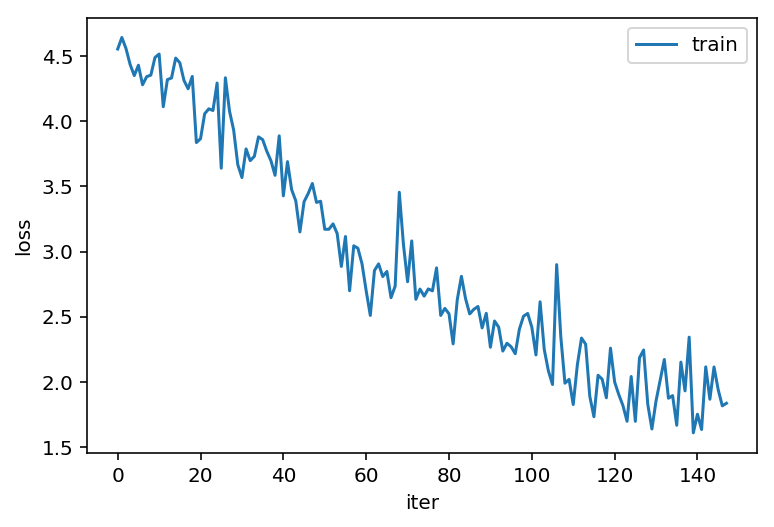

148
Epoch: 148, Iteration: 139600, Loss: 1.6852343082427979
Epoch: 148, Iteration: 139700, Loss: 2.1974897384643555
Epoch: 148, Iteration: 139800, Loss: 1.7476024627685547
Epoch: 148, Iteration: 139900, Loss: 1.81783926486969
Epoch: 148, Iteration: 140000, Loss: 1.8845694065093994
Epoch: 148, Iteration: 140100, Loss: 2.419613838195801
Epoch: 148, Iteration: 140200, Loss: 1.9300284385681152
Epoch: 148, Iteration: 140300, Loss: 2.607563018798828
Epoch: 148, Iteration: 140400, Loss: 1.9162579774856567
Epoch: 148, Iteration: 140500, Loss: 1.91196870803833


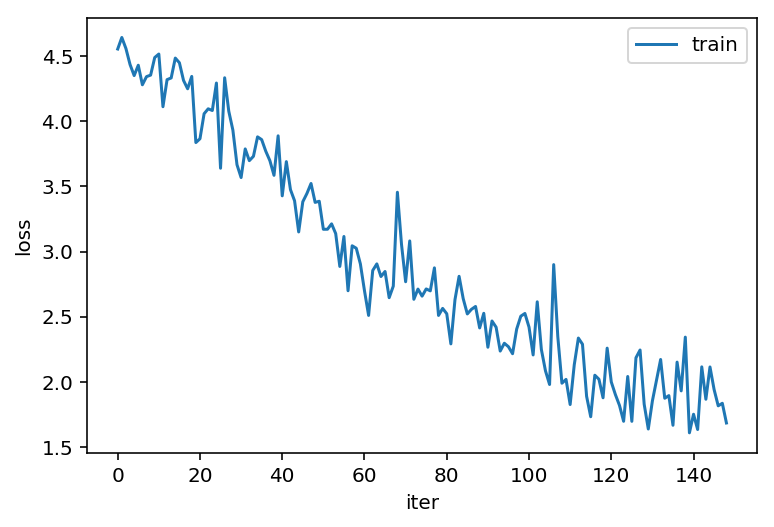

149
Epoch: 149, Iteration: 140600, Loss: 1.412665843963623
Epoch: 149, Iteration: 140700, Loss: 1.5589450597763062
Epoch: 149, Iteration: 140800, Loss: 1.6982635259628296
Epoch: 149, Iteration: 140900, Loss: 1.4925827980041504
Epoch: 149, Iteration: 141000, Loss: 1.8401658535003662
Epoch: 149, Iteration: 141100, Loss: 1.93147873878479
Epoch: 149, Iteration: 141200, Loss: 1.3025602102279663
Epoch: 149, Iteration: 141300, Loss: 1.5464564561843872
Epoch: 149, Iteration: 141400, Loss: 1.9804027080535889


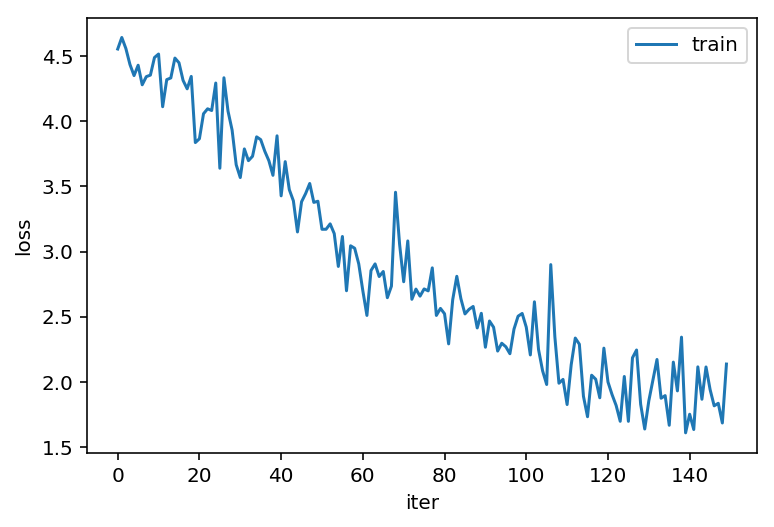

150
Epoch: 150, Iteration: 141500, Loss: 2.082038164138794
Epoch: 150, Iteration: 141600, Loss: 1.8423454761505127
Epoch: 150, Iteration: 141700, Loss: 1.5589046478271484
Epoch: 150, Iteration: 141800, Loss: 1.7649646997451782
Epoch: 150, Iteration: 141900, Loss: 2.1195693016052246
Epoch: 150, Iteration: 142000, Loss: 1.562292456626892
Epoch: 150, Iteration: 142100, Loss: 1.6965011358261108
Epoch: 150, Iteration: 142200, Loss: 1.8994685411453247
Epoch: 150, Iteration: 142300, Loss: 1.5308620929718018


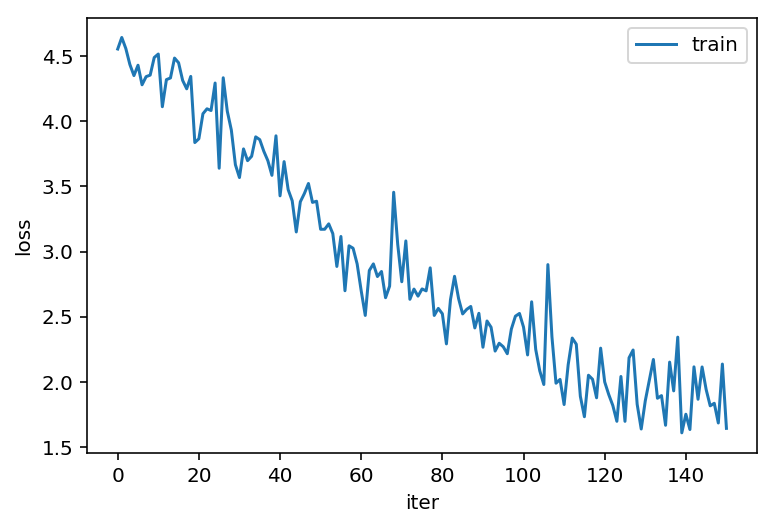

151
Epoch: 151, Iteration: 142400, Loss: 1.4595081806182861
Epoch: 151, Iteration: 142500, Loss: 1.9072895050048828
Epoch: 151, Iteration: 142600, Loss: 1.378429889678955
Epoch: 151, Iteration: 142700, Loss: 1.6015503406524658
Epoch: 151, Iteration: 142800, Loss: 1.7563897371292114
Epoch: 151, Iteration: 142900, Loss: 1.7098679542541504
Epoch: 151, Iteration: 143000, Loss: 2.215956449508667
Epoch: 151, Iteration: 143100, Loss: 2.2141737937927246
Epoch: 151, Iteration: 143200, Loss: 1.9279201030731201
Epoch: 151, Iteration: 143300, Loss: 1.7175037860870361


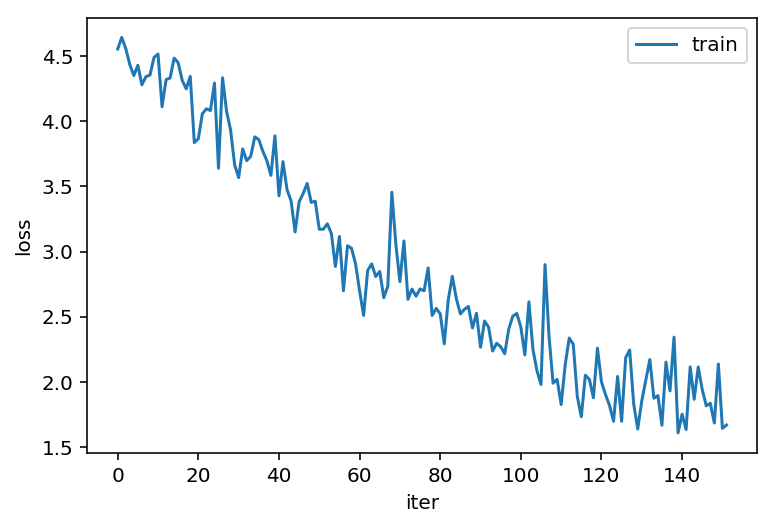

152
Epoch: 152, Iteration: 143400, Loss: 1.8376178741455078
Epoch: 152, Iteration: 143500, Loss: 2.177661418914795
Epoch: 152, Iteration: 143600, Loss: 1.9043680429458618
Epoch: 152, Iteration: 143700, Loss: 1.5379118919372559
Epoch: 152, Iteration: 143800, Loss: 1.890118956565857
Epoch: 152, Iteration: 143900, Loss: 2.398096799850464
Epoch: 152, Iteration: 144000, Loss: 1.9618278741836548
Epoch: 152, Iteration: 144100, Loss: 2.426401138305664
Epoch: 152, Iteration: 144200, Loss: 1.9866931438446045


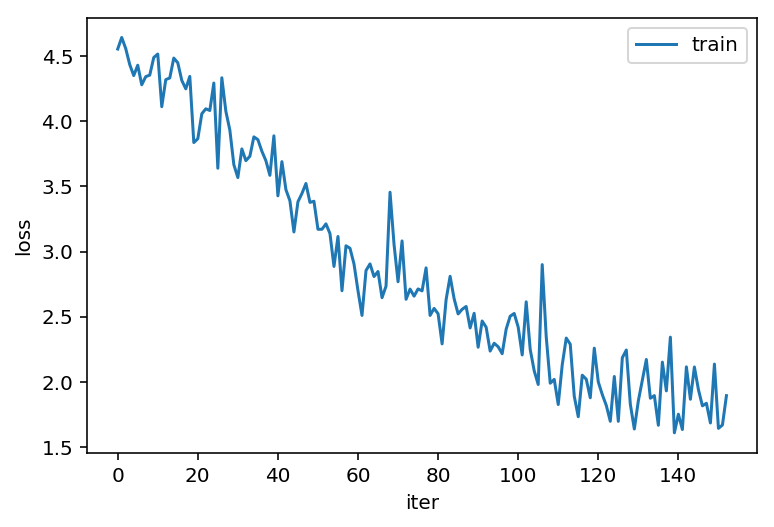

153
Epoch: 153, Iteration: 144300, Loss: 1.6567009687423706
Epoch: 153, Iteration: 144400, Loss: 1.8601880073547363
Epoch: 153, Iteration: 144500, Loss: 2.322225332260132
Epoch: 153, Iteration: 144600, Loss: 1.5923348665237427
Epoch: 153, Iteration: 144700, Loss: 1.6268516778945923
Epoch: 153, Iteration: 144800, Loss: 1.8903534412384033
Epoch: 153, Iteration: 144900, Loss: 2.035221815109253
Epoch: 153, Iteration: 145000, Loss: 1.7108070850372314
Epoch: 153, Iteration: 145100, Loss: 1.1805317401885986
Epoch: 153, Iteration: 145200, Loss: 1.711962342262268


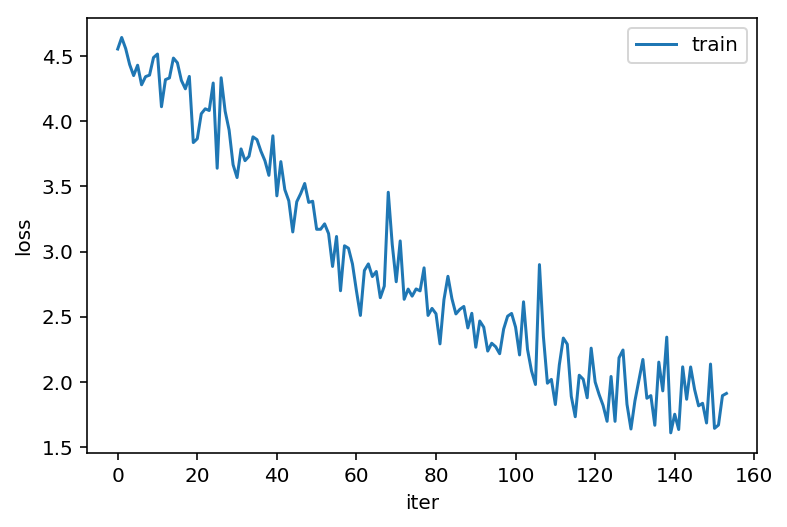

154
Epoch: 154, Iteration: 145300, Loss: 2.3014822006225586
Epoch: 154, Iteration: 145400, Loss: 1.582461953163147
Epoch: 154, Iteration: 145500, Loss: 1.6181156635284424
Epoch: 154, Iteration: 145600, Loss: 1.9074041843414307
Epoch: 154, Iteration: 145700, Loss: 1.723281741142273
Epoch: 154, Iteration: 145800, Loss: 1.6523003578186035
Epoch: 154, Iteration: 145900, Loss: 2.0602729320526123
Epoch: 154, Iteration: 146000, Loss: 1.7630443572998047
Epoch: 154, Iteration: 146100, Loss: 2.268186330795288


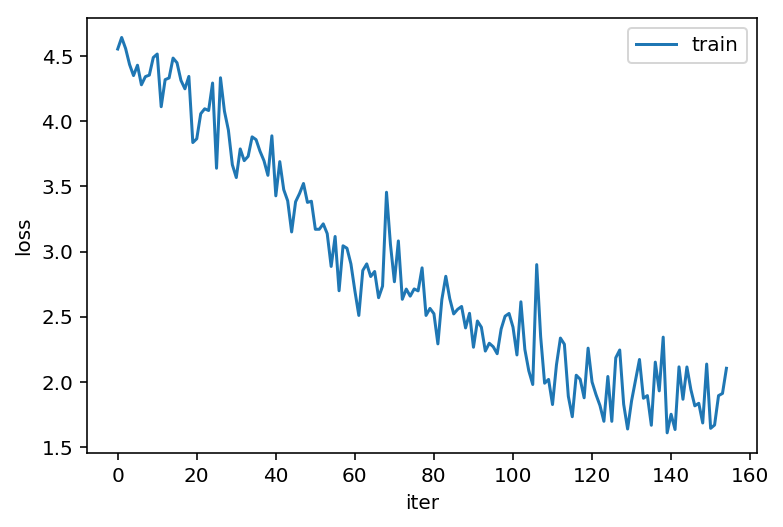

155
Epoch: 155, Iteration: 146200, Loss: 1.7469167709350586
Epoch: 155, Iteration: 146300, Loss: 1.6715642213821411
Epoch: 155, Iteration: 146400, Loss: 1.8726105690002441
Epoch: 155, Iteration: 146500, Loss: 1.6927534341812134
Epoch: 155, Iteration: 146600, Loss: 2.0939085483551025
Epoch: 155, Iteration: 146700, Loss: 1.8019897937774658
Epoch: 155, Iteration: 146800, Loss: 1.6958814859390259
Epoch: 155, Iteration: 146900, Loss: 1.8866366147994995
Epoch: 155, Iteration: 147000, Loss: 1.9120960235595703
Epoch: 155, Iteration: 147100, Loss: 2.276045322418213


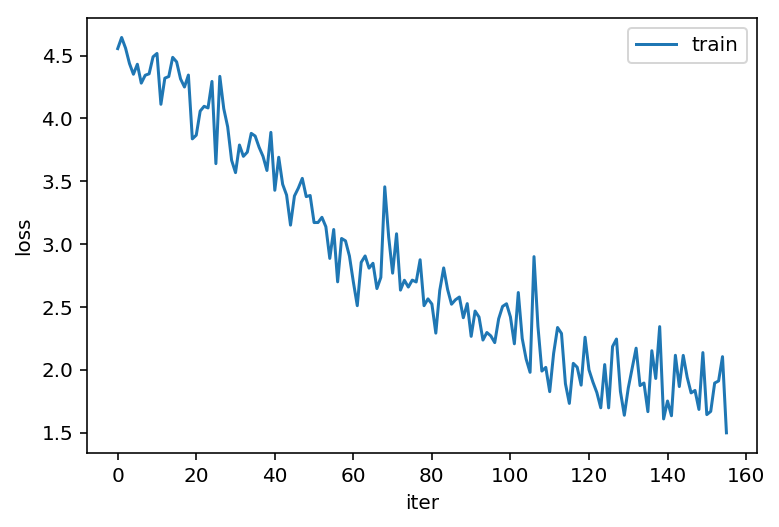

156
Epoch: 156, Iteration: 147200, Loss: 1.461673617362976
Epoch: 156, Iteration: 147300, Loss: 1.7233977317810059
Epoch: 156, Iteration: 147400, Loss: 1.1691356897354126
Epoch: 156, Iteration: 147500, Loss: 1.7050907611846924
Epoch: 156, Iteration: 147600, Loss: 1.9467368125915527
Epoch: 156, Iteration: 147700, Loss: 2.149141550064087
Epoch: 156, Iteration: 147800, Loss: 1.4872102737426758
Epoch: 156, Iteration: 147900, Loss: 1.4947444200515747
Epoch: 156, Iteration: 148000, Loss: 2.3105156421661377


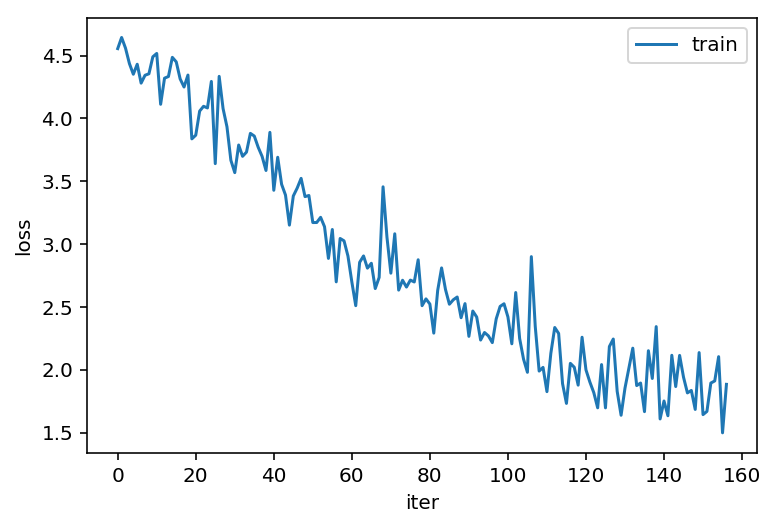

157
Epoch: 157, Iteration: 148100, Loss: 1.54792320728302
Epoch: 157, Iteration: 148200, Loss: 1.1253516674041748
Epoch: 157, Iteration: 148300, Loss: 1.5426430702209473
Epoch: 157, Iteration: 148400, Loss: 1.714953899383545
Epoch: 157, Iteration: 148500, Loss: 1.7602959871292114
Epoch: 157, Iteration: 148600, Loss: 1.7096900939941406
Epoch: 157, Iteration: 148700, Loss: 1.8583662509918213
Epoch: 157, Iteration: 148800, Loss: 1.8404126167297363
Epoch: 157, Iteration: 148900, Loss: 1.9727380275726318


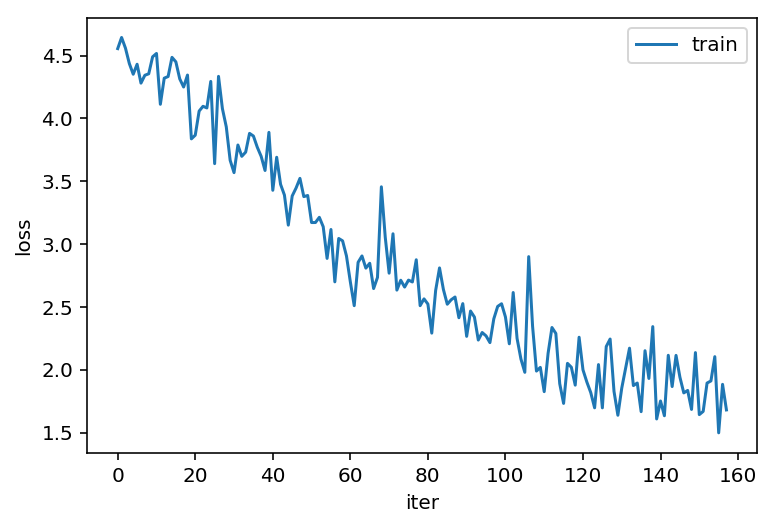

158
Epoch: 158, Iteration: 149000, Loss: 1.5552051067352295
Epoch: 158, Iteration: 149100, Loss: 1.5259464979171753
Epoch: 158, Iteration: 149200, Loss: 1.5174710750579834
Epoch: 158, Iteration: 149300, Loss: 1.9208651781082153
Epoch: 158, Iteration: 149400, Loss: 1.8953886032104492
Epoch: 158, Iteration: 149500, Loss: 1.5537889003753662
Epoch: 158, Iteration: 149600, Loss: 2.1648802757263184
Epoch: 158, Iteration: 149700, Loss: 1.919662594795227
Epoch: 158, Iteration: 149800, Loss: 1.842974305152893
Epoch: 158, Iteration: 149900, Loss: 2.1870193481445312


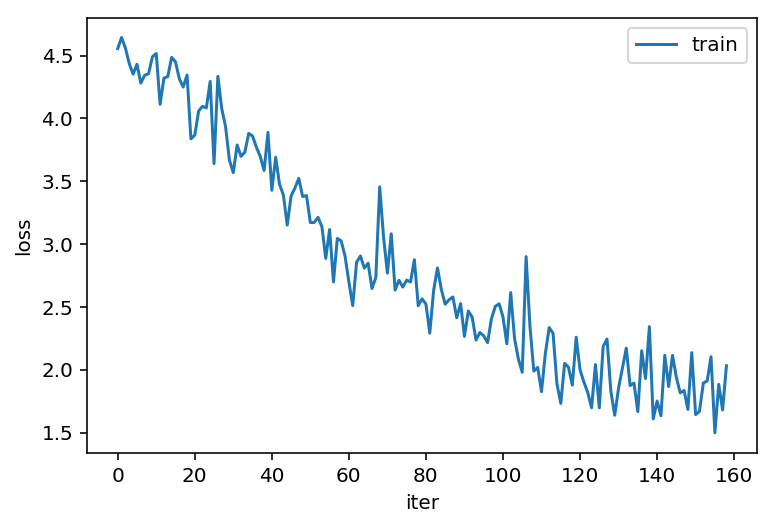

159
Epoch: 159, Iteration: 150000, Loss: 1.540244460105896
Epoch: 159, Iteration: 150100, Loss: 1.6353769302368164
Epoch: 159, Iteration: 150200, Loss: 1.6012687683105469
Epoch: 159, Iteration: 150300, Loss: 1.852847933769226
Epoch: 159, Iteration: 150400, Loss: 1.9541555643081665
Epoch: 159, Iteration: 150500, Loss: 1.7868549823760986
Epoch: 159, Iteration: 150600, Loss: 2.1941215991973877
Epoch: 159, Iteration: 150700, Loss: 1.464950442314148
Epoch: 159, Iteration: 150800, Loss: 1.9359709024429321


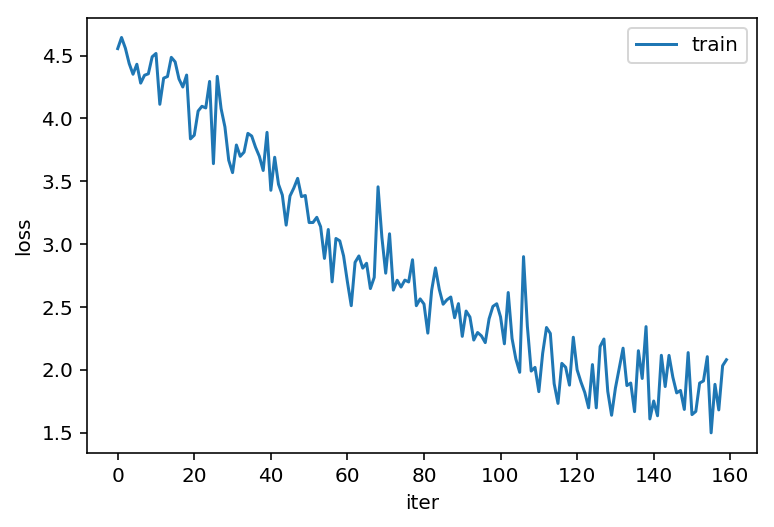

160
Epoch: 160, Iteration: 150900, Loss: 1.9473137855529785
Epoch: 160, Iteration: 151000, Loss: 1.7077807188034058
Epoch: 160, Iteration: 151100, Loss: 1.9933192729949951
Epoch: 160, Iteration: 151200, Loss: 1.7195945978164673
Epoch: 160, Iteration: 151300, Loss: 1.784759283065796
Epoch: 160, Iteration: 151400, Loss: 1.960835576057434
Epoch: 160, Iteration: 151500, Loss: 2.0865602493286133
Epoch: 160, Iteration: 151600, Loss: 2.182086229324341
Epoch: 160, Iteration: 151700, Loss: 1.298742413520813
Epoch: 160, Iteration: 151800, Loss: 1.797295331954956


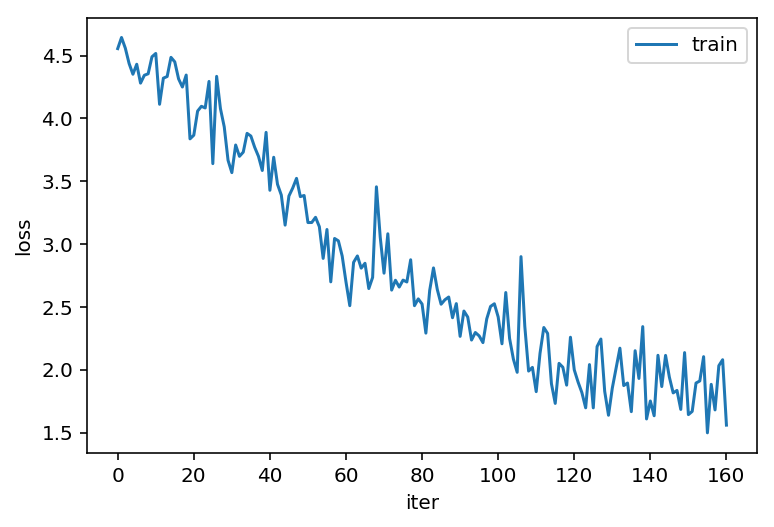

161
Epoch: 161, Iteration: 151900, Loss: 2.1709399223327637
Epoch: 161, Iteration: 152000, Loss: 2.1799817085266113
Epoch: 161, Iteration: 152100, Loss: 1.4365637302398682
Epoch: 161, Iteration: 152200, Loss: 1.581434726715088
Epoch: 161, Iteration: 152300, Loss: 1.6887640953063965
Epoch: 161, Iteration: 152400, Loss: 2.070117950439453
Epoch: 161, Iteration: 152500, Loss: 2.145495891571045
Epoch: 161, Iteration: 152600, Loss: 1.8701303005218506
Epoch: 161, Iteration: 152700, Loss: 1.7205721139907837


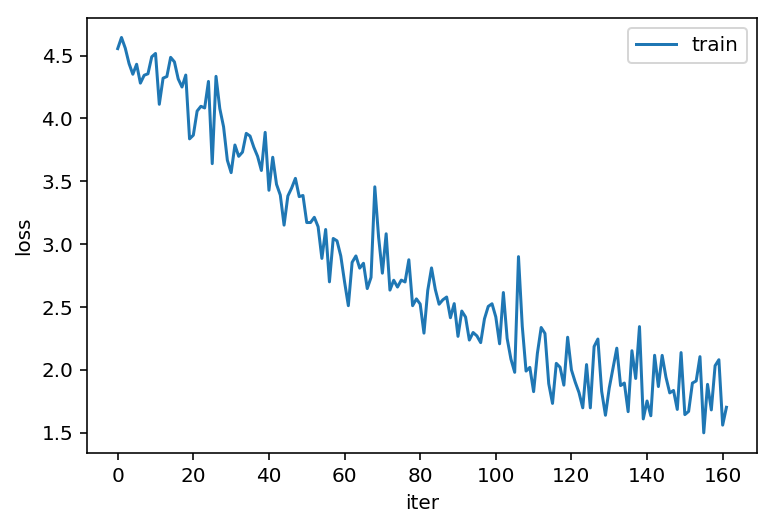

162
Epoch: 162, Iteration: 152800, Loss: 1.51737380027771
Epoch: 162, Iteration: 152900, Loss: 1.5691759586334229
Epoch: 162, Iteration: 153000, Loss: 1.793779969215393
Epoch: 162, Iteration: 153100, Loss: 1.6832224130630493
Epoch: 162, Iteration: 153200, Loss: 1.4844166040420532
Epoch: 162, Iteration: 153300, Loss: 1.7498711347579956
Epoch: 162, Iteration: 153400, Loss: 1.8481130599975586
Epoch: 162, Iteration: 153500, Loss: 1.9711066484451294
Epoch: 162, Iteration: 153600, Loss: 1.57277512550354
Epoch: 162, Iteration: 153700, Loss: 1.90945303440094


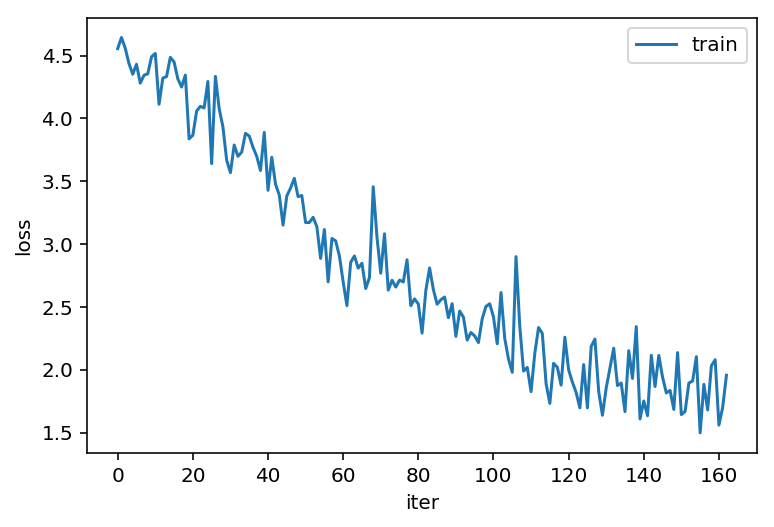

163
Epoch: 163, Iteration: 153800, Loss: 1.9877245426177979
Epoch: 163, Iteration: 153900, Loss: 2.216657876968384
Epoch: 163, Iteration: 154000, Loss: 1.4701443910598755
Epoch: 163, Iteration: 154100, Loss: 1.9351692199707031
Epoch: 163, Iteration: 154200, Loss: 1.5966697931289673
Epoch: 163, Iteration: 154300, Loss: 1.9531328678131104
Epoch: 163, Iteration: 154400, Loss: 1.5498425960540771
Epoch: 163, Iteration: 154500, Loss: 2.0663750171661377
Epoch: 163, Iteration: 154600, Loss: 1.5427933931350708


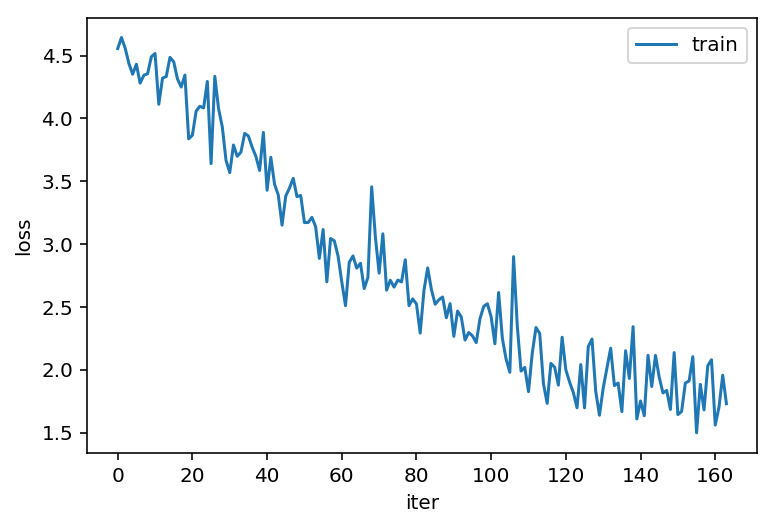

164
Epoch: 164, Iteration: 154700, Loss: 1.3976842164993286
Epoch: 164, Iteration: 154800, Loss: 1.5661771297454834
Epoch: 164, Iteration: 154900, Loss: 1.570054531097412
Epoch: 164, Iteration: 155000, Loss: 1.4009751081466675
Epoch: 164, Iteration: 155100, Loss: 1.4923607110977173
Epoch: 164, Iteration: 155200, Loss: 1.62041175365448
Epoch: 164, Iteration: 155300, Loss: 2.322256088256836
Epoch: 164, Iteration: 155400, Loss: 1.919672966003418
Epoch: 164, Iteration: 155500, Loss: 1.713916540145874


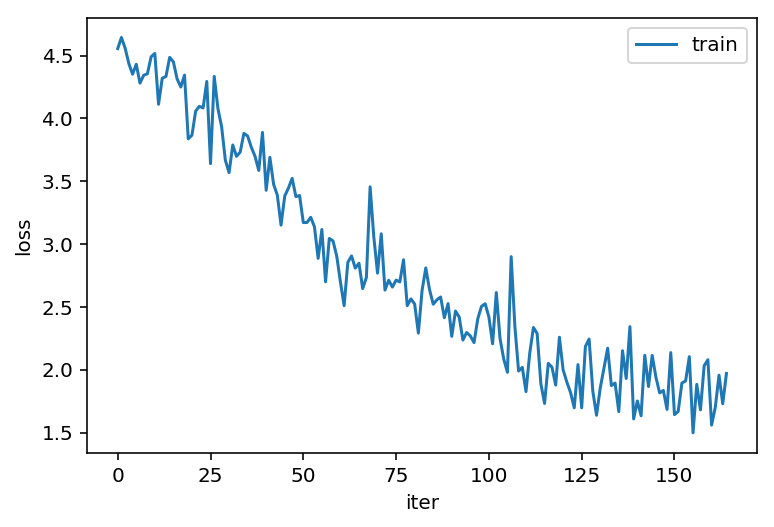

165
Epoch: 165, Iteration: 155600, Loss: 1.5438299179077148
Epoch: 165, Iteration: 155700, Loss: 1.6253607273101807
Epoch: 165, Iteration: 155800, Loss: 1.6730854511260986
Epoch: 165, Iteration: 155900, Loss: 1.4709690809249878
Epoch: 165, Iteration: 156000, Loss: 1.955220341682434
Epoch: 165, Iteration: 156100, Loss: 2.249443531036377
Epoch: 165, Iteration: 156200, Loss: 1.8598182201385498
Epoch: 165, Iteration: 156300, Loss: 1.6985000371932983
Epoch: 165, Iteration: 156400, Loss: 1.5321428775787354
Epoch: 165, Iteration: 156500, Loss: 1.732342004776001


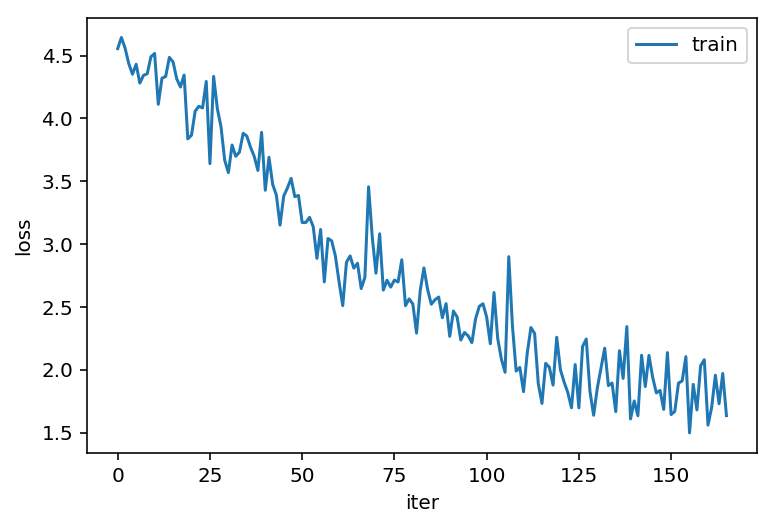

166
Epoch: 166, Iteration: 156600, Loss: 1.4009861946105957
Epoch: 166, Iteration: 156700, Loss: 1.3619464635849
Epoch: 166, Iteration: 156800, Loss: 2.481879711151123
Epoch: 166, Iteration: 156900, Loss: 1.7271183729171753
Epoch: 166, Iteration: 157000, Loss: 1.787588357925415
Epoch: 166, Iteration: 157100, Loss: 1.6158095598220825
Epoch: 166, Iteration: 157200, Loss: 1.7439043521881104
Epoch: 166, Iteration: 157300, Loss: 1.4457989931106567
Epoch: 166, Iteration: 157400, Loss: 1.7000807523727417


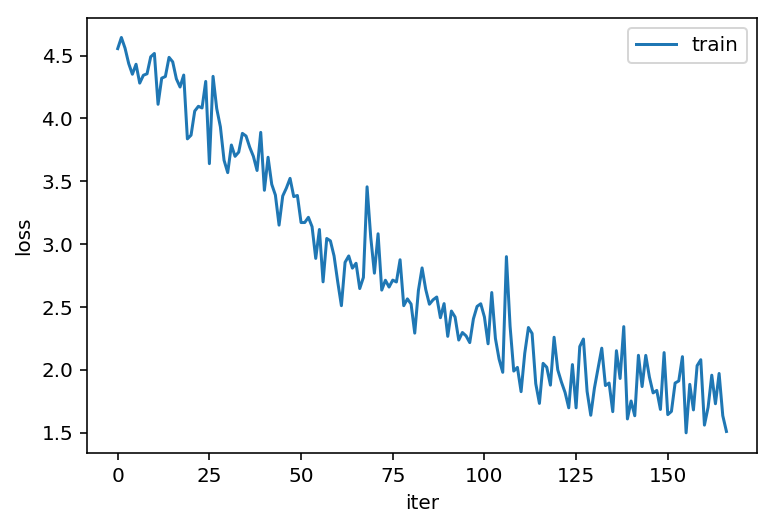

167
Epoch: 167, Iteration: 157500, Loss: 1.5782921314239502
Epoch: 167, Iteration: 157600, Loss: 1.6266016960144043
Epoch: 167, Iteration: 157700, Loss: 1.338857889175415
Epoch: 167, Iteration: 157800, Loss: 1.8592530488967896
Epoch: 167, Iteration: 157900, Loss: 1.5981167554855347
Epoch: 167, Iteration: 158000, Loss: 1.7364059686660767
Epoch: 167, Iteration: 158100, Loss: 1.4761229753494263
Epoch: 167, Iteration: 158200, Loss: 1.6832911968231201
Epoch: 167, Iteration: 158300, Loss: 1.5829113721847534
Epoch: 167, Iteration: 158400, Loss: 1.9055465459823608


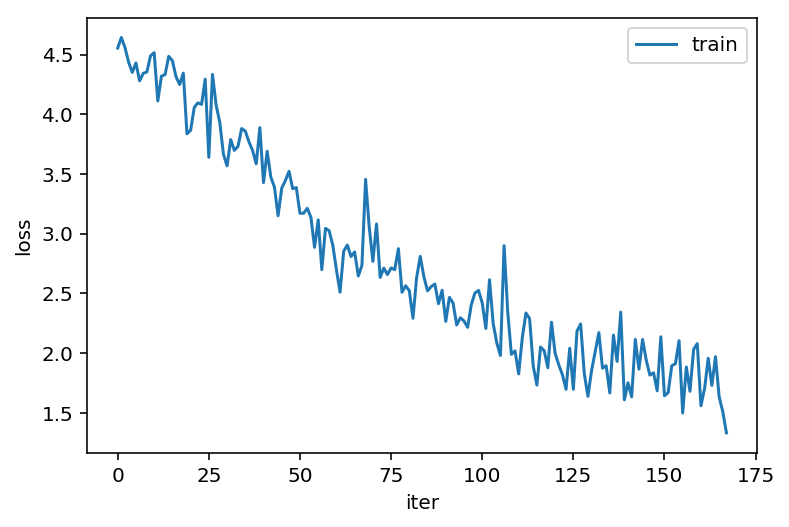

168
Epoch: 168, Iteration: 158500, Loss: 1.2877594232559204
Epoch: 168, Iteration: 158600, Loss: 2.14737606048584
Epoch: 168, Iteration: 158700, Loss: 1.1789841651916504
Epoch: 168, Iteration: 158800, Loss: 1.0698777437210083
Epoch: 168, Iteration: 158900, Loss: 1.5607751607894897
Epoch: 168, Iteration: 159000, Loss: 1.4427448511123657
Epoch: 168, Iteration: 159100, Loss: 1.3738665580749512
Epoch: 168, Iteration: 159200, Loss: 2.110581874847412
Epoch: 168, Iteration: 159300, Loss: 1.551981806755066


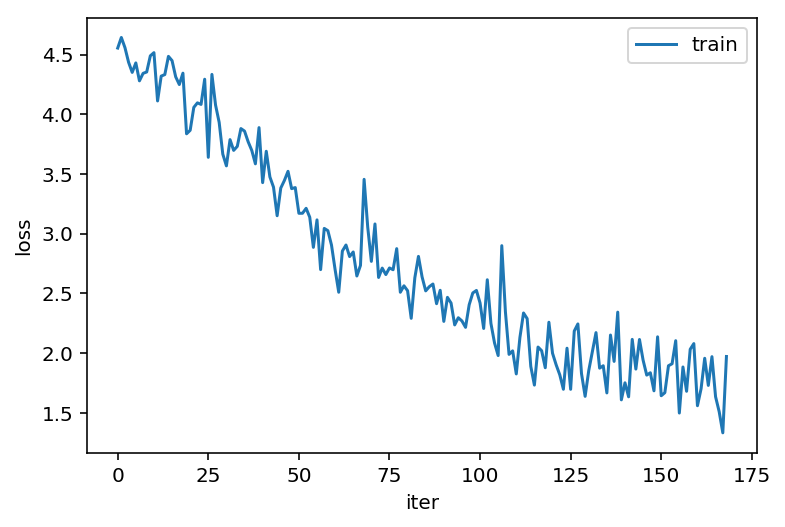

169
Epoch: 169, Iteration: 159400, Loss: 1.463379144668579
Epoch: 169, Iteration: 159500, Loss: 1.7295465469360352
Epoch: 169, Iteration: 159600, Loss: 1.9809448719024658
Epoch: 169, Iteration: 159700, Loss: 1.587435245513916
Epoch: 169, Iteration: 159800, Loss: 2.0077052116394043
Epoch: 169, Iteration: 159900, Loss: 1.8016586303710938
Epoch: 169, Iteration: 160000, Loss: 1.987180233001709
Epoch: 169, Iteration: 160100, Loss: 1.4031803607940674
Epoch: 169, Iteration: 160200, Loss: 2.1429250240325928
Epoch: 169, Iteration: 160300, Loss: 1.7914010286331177


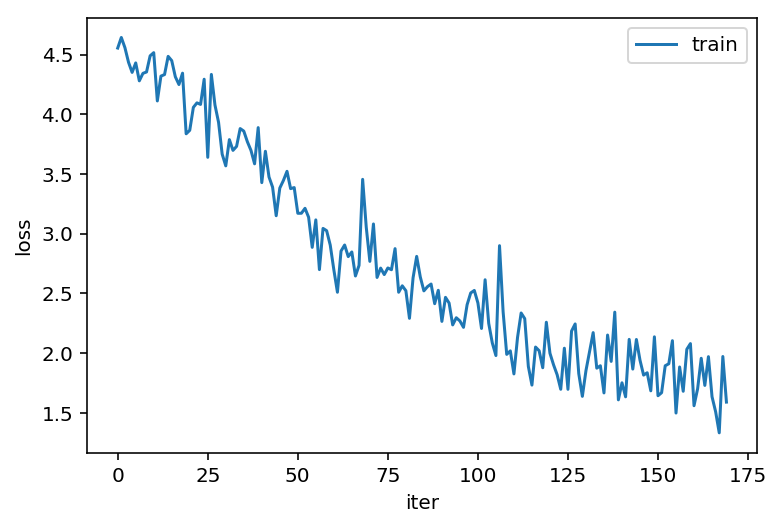

170
Epoch: 170, Iteration: 160400, Loss: 2.03562068939209
Epoch: 170, Iteration: 160500, Loss: 1.686637043952942
Epoch: 170, Iteration: 160600, Loss: 2.4861934185028076
Epoch: 170, Iteration: 160700, Loss: 1.755020260810852
Epoch: 170, Iteration: 160800, Loss: 1.7743513584136963
Epoch: 170, Iteration: 160900, Loss: 1.8213049173355103
Epoch: 170, Iteration: 161000, Loss: 1.6576863527297974
Epoch: 170, Iteration: 161100, Loss: 1.7148630619049072
Epoch: 170, Iteration: 161200, Loss: 1.8288654088974


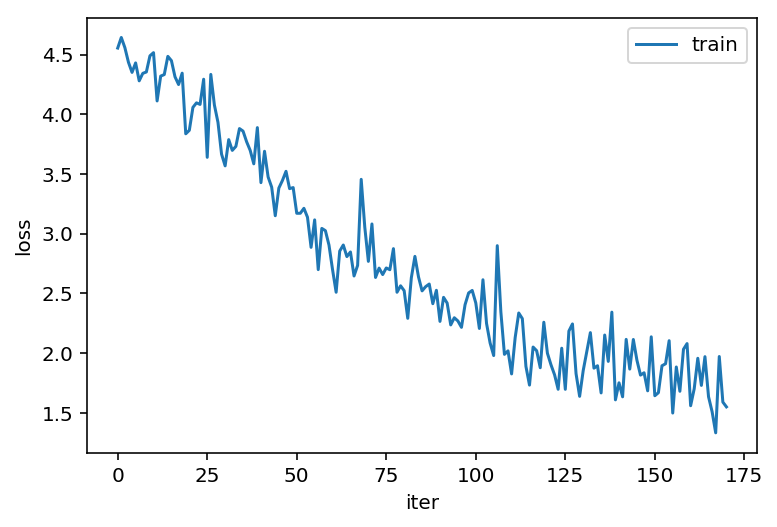

171
Epoch: 171, Iteration: 161300, Loss: 2.0682995319366455
Epoch: 171, Iteration: 161400, Loss: 1.6951508522033691
Epoch: 171, Iteration: 161500, Loss: 1.9058797359466553
Epoch: 171, Iteration: 161600, Loss: 1.3860390186309814
Epoch: 171, Iteration: 161700, Loss: 1.9143197536468506
Epoch: 171, Iteration: 161800, Loss: 1.5480382442474365
Epoch: 171, Iteration: 161900, Loss: 1.757403016090393
Epoch: 171, Iteration: 162000, Loss: 1.7340028285980225
Epoch: 171, Iteration: 162100, Loss: 2.1236658096313477


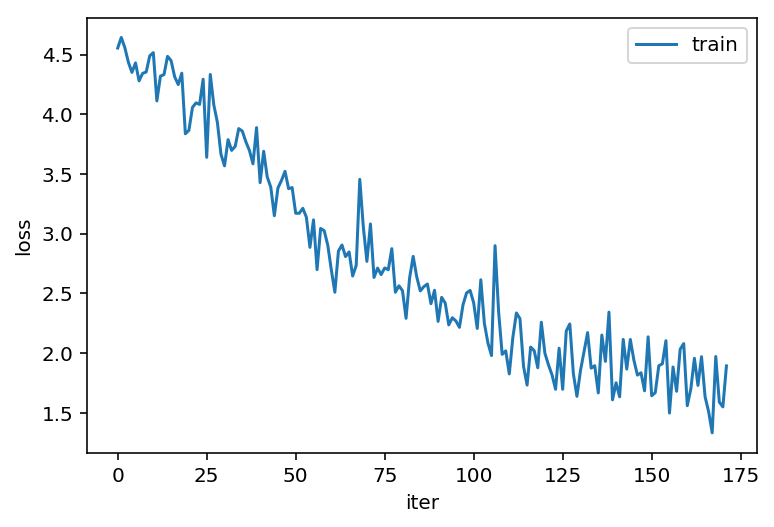

172
Epoch: 172, Iteration: 162200, Loss: 1.652274250984192
Epoch: 172, Iteration: 162300, Loss: 1.4070708751678467
Epoch: 172, Iteration: 162400, Loss: 1.7413641214370728
Epoch: 172, Iteration: 162500, Loss: 1.8604965209960938
Epoch: 172, Iteration: 162600, Loss: 1.5024479627609253
Epoch: 172, Iteration: 162700, Loss: 1.8258241415023804
Epoch: 172, Iteration: 162800, Loss: 1.6896090507507324
Epoch: 172, Iteration: 162900, Loss: 1.5683387517929077
Epoch: 172, Iteration: 163000, Loss: 1.7704967260360718
Epoch: 172, Iteration: 163100, Loss: 1.5969586372375488


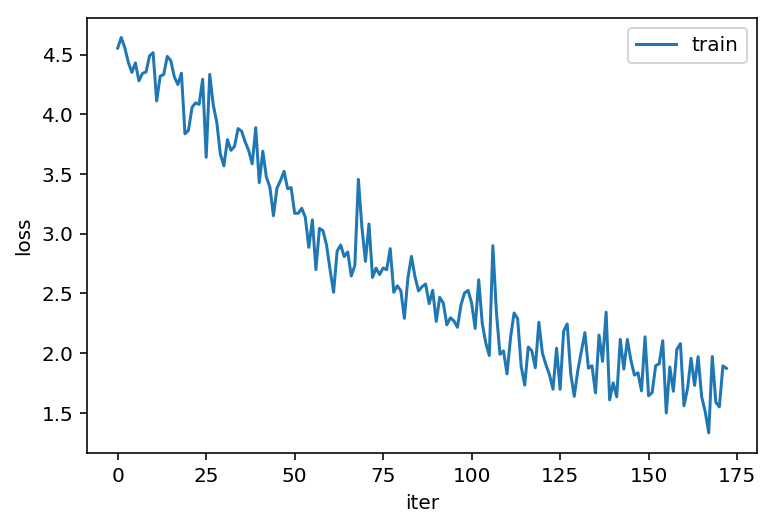

173
Epoch: 173, Iteration: 163200, Loss: 1.8300851583480835
Epoch: 173, Iteration: 163300, Loss: 1.6916742324829102
Epoch: 173, Iteration: 163400, Loss: 1.5379887819290161
Epoch: 173, Iteration: 163500, Loss: 1.7372102737426758
Epoch: 173, Iteration: 163600, Loss: 1.4097260236740112
Epoch: 173, Iteration: 163700, Loss: 2.034846305847168
Epoch: 173, Iteration: 163800, Loss: 1.4991451501846313
Epoch: 173, Iteration: 163900, Loss: 1.5008366107940674
Epoch: 173, Iteration: 164000, Loss: 1.9833022356033325


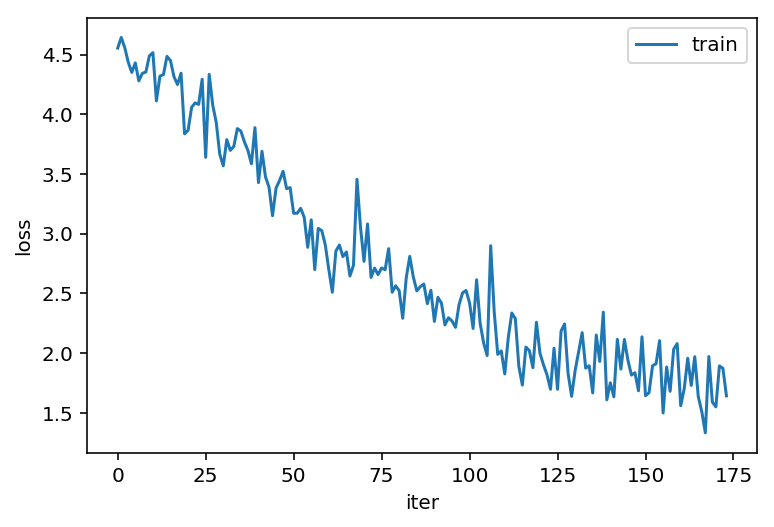

174
Epoch: 174, Iteration: 164100, Loss: 1.6999139785766602
Epoch: 174, Iteration: 164200, Loss: 1.4111931324005127
Epoch: 174, Iteration: 164300, Loss: 1.5994951725006104
Epoch: 174, Iteration: 164400, Loss: 2.306649684906006
Epoch: 174, Iteration: 164500, Loss: 1.778527855873108
Epoch: 174, Iteration: 164600, Loss: 1.9410264492034912
Epoch: 174, Iteration: 164700, Loss: 2.0289390087127686
Epoch: 174, Iteration: 164800, Loss: 1.6756888628005981
Epoch: 174, Iteration: 164900, Loss: 1.7973599433898926
Epoch: 174, Iteration: 165000, Loss: 2.2369229793548584


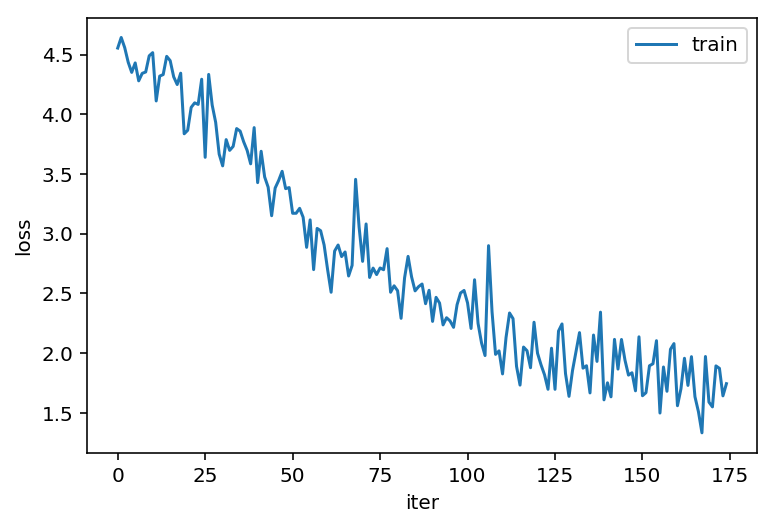

175
Epoch: 175, Iteration: 165100, Loss: 1.831196904182434
Epoch: 175, Iteration: 165200, Loss: 1.80928373336792
Epoch: 175, Iteration: 165300, Loss: 1.7888118028640747
Epoch: 175, Iteration: 165400, Loss: 1.6987611055374146
Epoch: 175, Iteration: 165500, Loss: 1.7908542156219482
Epoch: 175, Iteration: 165600, Loss: 1.708739161491394
Epoch: 175, Iteration: 165700, Loss: 1.757927656173706
Epoch: 175, Iteration: 165800, Loss: 1.7069952487945557
Epoch: 175, Iteration: 165900, Loss: 1.7424404621124268


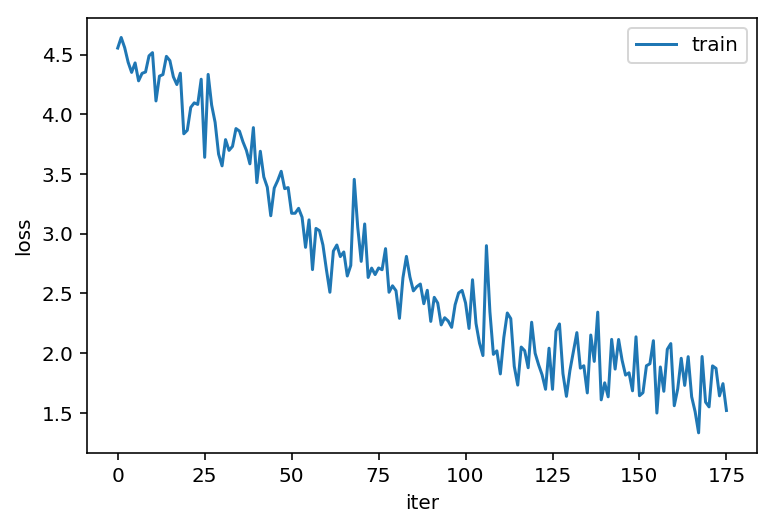

176
Epoch: 176, Iteration: 166000, Loss: 1.3560889959335327
Epoch: 176, Iteration: 166100, Loss: 1.4584025144577026
Epoch: 176, Iteration: 166200, Loss: 1.4825741052627563
Epoch: 176, Iteration: 166300, Loss: 2.2565128803253174
Epoch: 176, Iteration: 166400, Loss: 1.8602153062820435
Epoch: 176, Iteration: 166500, Loss: 1.519091010093689
Epoch: 176, Iteration: 166600, Loss: 2.186502695083618
Epoch: 176, Iteration: 166700, Loss: 1.6724212169647217
Epoch: 176, Iteration: 166800, Loss: 1.6982638835906982
Epoch: 176, Iteration: 166900, Loss: 1.5894745588302612


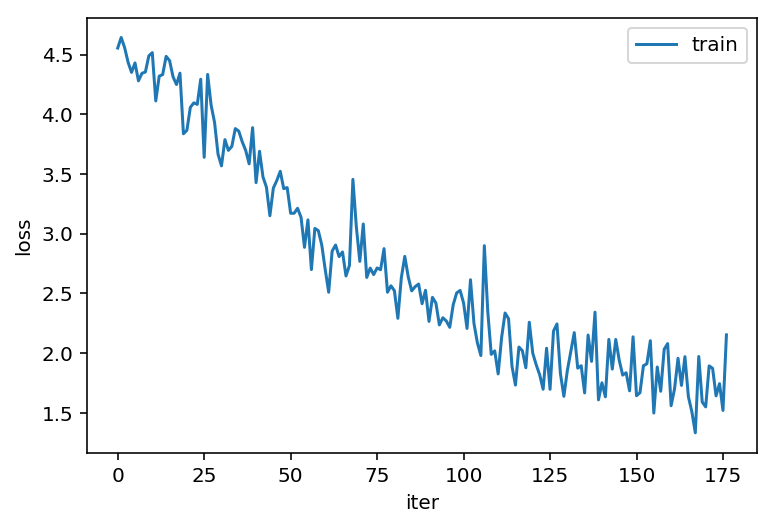

177
Epoch: 177, Iteration: 167000, Loss: 1.295691728591919
Epoch: 177, Iteration: 167100, Loss: 1.8008750677108765
Epoch: 177, Iteration: 167200, Loss: 1.4482178688049316
Epoch: 177, Iteration: 167300, Loss: 1.7021634578704834
Epoch: 177, Iteration: 167400, Loss: 2.0758728981018066
Epoch: 177, Iteration: 167500, Loss: 1.403876543045044
Epoch: 177, Iteration: 167600, Loss: 1.2458468675613403
Epoch: 177, Iteration: 167700, Loss: 1.785547137260437
Epoch: 177, Iteration: 167800, Loss: 1.7727885246276855


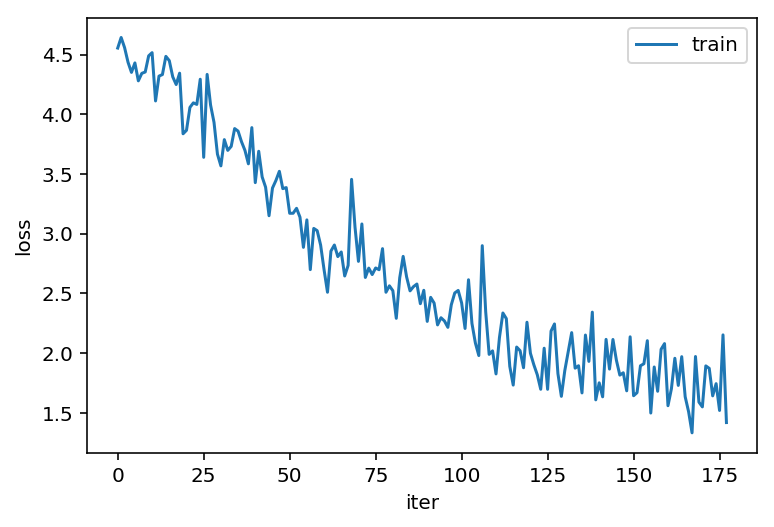

178
Epoch: 178, Iteration: 167900, Loss: 1.7954432964324951
Epoch: 178, Iteration: 168000, Loss: 1.3630127906799316
Epoch: 178, Iteration: 168100, Loss: 1.4974695444107056
Epoch: 178, Iteration: 168200, Loss: 1.6675523519515991
Epoch: 178, Iteration: 168300, Loss: 1.7621204853057861
Epoch: 178, Iteration: 168400, Loss: 1.9100298881530762
Epoch: 178, Iteration: 168500, Loss: 2.1670916080474854
Epoch: 178, Iteration: 168600, Loss: 1.5670307874679565
Epoch: 178, Iteration: 168700, Loss: 1.486051082611084


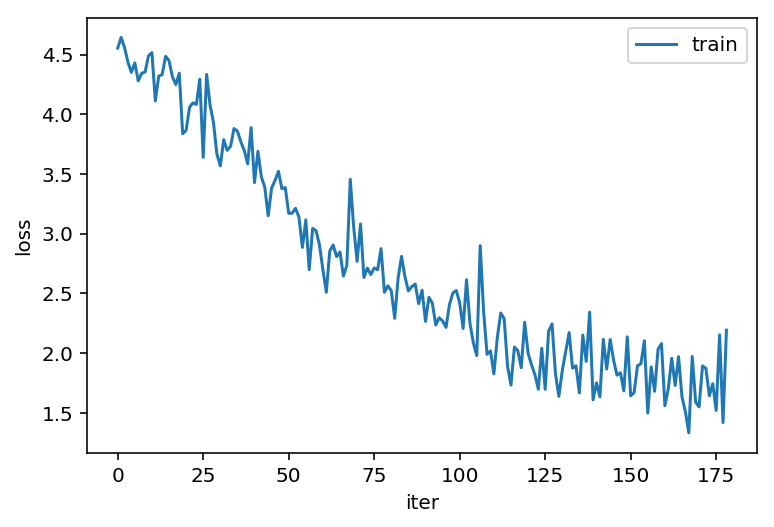

179
Epoch: 179, Iteration: 168800, Loss: 1.2870935201644897
Epoch: 179, Iteration: 168900, Loss: 1.8094888925552368
Epoch: 179, Iteration: 169000, Loss: 1.9208874702453613
Epoch: 179, Iteration: 169100, Loss: 1.793276309967041
Epoch: 179, Iteration: 169200, Loss: 1.5473809242248535
Epoch: 179, Iteration: 169300, Loss: 2.03083872795105
Epoch: 179, Iteration: 169400, Loss: 2.1293411254882812
Epoch: 179, Iteration: 169500, Loss: 1.8554894924163818
Epoch: 179, Iteration: 169600, Loss: 1.7021547555923462
Epoch: 179, Iteration: 169700, Loss: 1.68950617313385


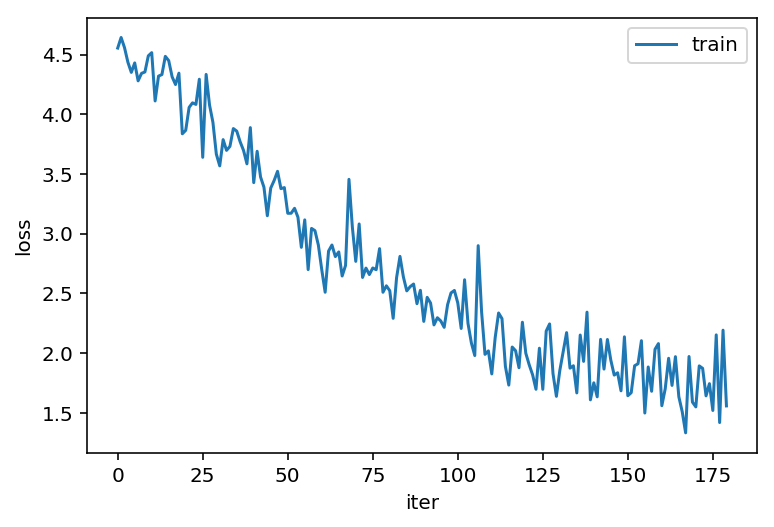

180
Epoch: 180, Iteration: 169800, Loss: 1.661142110824585
Epoch: 180, Iteration: 169900, Loss: 1.4587159156799316
Epoch: 180, Iteration: 170000, Loss: 1.3546717166900635
Epoch: 180, Iteration: 170100, Loss: 1.6035456657409668
Epoch: 180, Iteration: 170200, Loss: 1.794835090637207
Epoch: 180, Iteration: 170300, Loss: 1.9493664503097534
Epoch: 180, Iteration: 170400, Loss: 1.4970532655715942
Epoch: 180, Iteration: 170500, Loss: 1.9376535415649414
Epoch: 180, Iteration: 170600, Loss: 1.5719345808029175


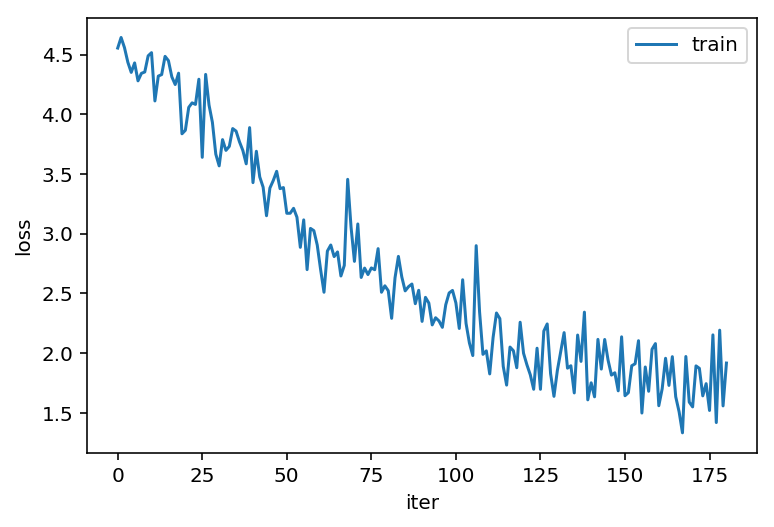

181
Epoch: 181, Iteration: 170700, Loss: 1.4683884382247925
Epoch: 181, Iteration: 170800, Loss: 1.4512698650360107
Epoch: 181, Iteration: 170900, Loss: 1.4330145120620728
Epoch: 181, Iteration: 171000, Loss: 1.5709009170532227
Epoch: 181, Iteration: 171100, Loss: 1.3146947622299194
Epoch: 181, Iteration: 171200, Loss: 1.483449935913086
Epoch: 181, Iteration: 171300, Loss: 1.8762311935424805
Epoch: 181, Iteration: 171400, Loss: 1.5294121503829956
Epoch: 181, Iteration: 171500, Loss: 1.4681951999664307
Epoch: 181, Iteration: 171600, Loss: 2.2120890617370605


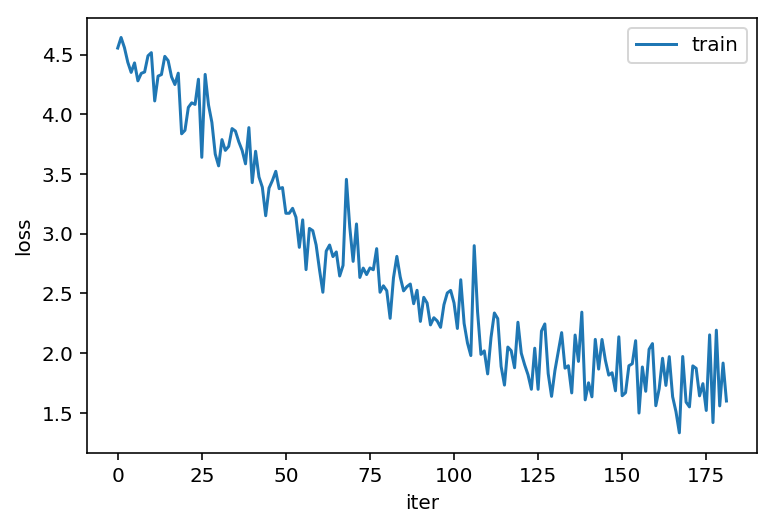

182
Epoch: 182, Iteration: 171700, Loss: 1.3448750972747803
Epoch: 182, Iteration: 171800, Loss: 1.4745286703109741
Epoch: 182, Iteration: 171900, Loss: 1.627468466758728
Epoch: 182, Iteration: 172000, Loss: 1.568665862083435
Epoch: 182, Iteration: 172100, Loss: 1.301803708076477
Epoch: 182, Iteration: 172200, Loss: 1.729024887084961
Epoch: 182, Iteration: 172300, Loss: 1.8947417736053467
Epoch: 182, Iteration: 172400, Loss: 1.3506258726119995
Epoch: 182, Iteration: 172500, Loss: 1.6646252870559692


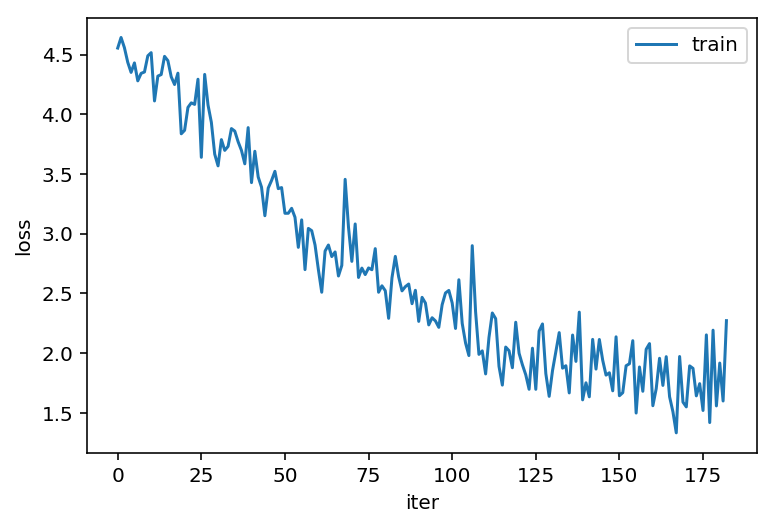

183
Epoch: 183, Iteration: 172600, Loss: 1.2301976680755615
Epoch: 183, Iteration: 172700, Loss: 1.2657188177108765
Epoch: 183, Iteration: 172800, Loss: 1.8366903066635132
Epoch: 183, Iteration: 172900, Loss: 1.6402597427368164
Epoch: 183, Iteration: 173000, Loss: 1.7589433193206787
Epoch: 183, Iteration: 173100, Loss: 1.292313575744629
Epoch: 183, Iteration: 173200, Loss: 1.5759010314941406
Epoch: 183, Iteration: 173300, Loss: 1.558959722518921
Epoch: 183, Iteration: 173400, Loss: 1.6997898817062378
Epoch: 183, Iteration: 173500, Loss: 1.4730651378631592


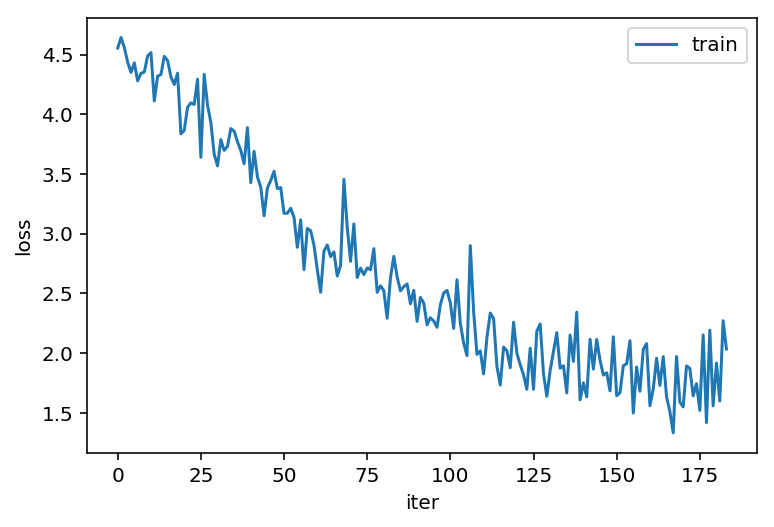

184
Epoch: 184, Iteration: 173600, Loss: 1.5995018482208252
Epoch: 184, Iteration: 173700, Loss: 1.6818444728851318
Epoch: 184, Iteration: 173800, Loss: 1.5964884757995605
Epoch: 184, Iteration: 173900, Loss: 1.304880142211914
Epoch: 184, Iteration: 174000, Loss: 1.545069932937622
Epoch: 184, Iteration: 174100, Loss: 1.8959276676177979
Epoch: 184, Iteration: 174200, Loss: 1.7100110054016113
Epoch: 184, Iteration: 174300, Loss: 1.875037670135498
Epoch: 184, Iteration: 174400, Loss: 1.687278151512146


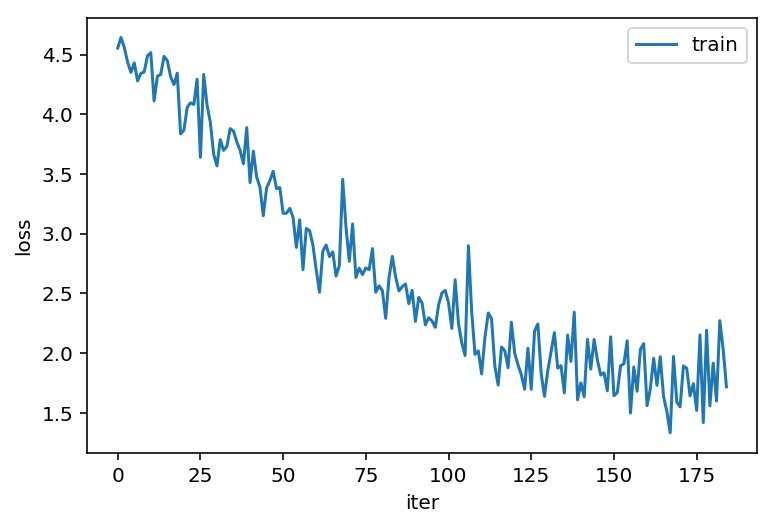

185
Epoch: 185, Iteration: 174500, Loss: 1.624880075454712
Epoch: 185, Iteration: 174600, Loss: 1.4982283115386963
Epoch: 185, Iteration: 174700, Loss: 1.6105000972747803
Epoch: 185, Iteration: 174800, Loss: 1.634504795074463
Epoch: 185, Iteration: 174900, Loss: 1.7164688110351562
Epoch: 185, Iteration: 175000, Loss: 1.6512682437896729
Epoch: 185, Iteration: 175100, Loss: 1.4190353155136108
Epoch: 185, Iteration: 175200, Loss: 1.6379114389419556
Epoch: 185, Iteration: 175300, Loss: 1.4053740501403809


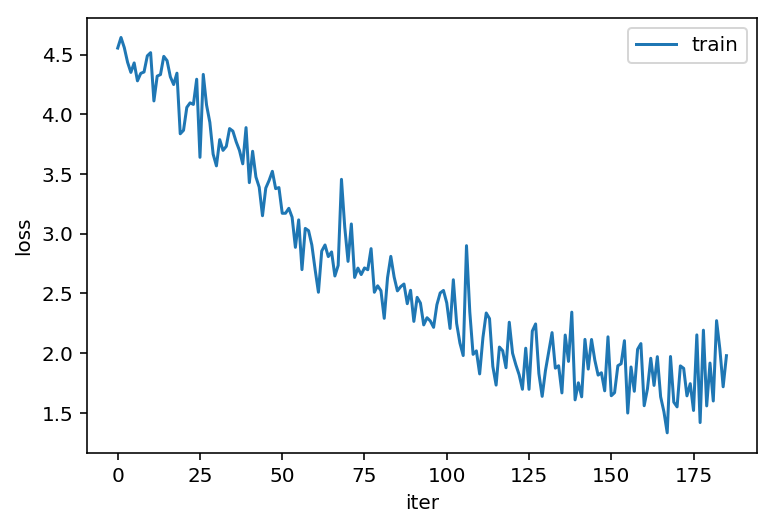

186
Epoch: 186, Iteration: 175400, Loss: 1.6778353452682495
Epoch: 186, Iteration: 175500, Loss: 1.5420902967453003
Epoch: 186, Iteration: 175600, Loss: 1.9306812286376953
Epoch: 186, Iteration: 175700, Loss: 1.532348394393921
Epoch: 186, Iteration: 175800, Loss: 2.0390591621398926
Epoch: 186, Iteration: 175900, Loss: 1.8667232990264893
Epoch: 186, Iteration: 176000, Loss: 1.7977389097213745
Epoch: 186, Iteration: 176100, Loss: 2.0036027431488037
Epoch: 186, Iteration: 176200, Loss: 1.6517634391784668
Epoch: 186, Iteration: 176300, Loss: 1.3646273612976074


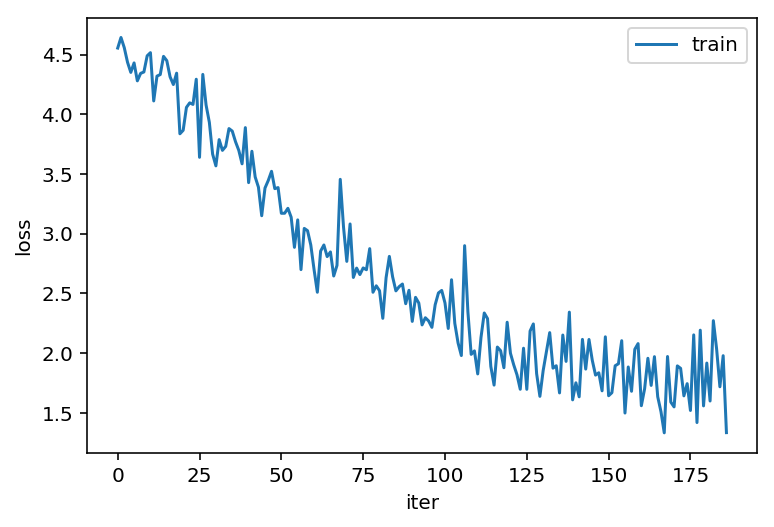

187
Epoch: 187, Iteration: 176400, Loss: 1.4884988069534302
Epoch: 187, Iteration: 176500, Loss: 2.0201938152313232
Epoch: 187, Iteration: 176600, Loss: 1.4836459159851074
Epoch: 187, Iteration: 176700, Loss: 1.837292194366455
Epoch: 187, Iteration: 176800, Loss: 1.7545863389968872
Epoch: 187, Iteration: 176900, Loss: 2.127502202987671
Epoch: 187, Iteration: 177000, Loss: 1.7085583209991455
Epoch: 187, Iteration: 177100, Loss: 1.5143855810165405
Epoch: 187, Iteration: 177200, Loss: 1.5407793521881104


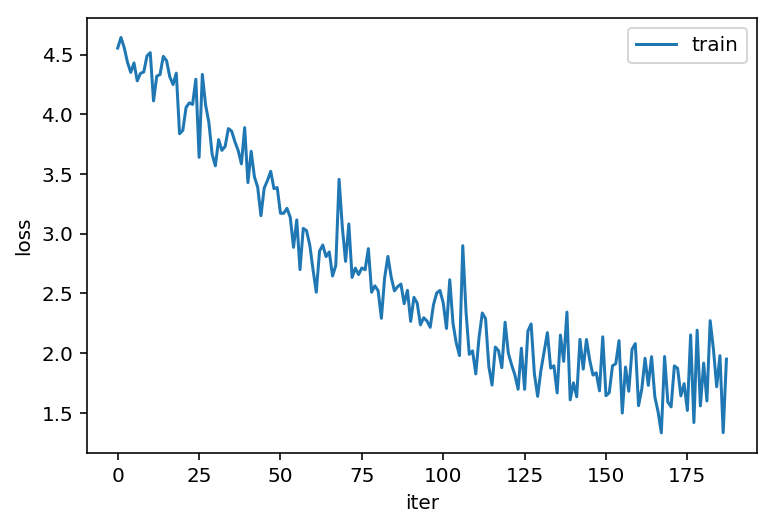

188
Epoch: 188, Iteration: 177300, Loss: 1.536117672920227
Epoch: 188, Iteration: 177400, Loss: 1.5581153631210327
Epoch: 188, Iteration: 177500, Loss: 1.3372429609298706
Epoch: 188, Iteration: 177600, Loss: 1.589422583580017
Epoch: 188, Iteration: 177700, Loss: 1.7068686485290527
Epoch: 188, Iteration: 177800, Loss: 1.6482272148132324
Epoch: 188, Iteration: 177900, Loss: 1.6591495275497437
Epoch: 188, Iteration: 178000, Loss: 1.5609475374221802
Epoch: 188, Iteration: 178100, Loss: 1.5107972621917725
Epoch: 188, Iteration: 178200, Loss: 1.707984209060669


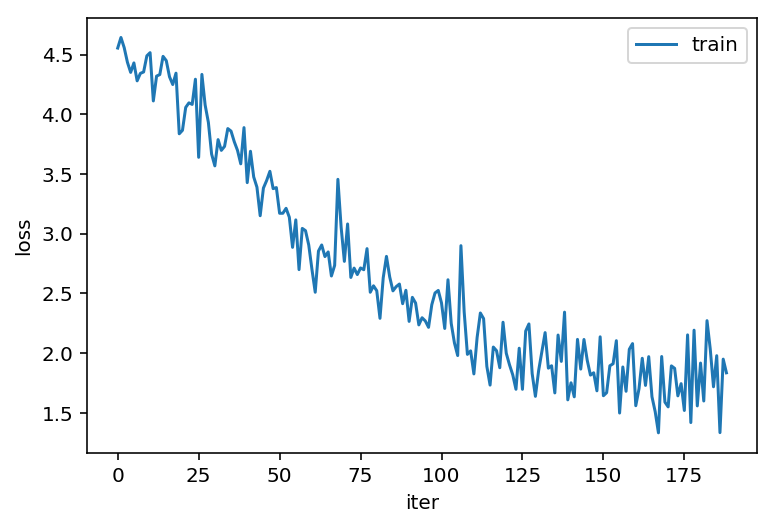

189
Epoch: 189, Iteration: 178300, Loss: 1.0338248014450073
Epoch: 189, Iteration: 178400, Loss: 1.487415075302124
Epoch: 189, Iteration: 178500, Loss: 1.485315203666687
Epoch: 189, Iteration: 178600, Loss: 1.7816498279571533
Epoch: 189, Iteration: 178700, Loss: 1.2818872928619385
Epoch: 189, Iteration: 178800, Loss: 1.864888310432434
Epoch: 189, Iteration: 178900, Loss: 1.2919816970825195
Epoch: 189, Iteration: 179000, Loss: 1.5399574041366577
Epoch: 189, Iteration: 179100, Loss: 1.3656169176101685


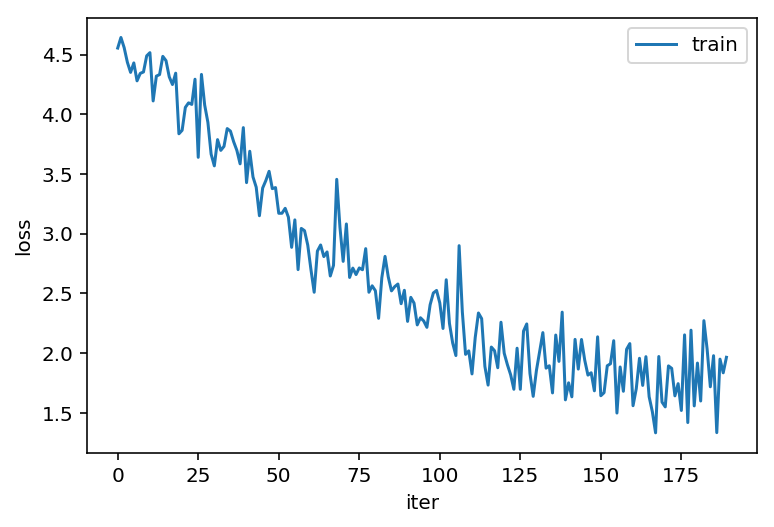

190
Epoch: 190, Iteration: 179200, Loss: 1.4879056215286255
Epoch: 190, Iteration: 179300, Loss: 1.594689965248108
Epoch: 190, Iteration: 179400, Loss: 1.233733892440796
Epoch: 190, Iteration: 179500, Loss: 1.951427698135376
Epoch: 190, Iteration: 179600, Loss: 1.6639724969863892
Epoch: 190, Iteration: 179700, Loss: 1.7170259952545166
Epoch: 190, Iteration: 179800, Loss: 1.0439077615737915
Epoch: 190, Iteration: 179900, Loss: 1.5436162948608398
Epoch: 190, Iteration: 180000, Loss: 1.618751049041748
Epoch: 190, Iteration: 180100, Loss: 1.8164141178131104


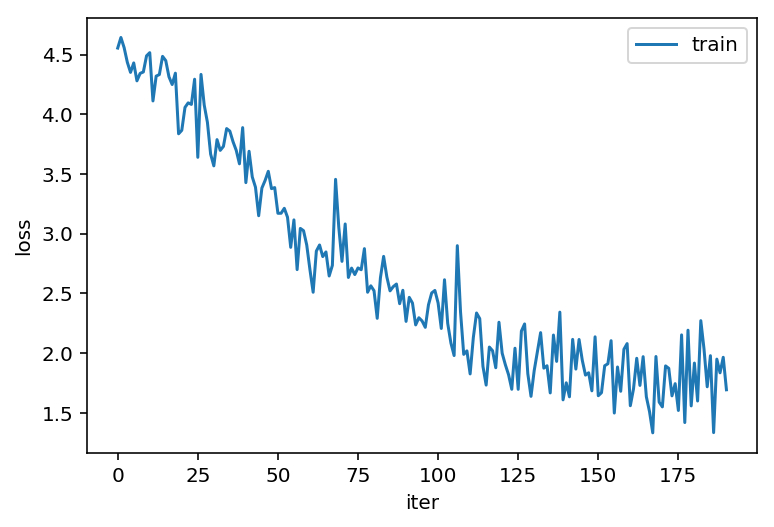

191
Epoch: 191, Iteration: 180200, Loss: 1.798427700996399
Epoch: 191, Iteration: 180300, Loss: 1.3221491575241089
Epoch: 191, Iteration: 180400, Loss: 1.520409107208252
Epoch: 191, Iteration: 180500, Loss: 1.9439078569412231
Epoch: 191, Iteration: 180600, Loss: 1.179121971130371
Epoch: 191, Iteration: 180700, Loss: 1.754480004310608
Epoch: 191, Iteration: 180800, Loss: 1.1103941202163696
Epoch: 191, Iteration: 180900, Loss: 1.7285029888153076
Epoch: 191, Iteration: 181000, Loss: 1.2241908311843872


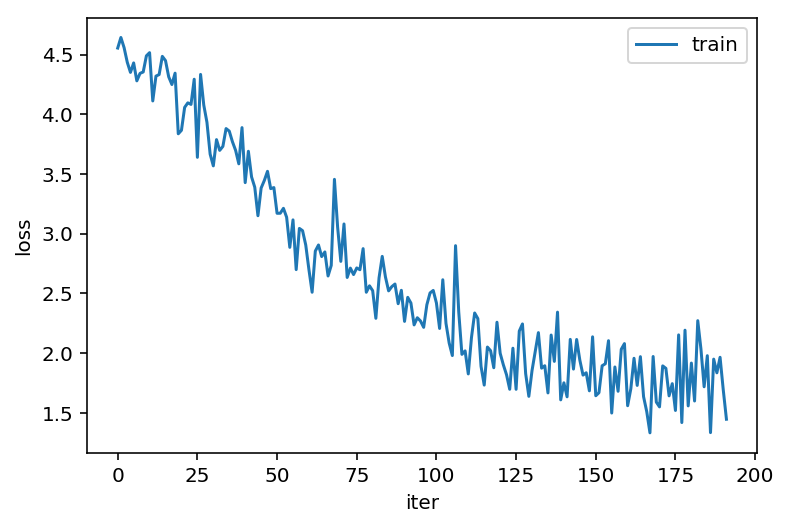

192
Epoch: 192, Iteration: 181100, Loss: 1.583312749862671
Epoch: 192, Iteration: 181200, Loss: 1.801916241645813
Epoch: 192, Iteration: 181300, Loss: 1.4767426252365112
Epoch: 192, Iteration: 181400, Loss: 1.7015188932418823
Epoch: 192, Iteration: 181500, Loss: 1.477126121520996
Epoch: 192, Iteration: 181600, Loss: 1.7955882549285889
Epoch: 192, Iteration: 181700, Loss: 1.7556127309799194
Epoch: 192, Iteration: 181800, Loss: 1.6691310405731201
Epoch: 192, Iteration: 181900, Loss: 1.631934642791748


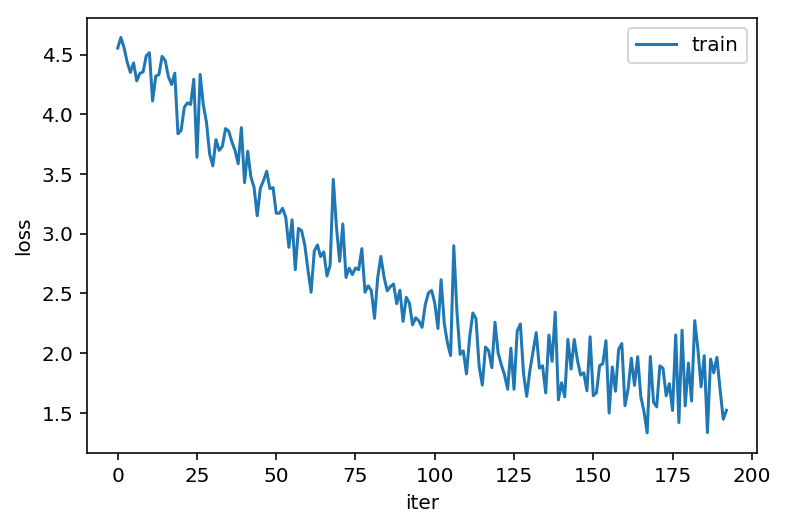

193
Epoch: 193, Iteration: 182100, Loss: 1.3877525329589844
Epoch: 193, Iteration: 182200, Loss: 2.0208075046539307
Epoch: 193, Iteration: 182300, Loss: 1.8067148923873901
Epoch: 193, Iteration: 182400, Loss: 1.1016403436660767
Epoch: 193, Iteration: 182500, Loss: 1.4369251728057861
Epoch: 193, Iteration: 182600, Loss: 1.6931530237197876
Epoch: 193, Iteration: 182700, Loss: 1.3807852268218994
Epoch: 193, Iteration: 182800, Loss: 1.4751025438308716
Epoch: 193, Iteration: 182900, Loss: 1.7313061952590942


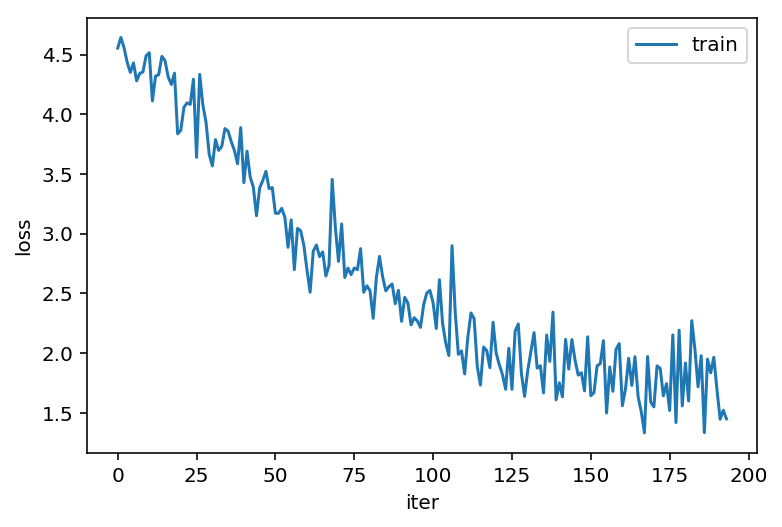

194
Epoch: 194, Iteration: 183000, Loss: 1.376244306564331
Epoch: 194, Iteration: 183100, Loss: 1.5493221282958984
Epoch: 194, Iteration: 183200, Loss: 1.54170823097229
Epoch: 194, Iteration: 183300, Loss: 1.8419440984725952
Epoch: 194, Iteration: 183400, Loss: 1.7882856130599976
Epoch: 194, Iteration: 183500, Loss: 1.6825851202011108
Epoch: 194, Iteration: 183600, Loss: 1.5245188474655151
Epoch: 194, Iteration: 183700, Loss: 1.6746196746826172
Epoch: 194, Iteration: 183800, Loss: 1.717745065689087


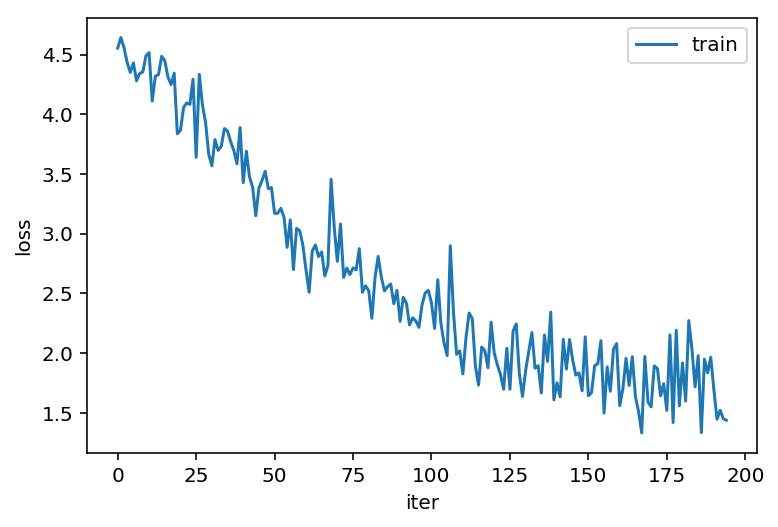

195
Epoch: 195, Iteration: 183900, Loss: 1.592842936515808
Epoch: 195, Iteration: 184000, Loss: 1.9914354085922241
Epoch: 195, Iteration: 184100, Loss: 1.6967169046401978
Epoch: 195, Iteration: 184200, Loss: 1.556523084640503
Epoch: 195, Iteration: 184300, Loss: 1.4570990800857544
Epoch: 195, Iteration: 184400, Loss: 1.5335667133331299
Epoch: 195, Iteration: 184500, Loss: 1.41887366771698
Epoch: 195, Iteration: 184600, Loss: 1.6758209466934204
Epoch: 195, Iteration: 184700, Loss: 1.3637351989746094
Epoch: 195, Iteration: 184800, Loss: 1.588143229484558


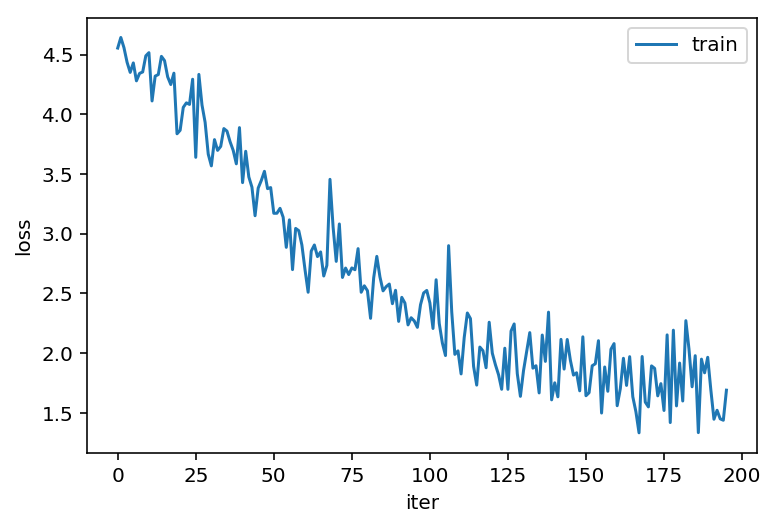

196
Epoch: 196, Iteration: 184900, Loss: 2.054591178894043
Epoch: 196, Iteration: 185000, Loss: 1.6275712251663208
Epoch: 196, Iteration: 185100, Loss: 1.9857077598571777
Epoch: 196, Iteration: 185200, Loss: 1.7062397003173828
Epoch: 196, Iteration: 185300, Loss: 1.2231568098068237
Epoch: 196, Iteration: 185400, Loss: 1.706251859664917
Epoch: 196, Iteration: 185500, Loss: 1.6472246646881104
Epoch: 196, Iteration: 185600, Loss: 1.5658633708953857
Epoch: 196, Iteration: 185700, Loss: 1.3949016332626343


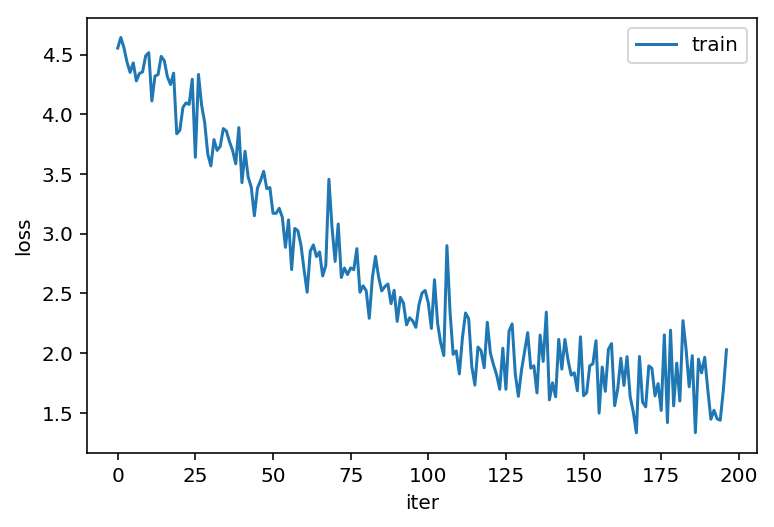

197
Epoch: 197, Iteration: 185800, Loss: 1.7103216648101807
Epoch: 197, Iteration: 185900, Loss: 1.5167145729064941
Epoch: 197, Iteration: 186000, Loss: 1.7965295314788818
Epoch: 197, Iteration: 186100, Loss: 1.6098731756210327
Epoch: 197, Iteration: 186200, Loss: 1.1915959119796753
Epoch: 197, Iteration: 186300, Loss: 1.3899699449539185
Epoch: 197, Iteration: 186400, Loss: 1.872604489326477
Epoch: 197, Iteration: 186500, Loss: 1.8210763931274414
Epoch: 197, Iteration: 186600, Loss: 1.8985247611999512
Epoch: 197, Iteration: 186700, Loss: 1.6655254364013672


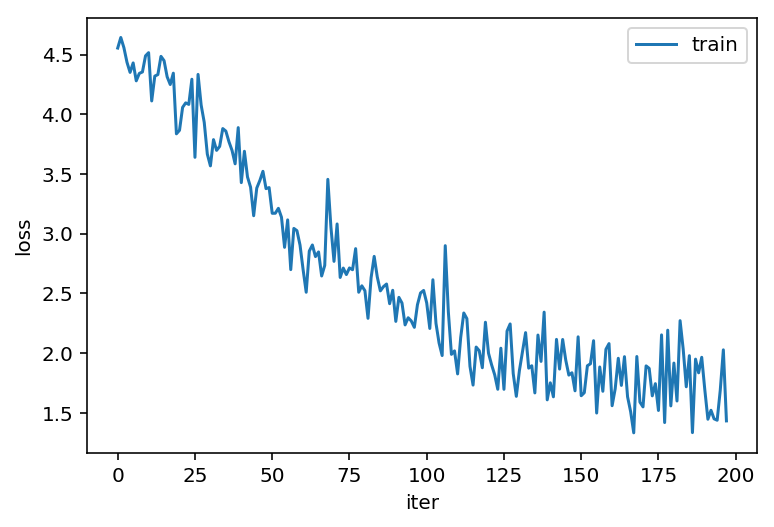

198
Epoch: 198, Iteration: 186800, Loss: 1.544646143913269
Epoch: 198, Iteration: 186900, Loss: 1.7366936206817627
Epoch: 198, Iteration: 187000, Loss: 1.23666512966156
Epoch: 198, Iteration: 187100, Loss: 1.863487958908081
Epoch: 198, Iteration: 187200, Loss: 1.3710579872131348
Epoch: 198, Iteration: 187300, Loss: 1.8175677061080933
Epoch: 198, Iteration: 187400, Loss: 1.4692131280899048
Epoch: 198, Iteration: 187500, Loss: 1.9057044982910156
Epoch: 198, Iteration: 187600, Loss: 1.3615447282791138


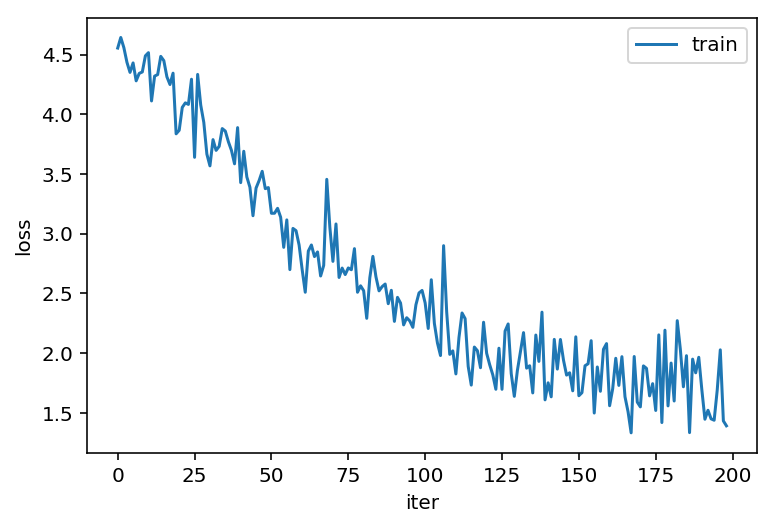

199
Epoch: 199, Iteration: 187700, Loss: 1.4279309511184692
Epoch: 199, Iteration: 187800, Loss: 1.5316927433013916
Epoch: 199, Iteration: 187900, Loss: 1.6535183191299438
Epoch: 199, Iteration: 188000, Loss: 1.3544034957885742
Epoch: 199, Iteration: 188100, Loss: 2.0455751419067383
Epoch: 199, Iteration: 188200, Loss: 1.7872017621994019
Epoch: 199, Iteration: 188300, Loss: 1.8806228637695312
Epoch: 199, Iteration: 188400, Loss: 2.2569868564605713
Epoch: 199, Iteration: 188500, Loss: 1.4799262285232544
Epoch: 199, Iteration: 188600, Loss: 1.6737185716629028


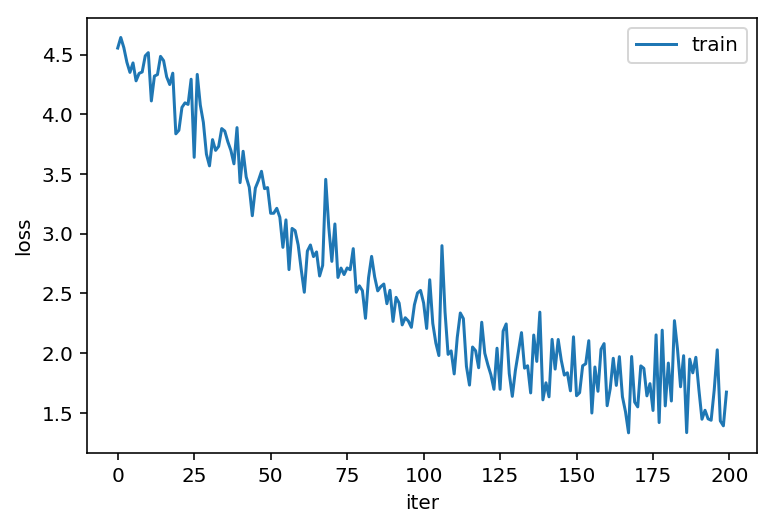

In [88]:
%matplotlib inline
import time
#seq len
input_dim = network_input.shape[1]

model = LSTMGenerator(100, 512,n_vocab, batch_size=64)
model.apply(init_weights)
model.to(device)
# loss_function = nn.NLLLoss()
loss_function = nn.CrossEntropyLoss()
optimizer = optim.RMSprop(model.parameters(), lr=0.001)
loss_logger = []
loss_logger_val = []
# fig = plt.figure()
# ax = fig.add_subplot(1, 1, 1)
# ax.set_xlabel("epochs")
# ax.set_ylabel("loss")
it = 0
for epoch in range(200):
  model.train()
  loss_epoch = []
  print(epoch)
#   model.zero_grad()
#   model.first_hidden_layer = model.init_hidden()
#   model.second_hidden_layer = model.init_hidden()
  for i, (batch_in, batch_gt) in enumerate(seqs_t_batch(datasets1["train"], 64, True)):
    it += 1
    model.first_hidden_layer = model.init_hidden()
    model.second_hidden_layer = model.init_hidden()
    
    #prob for the batch
#     print(batch_in.view(batch_in.shape[1], batch_in.shape[0], -1).shape)
    prediction = model(batch_in.view(batch_in.shape[-1], batch_in.shape[0], -1).float())
#     print(prediction.shape)
    
    log_loss = loss_function(prediction.view(prediction.shape[1], -1), batch_gt)
#     loss = np.exp(log_loss.item())
    loss = log_loss.item()
    if it % 100 == 0 and i > 0:
      print("Epoch: {}, Iteration: {}, Loss: {}".format(epoch, it, loss))
      loss_epoch.append(loss)
    optimizer.zero_grad()
    log_loss.backward()
    optimizer.step()
    

#   avg_epoch_loss = np.mean(loss_epoch)
  loss_logger.append(loss)
  torch.save(model.state_dict(), 'models/model_{time}_{epoch}_{loss}.pth'.format(time=time.time(), epoch=epoch,loss=np.mean(loss_epoch)))
#   with open('models/model_{time}_{epoch}_{loss}.pickle'.format(time=time.time(), epoch=epoch,loss=np.mean(loss_epoch)), 'wb') as f:
#     pickle.dump(model, f)
#   
#   ax.plot(range(len(loss_logger)), loss_logger)
  plt.plot(range(len(loss_logger)), loss_logger)
  plt.xlabel("iter")
  plt.ylabel("loss")
#   plt.plot(range(len(loss_logger_val)), loss_logger_val)
  plt.legend(['train'])
  plt.show()
#     if i%100 == 0 and i > 0:
#       print("Epoch: {}, Iteration: {}, Loss: {}".format(epoch, i, loss))
#       with torch.no_grad():
#         print(np.argmax(prediction[0][0].cpu().numpy()), batch_gt.cpu()[0].item())
#       loss_epoch.append(loss)
#     log_loss.backward()
#     optimizer.step()
#   avg_epoch_loss = np.mean(loss_epoch)
#   loss_logger.append(avg_epoch_loss)
# #   ax.plot(range(len(loss_logger)), loss_logger)
#   plt.plot(range(len(loss_logger)), los input_size=self.embedding_dim,s_logger)
#   plt.show()
#   model.eval()
#   for batch_in,batch_gt in seq_t_b(datasets1["val"], 1):
    
    

In [65]:
# """ Generate notes from the neural network based on a sequence of notes """
# pick a random sequence from the input as a starting point for the prediction
test_model = LSTMGenerator(sequence_length, 512, n_vocab)
with open("models/model_1552141957.1376085_198_1.0804298594594002.pickle", 'rb') as model_f:
    m = pickle.load(model_f)
print(m)
test_model.load_state_dict(m.state_dict())
test_model.to(device)
test_model.first_hidden_layer

LSTMGenerator(
  (lstm_layer): LSTM(100, 512)
  (lstm_layer1): LSTM(512, 512)
  (from_hidden_to_linear): Linear(in_features=512, out_features=256, bias=True)
  (from_hidden_to_vocab): Linear(in_features=256, out_features=456, bias=True)
  (log_softmax): LogSoftmax()
)


RuntimeError: Error(s) in loading state_dict for LSTMGenerator:
	Missing key(s) in state_dict: "lstm_layer2.weight_ih_l0", "lstm_layer2.weight_hh_l0", "lstm_layer2.bias_ih_l0", "lstm_layer2.bias_hh_l0". 
	size mismatch for from_hidden_to_vocab.weight: copying a param with shape torch.Size([456, 256]) from checkpoint, the shape in current model is torch.Size([359, 256]).
	size mismatch for from_hidden_to_vocab.bias: copying a param with shape torch.Size([456]) from checkpoint, the shape in current model is torch.Size([359]).

In [130]:
# """ Generate notes from the neural network based on a sequence of notes """
# pick a random sequence from the input as a starting point for the prediction
# test_model = LSTMGenerator(sequence_length, 512, n_vocab, 1)
# with open("models/model_1552141879.2741838_187_1.0919290938798119.pickle", 'rb') as model_f:
#     m = pickle.load(model_f)

# test_model.load_state_dict(m.state_dict())
# print(test_model.batch_size)
# test_model.to(device)
# test_model.first_hidden_layer = model.init_hidden()
# test_model.second_hidden_layer = model.init_hidden()
start = numpy.random.randint(0, len(network_input)-1)
print(start)
batch_size = 1
test_model = LSTMGenerator(sequence_length, 512, n_vocab, batch_size)
test_model_state_dict = torch.load("models/model_1553884105.9575803_199_1.709157693386078.pth")
test_model.load_state_dict(test_model_state_dict)
test_model.to(device)

print(test_model.batch_size)
# test_model.batch_size = 1
# test_model.first_hidden_layer = model.init_hidden()
# test_model.second_hidden_layer = model.init_hidden()
# start = numpy.random.random((1, 2, sequence_length))
int_to_note = dict((number, note) for number, note in enumerate(pitchnames))
pattern = network_input[start: start + batch_size]
# pattern = start
print(pattern.shape)
prediction_output = []
# generate 500 notes
with torch.no_grad():
    for i,note_index in enumerate(range(500)):
      prediction_input = np.reshape(pattern, (1, batch_size, sequence_length))
      prediction_input = torch.Tensor(prediction_input).to(device)
      prediction = test_model(prediction_input)
      index = torch.argmax(prediction[0][0]).item()
      result = int_to_note[index]
      print('\r', 'Predicted ', i, " ",result, end='')
      print('Predicted ', i, " ",result)
      if result == 'start' or result == 'end':
        continue
      prediction_output.append(result)
      pattern[:-1] = pattern[1:]
      pattern[-1] = index
    #   pattern.append(index)
    #   pattern = pattern[1:len(pattern)]

27669
1
(1, 100, 1)
 Predicted  0   0.3Predicted  0   0.3
 Predicted  1   B-2Predicted  1   B-2
 Predicted  2   G2Predicted  2   G2
 Predicted  3   E-2Predicted  3   E-2
 Predicted  4   A1Predicted  4   A1
 Predicted  5   F2Predicted  5   F2
 Predicted  6   F2Predicted  6   F2
 Predicted  7   G5Predicted  7   G5
 Predicted  8   F2Predicted  8   F2
 Predicted  9   F2Predicted  9   F2
 Predicted  10   G3Predicted  10   G3
 Predicted  11   G2Predicted  11   G2
 Predicted  12   G2Predicted  12   G2
 Predicted  13   G3Predicted  13   G3
 Predicted  14   F2Predicted  14   F2
 Predicted  15   F2Predicted  15   F2
 Predicted  16   F2Predicted  16   F2
 Predicted  17   F2Predicted  17   F2
 Predicted  18   F2Predicted  18   F2
 Predicted  19   F2Predicted  19   F2
 Predicted  20   F2Predicted  20   F2
 Predicted  21   F2Predicted  21   F2
 Predicted  22   F2Predicted  22   F2
 Predicted  23   F2Predicted  23   F2
 Predicted  24   F2Predicted  24   F2
 Predicted  25   F2Predicted  25   F2
 Predi

In [131]:
offset = 0
output_notes = []

# create note and chord objects based on the values generated by the model

for pattern in prediction_output:
    # pattern is a chord
    if ('.' in pattern) or pattern.isdigit():
        notes_in_chord = pattern.split('.')
        notes = []
        for current_note in notes_in_chord:
            new_note = note.Note(int(current_note))
            new_note.storedInstrument = instrument.Piano()
            notes.append(new_note)
        new_chord = chord.Chord(notes)
        new_chord.offset = offset
        output_notes.append(new_chord)
    # pattern is a note
    else:
        new_note = note.Note(pattern)
        new_note.offset = offset
        new_note.storedInstrument = instrument.Piano()
        output_notes.append(new_note)

    # increase offset each iteration so that notes do not stack
    offset += 0.25

In [132]:
midi_stream = stream.Stream(output_notes)

midi_stream.write('midi', fp='liat2.mid')

'liat2.mid'

In [96]:
output_notes[2].offset

1.0

In [55]:
test_model = LSTMGenerator(sequence_length, 512, n_vocab, 1)
with open("models/model_1552141957.1376085_198_1.0804298594594002.pickle", 'rb') as model_f:
    m = pickle.load(model_f)

test_model.load_state_dict(m.state_dict())

In [56]:
for p in m.state_dict().values():
    print(p.shape)

torch.Size([2048, 100])
torch.Size([2048, 512])
torch.Size([2048])
torch.Size([2048])
torch.Size([2048, 512])
torch.Size([2048, 512])
torch.Size([2048])
torch.Size([2048])
torch.Size([256, 512])
torch.Size([256])
torch.Size([456, 256])
torch.Size([456])


In [58]:
for p in test_model.state_dict().values():
    print(p.shape)

torch.Size([2048, 100])
torch.Size([2048, 512])
torch.Size([2048])
torch.Size([2048])
torch.Size([2048, 512])
torch.Size([2048, 512])
torch.Size([2048])
torch.Size([2048])
torch.Size([256, 512])
torch.Size([256])
torch.Size([456, 256])
torch.Size([456])


In [68]:
test_model.init_hidden()[0].shape

torch.Size([1, 1, 512])

In [90]:
test_model.first_hidden_layer

torch.Size([1, 1, 512])